# 0. Environment Setup

## Mount Google Drive

To access the GitHub project and associated files, you need to mount your Google Drive to Colab. This process allows you to read and write files directly from your Google Drive within the Colab environment

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Set your parameters

Please make sure to update the following parameters to your own:

- **Project ID**: The BigQuery project ID to query the MIMIC-III v1.4 raw data. (If you're not sure what your project ID is, check details in `notebooks/MIMIC_III_Data_Access_Instructions.ipynb`.)
- **BASE_PATH**: The path where the GitHub project will be cloned.

In [ ]:
# Remember to update the BigQuery project ID to your own to query raw data
PROJECT_ID = 'sepsis-mimic3'

# Remember to update this variable to your own path
# BASE_PATH is where the GitHub project will be cloned
BASE_PATH = "/content/drive/MyDrive/GitHub_Testing"

## Importing libraries.

In [ ]:
%cd {BASE_PATH}/SepsisOnset_TraumaCohort

import os
import numpy as np
import pandas as pd
import keras
import tensorflow as tf
from matplotlib import pyplot as plt

# for dataset
# from scripts.all_icu_data import load_or_generate_nighttime_df
# for model
from tensorflow.keras.utils import to_categorical

# Initialize the ProjectPaths object
from src import path_manager
project_path_obj = path_manager.ProjectPaths(f'{BASE_PATH}/SepsisOnset_TraumaCohort')

/content/drive/MyDrive/GitHub_Testing/SepsisOnset_TraumaCohort


In [ ]:
MODEL_FOLDER = '/content/drive/MyDrive/Colab Notebooks/All_ICU_notebook/Model'
DATA_FOLDER = project_path_obj.final_dataset_path

## Load Dataset

### All ICU Data

In [ ]:
file_path = os.path.join(DATA_FOLDER, 'nighttime_allICU_18to6H_7F_filled_final.pkl')

if os.path.exists(file_path):
    print(f"Loading existing nighttime data from {file_path}")
    night_ti_df = pd.read_pickle(file_path)
else:
    print(f"File not found: {file_path}")

print(night_ti_df.shape)
# Drop Nan
is_any_nan = night_ti_df['Temporal Features'].apply(lambda x: np.isnan(x).any())
night_df_filled = night_ti_df[~is_any_nan]
night_df_filled

Loading existing nighttime data from /content/drive/MyDrive/GitHub_Testing/SepsisOnset_TraumaCohort/dataset/nighttime_allICU_18to6H_7F_filled_final.pkl
(283062, 7)


,subject_id,hadm_id,icustay_id,Date,Night,Temporal Features,isNan
0,58526,100001,275225,2117-09-11,1,"[[112.0, 170.0, 86.0, 106.0, 16.0, 36.61111111...","[[False, False, False, False, False, True, Fal..."
2,58526,100001,275225,2117-09-13,3,"[[96.0, 171.0, 94.0, 113.0, 18.0, 37.388888888...","[[False, False, False, False, True, True, True..."
4,54610,100003,209281,2150-04-17,1,"[[72.0, 85.0, 43.5, 54.0, 14.666666666666666, ...","[[False, False, False, False, False, True, Fal..."
5,54610,100003,209281,2150-04-18,2,"[[85.0, 128.0, 56.0, 74.0, 16.0, 36.3888888888...","[[False, False, False, False, False, True, Fal..."
6,9895,100006,291788,2108-04-06,1,"[[122.0, 124.0, 70.0, 88.0, 18.0, 36.111111111...","[[False, False, False, False, False, True, Fal..."
...,...,...,...,...,...,...,...
283057,27200,199998,293589,2119-02-20,3,"[[85.0, 146.0, 57.5, 85.0, 19.0, 37.5999984741...","[[False, False, False, False, False, False, Fa..."
283058,40370,199999,211153,2136-04-06,3,"[[64.0, 134.0, 51.0, 73.0, 17.0, 36.5555555555...","[[False, False, False, False, False, True, Fal..."
283059,40370,199999,211153,2136-04-07,4,"[[67.0, 143.0, 52.0, 74.0, 28.0, 36.4444444444...","[[False, False, False, False, False, False, Fa..."
283060,40370,199999,211153,2136-04-08,5,"[[80.0, 167.0, 54.0, 84.0, 23.0, 36.5, 95.0], ...","[[False, False, False, False, False, True, Fal..."


### Trauma Cohot
In this section, we will load the complete Post-Traumatic Sepsis dataset (without missing values), which is derived from the MIMIC-III v1.4 dataset. For a comprehensive explanation of the dataset construction and additional relevant information, please refer to the `notebooks/Early_Sepsis_Onset_Detection_Setup.ipynb` file.

The dataset table comprises the following columns:

- **Temporal Features**: Multivariate time-series input data with dimensions (# of timestamps, # of features).

Each row in the dataset corresponds to one nighttime instance, and includes patient identifiers (`subject_id`, `hadm_id`) and a timestamp ID (`Date`, `Night`).

In [ ]:
file_path = os.path.join(DATA_FOLDER, 'PostTraumaticSepsis_dataset_wo_nan.pkl')

if os.path.exists(file_path):
    print(f"Loading existing nighttime data from {file_path}")
    truma_cohort_df = pd.read_pickle(file_path)
else:
    print(f"File not found: {file_path}")

truma_cohort_ids = truma_cohort_df.hadm_id.unique()
positive_samples = truma_cohort_df[truma_cohort_df.Label == 1]
print("# of truma", truma_cohort_ids.shape[0],
      f"# of positive sample {positive_samples.shape[0]} of sepsis pacient {positive_samples.hadm_id.nunique()}")
truma_cohort_df.head()

Loading existing nighttime data from /content/drive/MyDrive/GitHub_Testing/SepsisOnset_TraumaCohort/dataset/PostTraumaticSepsis_dataset_wo_nan.pkl
# of truma 1522 # of positive sample 440 of sepsis pacient 440


,subject_id,hadm_id,Date,Night,Temporal Features,isNan,Label,onset_datetime,Fold
0,19984,100132,2179-03-06,002,"[[90.0, 142.0, 73.0, 99.0, 16.0, 37.5555547078...","[[0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, ...",0,NaN,3
1,19984,100132,2179-03-07,003,"[[97.0, 129.0, 61.0, 86.0, 20.0, 36.2222205268...","[[0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, ...",0,NaN,3
2,19984,100132,2179-03-08,004,"[[68.0, 87.0, 47.0, 60.33330154418945, 15.0, 3...","[[0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, ...",0,NaN,3
3,19984,100132,2179-03-09,005,"[[96.0, 133.0, 71.0, 91.6667022705078, 22.0, 3...","[[0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, ...",0,NaN,3
4,19984,100132,2179-03-10,006,"[[107.0, 188.0, 85.0, 119.33300018310548, 23.0...","[[0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, ...",0,NaN,3


In [ ]:
truma_subject_ids = truma_cohort_df.subject_id.unique()

truma_records = night_df_filled[night_df_filled.subject_id.isin(truma_subject_ids)]
nontruma_records = night_df_filled[~night_df_filled.subject_id.isin(truma_subject_ids)]
print(truma_records.shape, nontruma_records.shape)

(19759, 7) (192356, 7)


## Sample

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_nighttime_features(
    sample: np.array,
    feature_names: list[str],
    start_hour: int = 18,
    title: str = "Nighttime Features (6 pm → 6 am)"
) -> pd.DataFrame:
    """
    Build a DataFrame indexed from start_hour through next-day 6 am,
    then plot all features over that 13-hour window.

    Parameters
    ----------
    sample : array-like, shape (T=13, F)
        2D array of T hourly measurements.
    feature_names : list of str, length F
        Column names for each feature.
    start_hour : int, optional
        Hour to start labeling (default 18 for 6 pm).
    title : str, optional
        Plot title.

    Returns
    -------
    sample_df : pd.DataFrame
        DataFrame of the sample, indexed by hour labels.
    """
    T = sample.shape[0]
    # generate labels "18:00, 19:00, …, 23:00, 00:00, …, 06:00"
    hour_labels = [f"{(start_hour + i) % 24:02d}:00" for i in range(T)]

    # build DataFrame with custom index
    sample_df = pd.DataFrame(sample, columns=feature_names, index=hour_labels)
    # display(sample_df)

    # plot
    fig, ax = plt.subplots(figsize=(10, 6))
    for col in sample_df.columns:
        ax.plot(sample_df.index, sample_df[col], label=col)

    ax.set_xlabel("Time of Day")
    ax.set_ylabel("Value")
    ax.set_title(title)
    ax.legend(loc="upper right", fontsize="small", bbox_to_anchor=(1.15, 1),   # (x, y) relative to axes

              )
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    return sample_df

(13, 7)


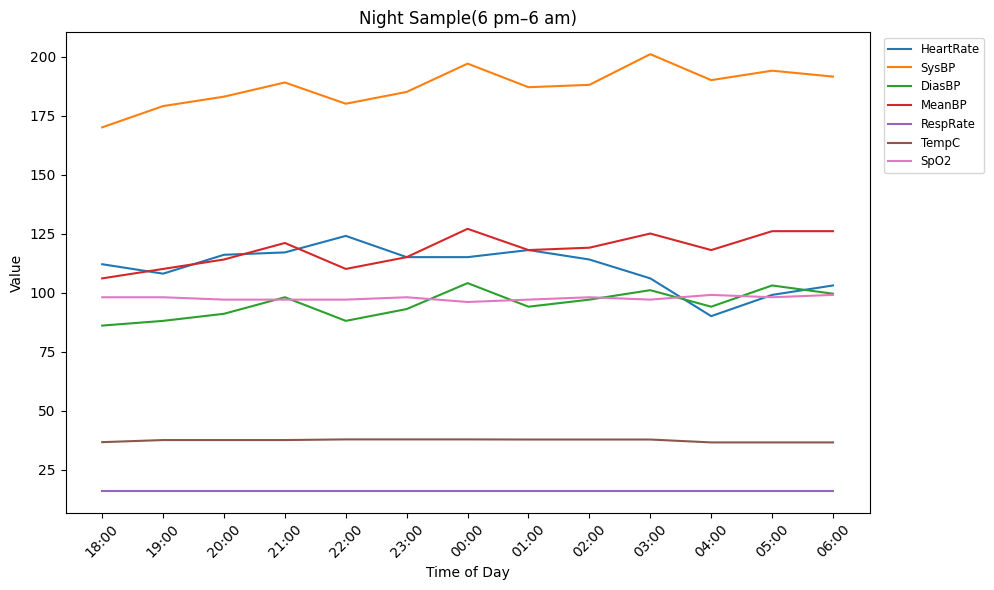

,HeartRate,SysBP,DiasBP,MeanBP,RespRate,TempC,SpO2
18:00,112.0,170.0,86.0,106.0,16.0,36.611111,98.0
19:00,108.0,179.0,88.0,110.0,16.0,37.500000,98.0
20:00,116.0,183.0,91.0,114.0,16.0,37.500000,97.0
21:00,117.0,189.0,98.0,121.0,16.0,37.500000,97.0
22:00,124.0,180.0,88.0,110.0,16.0,37.777778,97.0
23:00,115.0,185.0,93.0,115.0,16.0,37.777778,98.0
00:00,115.0,197.0,104.0,127.0,16.0,37.777778,96.0
01:00,118.0,187.0,94.0,118.0,16.0,37.722222,97.0
02:00,114.0,188.0,97.0,119.0,16.0,37.722222,98.0
03:00,106.0,201.0,101.0,125.0,16.0,37.722222,97.0


In [ ]:
print(night_df_filled['Temporal Features'][0].shape) #T:13(6pm-6am), F:['HeartRate', 'SysBP', 'DiasBP', 'MeanBP', 'RespRate', 'TempC', 'SpO2']

sample = night_df_filled['Temporal Features'][0]
feature_names = ['HeartRate', 'SysBP', 'DiasBP', 'MeanBP',
                 'RespRate', 'TempC', 'SpO2', #'Glucose', 'fio2'
                 ]
plot_nighttime_features(sample, feature_names=feature_names,
                        start_hour=18, title= "Night Sample(6 pm–6 am)")

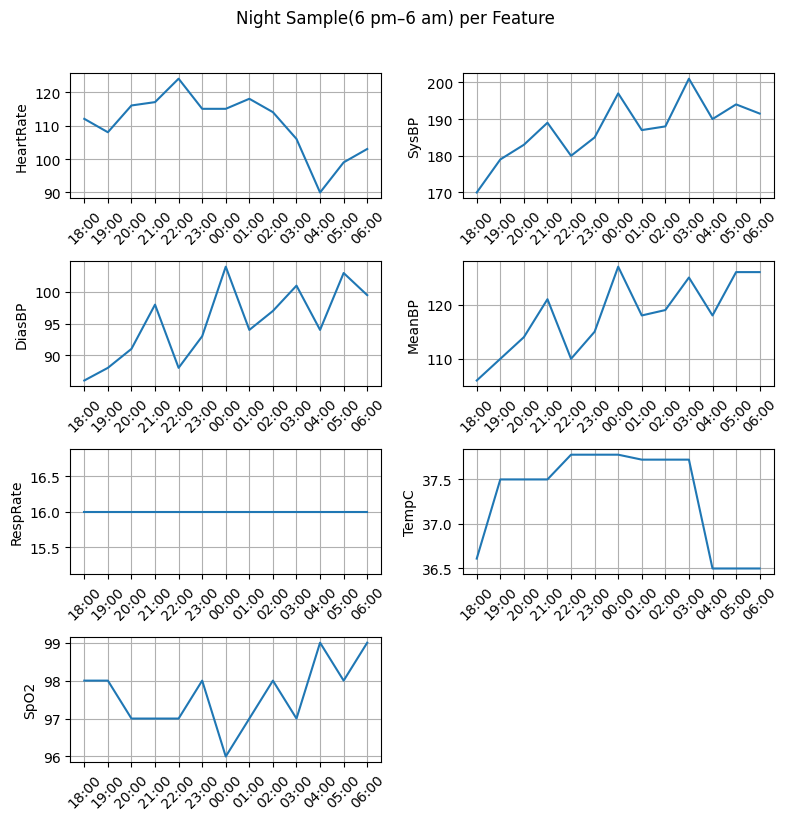

,HeartRate,SysBP,DiasBP,MeanBP,RespRate,TempC,SpO2
18:00,112.0,170.0,86.0,106.0,16.0,36.611111,98.0
19:00,108.0,179.0,88.0,110.0,16.0,37.500000,98.0
20:00,116.0,183.0,91.0,114.0,16.0,37.500000,97.0
21:00,117.0,189.0,98.0,121.0,16.0,37.500000,97.0
22:00,124.0,180.0,88.0,110.0,16.0,37.777778,97.0
23:00,115.0,185.0,93.0,115.0,16.0,37.777778,98.0
00:00,115.0,197.0,104.0,127.0,16.0,37.777778,96.0
01:00,118.0,187.0,94.0,118.0,16.0,37.722222,97.0
02:00,114.0,188.0,97.0,119.0,16.0,37.722222,98.0
03:00,106.0,201.0,101.0,125.0,16.0,37.722222,97.0


In [ ]:
import math

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math

def plot_nighttime_features_subplots(
    sample: np.array,
    feature_names: list[str],
    start_hour: int = 18,
    ncols: int = 2,
    title_prefix: str = "Nighttime Features"
) -> pd.DataFrame:
    """
    Plot each feature in its own subplot over the 13-hour window,
    arranged in a grid with `ncols` columns.
    Each subplot shows its own x-axis labels.

    Returns the DataFrame for further inspection.
    """
    T, F = sample.shape
    hour_labels = [f"{(start_hour + i) % 24:02d}:00" for i in range(T)]
    sample_df = pd.DataFrame(sample, columns=feature_names, index=hour_labels)

    nrows = math.ceil(F / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(8, 2 * nrows), sharex=False)
    axes_flat = axes.flatten()

    for idx, col in enumerate(feature_names):
        ax = axes_flat[idx]
        ax.plot(range(T), sample_df[col], label=col)
        ax.set_ylabel(col)
        ax.grid(True)
        ax.set_xticks(range(T))
        ax.set_xticklabels(hour_labels, rotation=45)

    # 关闭多余的子图
    for ax in axes_flat[F:]:
        ax.axis('off')

    fig.suptitle(f"{title_prefix} per Feature", y=1.02)
    plt.tight_layout()
    plt.show()

    return sample_df


plot_nighttime_features_subplots(sample, feature_names=feature_names,
                        start_hour=18, title_prefix= "Night Sample(6 pm–6 am)")

In [ ]:
# corrspondng features list: 'HeartRate', 'SysBP', 'DiasBP', 'MeanBP', 'RespRate', 'TempC', 'SpO2', 'Glucose', 'fio2'
start_hour, T = 18,13
pd.DataFrame(night_df_filled.isNan[0], columns=['HeartRate', 'SysBP', 'DiasBP', 'MeanBP', 'RespRate', 'TempC', 'SpO2',
                                                # 'Glucose', 'fio2'
                                                ],
             index=[f"{(start_hour + i) % 24:02d}:00" for i in range(T)])
# False: means not nan, or have raw data
# True: is nan, data is filled

,HeartRate,SysBP,DiasBP,MeanBP,RespRate,TempC,SpO2
18:00,False,False,False,False,False,True,False
19:00,False,False,False,False,True,False,True
20:00,False,False,False,False,True,True,False
21:00,False,False,False,False,True,True,True
22:00,False,False,False,False,True,False,False
23:00,False,False,False,False,True,True,False
00:00,False,False,False,False,True,True,False
01:00,False,False,False,False,True,False,False
02:00,False,False,False,False,True,True,False
03:00,False,False,False,False,True,True,False


# Model

## Model Definition

### Autoencoder

In [ ]:
keras.layers.GRU

keras.src.layers.rnn.gru.GRU

In [ ]:
from keras import layers, models, Input
from keras.regularizers import l2

def Encoder_model(input_shape, name="encoder", drop_r=0.2):
    input_layer = Input(shape=input_shape)
    x = input_layer

    # LSTM Feature Extraction
    x = layers.Bidirectional(layers.GRU(units=128, return_sequences=True, kernel_regularizer=l2(0.001),
                                        reset_after=True
                                        ))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(rate=drop_r)(x)
    x = layers.Bidirectional(layers.GRU(units=64, return_sequences=True, kernel_regularizer=l2(0.001),
                                        reset_after=True
                                        ))(x)
    x = layers.BatchNormalization()(x)

    # Feed Forward Part
    # FCL
    # x = layers.Dense(units=512, activation='relu')(x)
    # x = layers.BatchNormalization()(x)
    # x = layers.Dense(units=32, activation='relu')(x)
    # x = layers.BatchNormalization()(x)

    # CNN
    # Feed Forward Part
    x = layers.Conv1D(filters=128, kernel_size=3, strides=1,
                      activation="relu", kernel_regularizer=l2(0.01),
                      # dilation_rate=1
                      )(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(rate=drop_r)(x)
    x = layers.Conv1D(filters=64, kernel_size=3, strides=2,
                      # dilation_rate=1s
                      )(x)
    x = layers.BatchNormalization()(x)

    # Output Feature Representation Vector
    x = layers.GlobalAveragePooling1D(data_format="channels_last")(x)
    # x = layers.GlobalMaxPooling1D()(x)

    return models.Model(input_layer, x, name=name)

# def Decoder_model(T=9, F=6, feature_vector_shape=32, drop_r=0.2):
#     latent_inputs = Input(shape=feature_vector_shape[1:])
#     x = layers.RepeatVector(n=T)(latent_inputs)
#     x = layers.LSTM(units=256, return_sequences=True, kernel_regularizer=l2(0.01))(x)
#     x = layers.BatchNormalization()(x)
#     # x = layers.Dropout(rate=drop_r)(x)
#     x = layers.Bidirectional(layers.LSTM(units=1024, return_sequences=True, kernel_regularizer=l2(0.01)))(x)
#     x = layers.BatchNormalization()(x)
#     # x = layers.Dropout(rate=drop_r)(x)
#     dec_output = layers.TimeDistributed(layers.Dense(units=F, kernel_regularizer=l2(0.01)))(x)
#     return models.Model(latent_inputs, dec_output, name="decoder")


def multimodal_AutoEncoder(input_shape_li, drop_r=0.2):
    # Create input layers for each encoder
    raw_inputs = layers.Input(shape=input_shape_li[0])
    delta_inputs = layers.Input(shape=input_shape_li[1])
    inputs = [raw_inputs, delta_inputs]

    # Init Encoders
    raw_encoder = Encoder_model(input_shape_li[0], name="night_encoder")
    delta_encoder = Encoder_model(input_shape_li[1], name="delta_encoder")
    encoders = [raw_encoder, delta_encoder]

    # Pass inputs through respective encoders
    embeddings = [raw_encoder(raw_inputs),
                  delta_encoder(delta_inputs)]
    # Combine the embeddings (using Concatenate)
    combined_emb = layers.Concatenate()(embeddings)
    # # Combine the embeddings (using Add)
    # combined_emb = layers.Add()(embeddings)

    # Decoder
    # feature_vector_shape=encoder.output_shape
    # latent_inputs = Input(shape=feature_vector_shape[1:])
    T, F = input_shape_li[0]
    x = layers.RepeatVector(n=T)(combined_emb)
    # x = layers.LSTM(units=1, return_sequences=True, kernel_regularizer=l2(0.001))(x)
    x = layers.Bidirectional(layers.GRU(units=64, return_sequences=True, kernel_regularizer=l2(0.001)))(x)
    x = layers.BatchNormalization()(x)
    # x = layers.Dropout(rate=drop_r)(x)
    x = layers.Bidirectional(layers.GRU(units=128, return_sequences=True, kernel_regularizer=l2(0.001)))(x)
    x = layers.BatchNormalization()(x)
    # x = layers.Dropout(rate=drop_r)(x)
    decoder_output = layers.TimeDistributed(layers.Dense(units=F, kernel_regularizer=l2(0.01)))(x)

    # Autoencoder
    autoencoder = models.Model(inputs, decoder_output, name="autoencoder")
    return encoders, autoencoder

# input_shape_li = [(13, 7), (13,7)] # T,F
# encoders, autoencoder = multimodal_AutoEncoder(input_shape_li, drop_r=0.2)

In [ ]:
night_df_filled['Temporal Features'][0].shape

(13, 7)

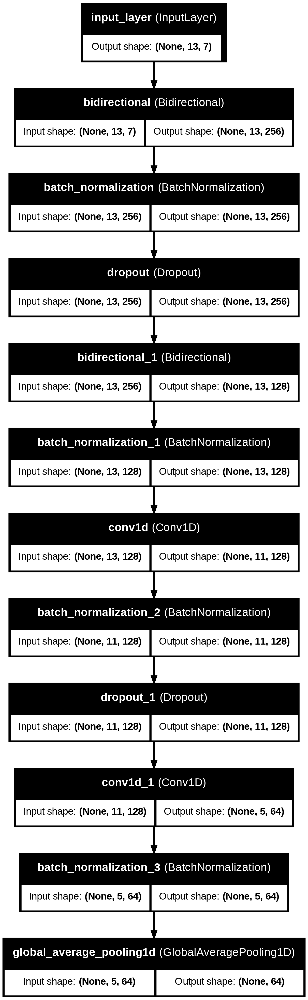

In [ ]:
input_shape_li = [(13, 7), (13,7)]
# encoders, autoencoder = multimodal_AutoEncoder(input_shape_li, drop_r=0.2)
raw_encoder = Encoder_model(input_shape_li[0], name="night_encoder")
keras.utils.plot_model(raw_encoder, show_shapes=True, show_layer_names=True)

Model: "night_encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 13, 7)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_2 (Bidirectional) │ (None, 13, 256)        │       105,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 13, 256)        │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 13, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_3 (Bidirectional) │ (None, 13, 128)        │       123,648 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 13, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 11, 128)        │        49,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 11, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 11, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_3 (Conv1D)               │ (None, 5, 64)          │        24,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 5, 64)          │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_1      │ (None, 64)             │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 305,088 (1.16 MB)

 Trainable params: 303,936 (1.16 MB)

 Non-trainable params: 1,152 (4.50 KB)

Model: "autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 13, 7)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_2       │ (None, 13, 7)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ night_encoder       │ (None, 64)        │    305,088 │ input_layer_1[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ delta_encoder       │ (None, 64)        │    305,088 │ input_layer_2[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 128)       │          0 │ night_encoder[0]… │
│ (Concatenate)       │                   │            │ delta_encoder[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector       │ (None, 13, 128)   │          0 │ concatenate[0][0] │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_6     │ (None, 13, 128)   │     74,496 │ repeat_vector[0]… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 13, 128)   │        512 │ bidirectional_6[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_7     │ (None, 13, 256)   │    198,144 │ batch_normalizat… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 13, 256)   │      1,024 │ bidirectional_7[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed    │ (None, 13, 7)     │      1,799 │ batch_normalizat… │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 886,151 (3.38 MB)

 Trainable params: 883,079 (3.37 MB)

 Non-trainable params: 3,072 (12.00 KB)

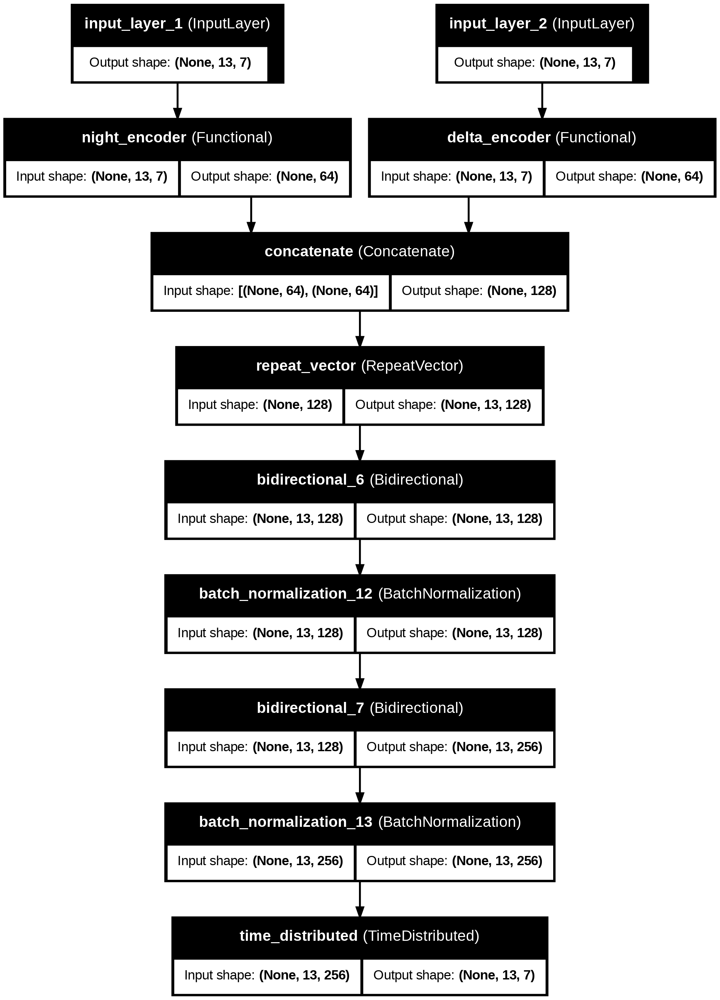

In [ ]:
# Instantiate the models
input_shape_li = [(13, 7), (13,7)]
encoders, autoencoder = multimodal_AutoEncoder(input_shape_li)

# # Print summary of the autoencoder model
encoders[0].summary()
# encoders[1].summary()
autoencoder.summary()

keras.utils.plot_model(autoencoder, show_shapes=True, show_layer_names=True)

### Classification

In [ ]:
# def classification_2encoder(input_shape_li, encoders,
#                             freeze_encoders = False,
#                             mlp_units=[128, 64],
#                             mlp_dropout_rate=0.5, regularizers_l2=0.001):
#     """
#     Builds a classification model using a pre-trained encoder followed by fully connected layers.

#     Args:
#         input_shape_li (tuple): Shape of the input data (excluding batch size).
#         encoder (Model): Pre-trained encoder model to extract features.
#         mlp_units (list): List of integers defining the units in the MLP layers.
#         mlp_dropout_rate (float): Dropout rate for the MLP layers.
#         regularizers_l2 (float): L2 regularization factor for the Dense layers.

#     Returns:
#         Model: A Keras Model instance for classification.
#     """
#     # Create input layers for each encoder
#     raw_inputs = layers.Input(shape=input_shape_li[0])
#     delta_inputs = layers.Input(shape=input_shape_li[1])
#     inputs = [raw_inputs, delta_inputs]

#     # Init Encoders
#     raw_encoder, delta_encoder = encoders
#     if freeze_encoders:
#         raw_encoder.trainable = False
#         delta_encoder.trainable = False

#     # Pass inputs through respective encoders
#     embeddings = [raw_encoder(raw_inputs),
#                   delta_encoder(delta_inputs)]
#     # # Combine the embeddings (using Concatenate)
#     combined_emb = layers.Concatenate()(embeddings)
#     # # Combine the embeddings (using Add)
#     # combined_emb = layers.Add()(embeddings)
#     x = layers.LayerNormalization()(combined_emb)

#     # Fully connected output layer
#     for units in mlp_units:
#         x = layers.Dense(units, activation="relu", kernel_regularizer=l2(regularizers_l2))(x)
#         x = layers.LayerNormalization()(x)
#         x = layers.Dropout(mlp_dropout_rate)(x)
#     outputs = layers.Dense(2, activation="softmax")(x)

#     model = models.Model(inputs=inputs,
#                          outputs=outputs,
#                          name='dual_encoder_classifier')
#     return model

# input_shape_li = ((13, 7), (13, 7))
# # encoders, _ = load_models(os.path.join(MODEL_FOLDER, f'MAE_nontruma_Jul9'), load_autoencoder=False)
# classification_model = classification_2encoder(input_shape_li, encoders, freeze_encoders=True)
# print(classification_model.summary())
# keras.utils.plot_model(classification_model, show_shapes=True, show_layer_names=True)

Model: "classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 13, 7)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ night_encoder (Functional)      │ (None, 64)             │       305,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ layer_normalization             │ (None, 128)            │           256 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ layer_normalization_1           │ (None, 64)             │           128 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 322,178 (1.23 MB)

 Trainable params: 321,026 (1.22 MB)

 Non-trainable params: 1,152 (4.50 KB)

None


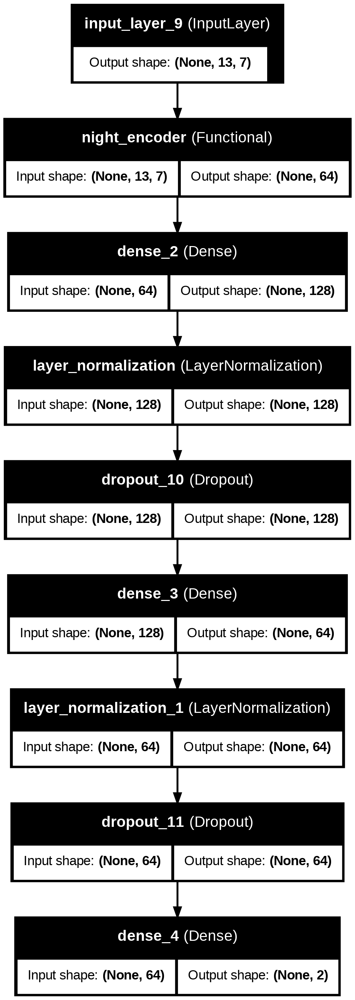

In [ ]:
def classification_1encoder(input_shape, encoder,
                            freeze_encoders = False,
                            mlp_units = [128, 64],
                            mlp_dropout_rate=0.5, regularizers_l2=0.001):
    """
    Builds a classification model using a pre-trained encoder followed by fully connected layers.

    Args:
        input_shape (tuple): Shape of the input data (excluding batch size).
        encoder (Model): Pre-trained encoder model to extract features.
        mlp_units (list): List of integers defining the units in the MLP layers.
        mlp_dropout_rate (float): Dropout rate for the MLP layers.
        regularizers_l2 (float): L2 regularization factor for the Dense layers.

    Returns:
        Model: A Keras Model instance for classification.
    """
    # Create input layers for each encoder
    raw_inputs = layers.Input(shape=input_shape)
    # delta_inputs = layers.Input(shape=input_shape_li[1])
    # inputs = [raw_inputs, delta_inputs]

    # Init Encoders
    # Init Encoders
    if freeze_encoders:
        encoder.trainable = False
    x = encoder(raw_inputs)

    # Fully connected output layer
    for units in mlp_units:
        x = layers.Dense(units, activation="relu", kernel_regularizer=l2(regularizers_l2))(x)
        x = layers.LayerNormalization()(x)
        x = layers.Dropout(mlp_dropout_rate)(x)
    outputs = layers.Dense(2, activation="softmax")(x)

    model = models.Model(raw_inputs, outputs, name='classifier')
    return model

input_shape = (13, 7)
# encoders, _ = load_models(os.path.join(MODEL_FOLDER, f'smallMAE_Fold{fold}'), load_autoencoder=False)
encoders, autoencoder = multimodal_AutoEncoder([input_shape, input_shape])
classification_model = classification_1encoder(input_shape, encoders[0])
print(classification_model.summary())
keras.utils.plot_model(classification_model, show_shapes=True, show_layer_names=True)

## Custom Fit and Loss Functions

In [ ]:
# def masked_mae(y_true, y_pred, mask, alpha=1.0):
#     """
#     Weighted MAE for Masked-AE.
#     alpha = mask_weight_para in [0, 1]:
#         1.0 → loss from masked positions only
#         0.5 → half masked, half visible
#         0.0 → all positions equally
#     """
#     # element-wise L1 error
#     err = tf.abs(y_true - y_pred)

#     # visible = 1, masked = 0  ▸ convert to float32
#     mask = tf.cast(mask, tf.float32)

#     # build weights: w = (1-alpha)·visible + alpha·masked
#     weights = (1.0 - alpha) * mask + alpha * (1.0 - mask)

#     # masked mean
#     loss = tf.reduce_sum(err * weights) / tf.reduce_sum(weights)
#     return loss


In [ ]:
# class MaskedReconstructionFit(tf.keras.Model):
#     def __init__(self, model, alpha=1.0):
#         super(MaskedReconstructionFit, self).__init__()
#         self.model = model
#         self.alpha = alpha         # mask_weight_para
#         # self.loss_fn = weight_mae
#         # self.test_loss_fn = tf.keras.losses.MeanAbsoluteError()
#         self.metric = tf.keras.metrics.MeanAbsoluteError()

#     def compile(self, optimizer, metrics=None, **kwargs):
#         super().compile(optimizer=optimizer, metrics=metrics, **kwargs)

#     def train_step(self, data):
#         (x, x_delta), mask = data  # data should be in the form (x, delta, mask)
#         mask = tf.cast(mask, tf.float32)
#         masked_x = x * mask  # Apply the mask to the input
#         # masked_x_delta = x_delta * mask
#         # tf.print("Masked input (masked_x):", masked_x, summarize=-1)  # summarize=-1 prints the full tensor

#         with tf.GradientTape() as tape:
#             x_hat = self.model([masked_x, x_delta], training=True)
#             loss  = masked_mae(x, x_hat, mask, self.alpha)

#         # Compute gradients and update weights
#         gradients = tape.gradient(loss, self.model.trainable_variables)
#         self.optimizer.apply_gradients(zip(gradients, self.model.trainable_variables))

#         # Update the reconstruction loss metric
#         self.metric.update_state(x, x_hat)
#         # Return the reconstruction loss as the only metric
#         return {"loss": loss, "global_MAE": self.metric.result()}



#     def test_step(self, data):
#         (x, x_delta), mask = data  # data should be in the form (x, delta, mask)
#         mask = tf.cast(mask, tf.float32)
#         x_visible = x * mask              # zero-out masked positions

#         x_hat = self.model([x_visible, x_delta], training=False)
#         loss  = masked_mae(x, x_hat, mask, self.alpha)

#         # Update the reconstruction loss metric
#         self.metric.update_state(x, x_hat)
#         # ---- build log dict (TOP-LEVEL keys!) ----
#         return {"loss": loss, "global_MAE":self.metric.result()}


## Evaluation and Learning Curve Plotting Function

In [ ]:
def plot_learning_curves(training_history, log_history=None, name='', metric_name_li=[], init_index=0):
    """
    Plots the learning curves for training and validation loss/accuracy.

    Parameters:
    - training_history: The history object returned from model.fit.

    Returns:
    - None (Displays the plots).
    """
    if log_history is not None:
        history_data = log_history
    else:
        history_data = training_history.history

    # Loop through each metric in the history
    if len(metric_name_li) == 0:
      for metric_name in history_data.keys():
          if 'val' not in metric_name:
              metric_name_li.append(metric_name)

    for metric_name in metric_name_li:
            epochs = range(init_index+1, len(history_data[metric_name]) + 1)
            # print(len(epochs), len(history_data[metric_name][init_index:]))

            # Create a new figure for each metric
            metric_fig = plt.figure(figsize=(4, 3))
            plt.plot(epochs, history_data[metric_name][init_index:], label=f'Training {metric_name}')
            plt.plot(epochs, history_data[f'val_{metric_name}'][init_index:], label=f'Validation {metric_name}')

            # Formatting the plot
            plt.title(f'{metric_name.capitalize()}-{name}')
            plt.xlabel('Epochs')
            plt.ylabel(metric_name.capitalize())
            plt.legend()
            plt.grid(True)

            # Display the plot
            # metric_fig.tight_layout()
            metric_fig.show()
    return

# plot_learning_curves(history, init_index=5)

In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, roc_curve, precision_recall_curve, auc
def evaluate_model(y_true, y_pred_probs, metrics):
    """
    Evaluates the model's performance using various metrics and updates the metrics dictionary.

    Parameters:
    - y_true: True labels (numpy array or list).
    - y_pred_probs: Predicted probabilities (numpy array).
    - metrics: Dictionary to update with evaluation metrics.

    Returns:
    - None
    """
    # Convert probabilities to binary predictions
    y_pred = np.argmax(y_pred_probs, axis=1)
    # Keep only probability for positive class
    y_pred_pos = y_pred_probs[:, 1]

    # Compute confusion matrix
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    metrics['tn'].append(tn)
    metrics['fp'].append(fp)
    metrics['fn'].append(fn)
    metrics['tp'].append(tp)

    # Calculate precision and recall
    specificity, sensitivity = recall_score(y_true, y_pred, average=None) #recall for both
    metrics['sensitivity'].append(sensitivity)
    metrics['specificity'].append(specificity)
    precision = precision_score(y_true, y_pred) #only for positive class
    metrics['precision'].append(precision)
    f1 = f1_score(y_true, y_pred)
    metrics['f1_score'].append(f1)

    # PR curve
    precision_li, recall_li, thresholds_pr = precision_recall_curve(y_true, y_pred_pos)
    pr_auc = auc(recall_li, precision_li)
    metrics['PR_auc'].append(pr_auc)

    # ROC
    fpr, tpr, thresholds_roc = roc_curve(y_true, y_pred_pos)
    roc_auc = auc(fpr, tpr)
    metrics['ROC_auc'].append(roc_auc)

    # Store metrics in a DataFrame
    metrics_data = {
        "Metric": [
            "True Negatives", "False Positives", "False Negatives", "True Positives",
            "Sensitivity", "Specificity", "Precision", "F1 Score", "PR AUC", "ROC AUC"
        ],
        "Value": [tn, fp, fn, tp, sensitivity, specificity, precision, f1, pr_auc, roc_auc]
    }
    display(pd.DataFrame(metrics_data))

    return

## Save Model

In [ ]:
from tensorflow.keras.models import save_model

def save_models(encoders, autoencoder, save_dir):
    """
    Saves encoders (list of two models) and autoencoder model to the given directory.

    Parameters:
    - encoders (list): A list containing two Keras models (encoder models).
    - autoencoder (Model): The main autoencoder model.
    - save_dir (str): Directory path where models will be saved.

    Returns:
    - None (saves models to disk).
    """

    # Ensure the directory exists
    os.makedirs(save_dir, exist_ok=True)

    # Save encoder models
    save_model(encoders[0], os.path.join(save_dir, "encoder_1.h5"))
    save_model(encoders[1], os.path.join(save_dir, "encoder_2.h5"))

    # Save autoencoder model
    save_model(autoencoder, os.path.join(save_dir, "autoencoder.h5"))

    print(f"Models saved in: {save_dir}")


from tensorflow.keras.models import load_model
def load_models(load_dir, load_autoencoder=True):
    """
    Loads two encoder models and optionally an autoencoder model from the specified directory.

    Parameters:
    - load_dir (str): Directory path where models are saved.
    - load_autoencoder (bool): Whether to load the autoencoder model (default is True).

    Returns:
    - encoders (list): A list containing two loaded encoder models.
    - autoencoder (Model or None): The loaded autoencoder model if `load_autoencoder=True`, else None.
    """

    # Ensure the directory exists
    if not os.path.exists(load_dir):
        raise FileNotFoundError(f"Directory {load_dir} does not exist. Please check the path.")

    # Load encoder models
    encoder_1 = load_model(os.path.join(load_dir, "encoder_1.h5"))
    encoder_2 = load_model(os.path.join(load_dir, "encoder_2.h5"))

    encoders = [encoder_1, encoder_2]

    # Load autoencoder model if specified
    autoencoder = None
    if load_autoencoder:
        autoencoder = load_model(os.path.join(load_dir, "autoencoder.h5"))
        print(f"Autoencoder loaded successfully from: {load_dir}")

    print(f"Encoders loaded successfully from: {load_dir}")

    return encoders, autoencoder


# Data Preprocess

## Sampling with mask strategy

In [ ]:
from sklearn.utils import shuffle

def geom_noise_mask_single(L, lm, masking_ratio):
    """
    Randomly create a boolean mask of length `L`, consisting of subsequences of average length lm, masking with 0s a `masking_ratio`
    proportion of the sequence L. The length of masking subsequences and intervals follow a geometric distribution.
    Args:
        L: length of mask and sequence to be masked
        lm: average length of masking subsequences (streaks of 0s)
        masking_ratio: proportion of L to be masked
    Returns:
        (L,) boolean numpy array intended to mask ('drop') with 0s a sequence of length L
    """
    # np.random.seed(seed)
    keep_mask = np.ones(L, dtype=bool)
    p_m = 1 / lm  # probability of each masking sequence stopping. parameter of geometric distribution.
    p_u = p_m * masking_ratio / (1 - masking_ratio)  # probability of each unmasked sequence stopping. parameter of geometric distribution.
    p = [p_m, p_u]

    # Start in state 0 with masking_ratio probability
    state = int(np.random.rand() > masking_ratio)  # state 0 means masking, 1 means not masking
    for i in range(L):
        keep_mask[i] = state  # here it happens that state and masking value corresponding to state are identical
        if np.random.rand() < p[state]:
            state = 1 - state

    return keep_mask

def noise_mask(X, masking_ratio, lm=3, mode='separate', distribution='geometric', exclude_feats=None):
    """
    Creates a random boolean mask of the same shape as X, with 0s at places where a feature should be masked.
    Args:
        X: (seq_length, feat_dim) numpy array of features corresponding to a single sample
        masking_ratio: proportion of seq_length to be masked. At each time step, will also be the proportion of
            feat_dim that will be masked on average
        lm: average length of masking subsequences (streaks of 0s). Used only when `distribution` is 'geometric'.
        mode: whether each variable should be masked separately ('separate'), or all variables at a certain positions
            should be masked concurrently ('concurrent')
        distribution: whether each mask sequence element is sampled independently at random, or whether
            sampling follows a markov chain (and thus is stateful), resulting in geometric distributions of
            masked squences of a desired mean length `lm`
        exclude_feats: iterable of indices corresponding to features to be excluded from masking (i.e. to remain all 1s)
    Returns:
        boolean numpy array with the same shape as X, with 0s at places where a feature should be masked
    """
    # np.random.seed(seed)
    if exclude_feats is not None:
        exclude_feats = set(exclude_feats)

    if distribution == 'geometric':  # stateful (Markov chain)
        if mode == 'separate':  # each variable (feature) is independent
            mask = np.ones(X.shape, dtype=bool)
            for m in range(X.shape[1]):  # feature dimension
                if exclude_feats is None or m not in exclude_feats:
                    mask[:, m] = geom_noise_mask_single(X.shape[0], lm, masking_ratio)  # time dimension
        else:  # replicate across feature dimension (mask all variables at the same positions concurrently)
            mask = np.tile(np.expand_dims(geom_noise_mask_single(X.shape[0], lm, masking_ratio), 1), X.shape[1])
    else:  # each position is independent Bernoulli with p = 1 - masking_ratio
        if mode == 'separate':
            mask = np.random.choice(np.array([True, False]), size=X.shape, replace=True,
                                    p=(1 - masking_ratio, masking_ratio))
        else:
            mask = np.tile(np.random.choice(np.array([True, False]), size=(X.shape[0], 1), replace=True,
                                            p=(1 - masking_ratio, masking_ratio)), X.shape[1])

    return mask

def Gen_Mask(X, r=0.15, lm=2):
  '''
  Gen mask Matrix for a given training sample
  '''
  M = noise_mask(X, r, lm, mode='separate', distribution='geometric', exclude_feats=None)
  M = np.where(M, 1, 0)
  return M

def Gen_Masked_data(X, M):
  '''
  Gen mask input Matrix as target for lossfunction for training process
  '''
  Y = np.multiply(X, np.subtract(1, M))
  return Y

def Gen_Unmask_Data(X, M):
  '''
  Gen un-mask Matrix for training process
  '''
  X = np.multiply(X,M)
  return X

## Normalization

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np

def normalize_features_array(train_X: np.ndarray,
                             val_X:   np.ndarray,
                             test_X:  np.ndarray,
                             eps: float = 0.05):
    """
    Min–max-scales each feature to the interval [eps, 1].

    Parameters
    ----------
    train_X, val_X, test_X : np.ndarray
        Arrays with shape (N, T, F).
    eps : float, optional
        Lower bound of the scaled range (default 0.05).

    Returns
    -------
    tuple[np.ndarray, np.ndarray, np.ndarray]
        Normalised (train, val, test) arrays.
    """
    # reshape to 2-D (samples × features)
    N, T, F = train_X.shape
    train_flat = train_X.reshape(-1, F)

    # fit scaler on *training* data only
    scaler = MinMaxScaler(feature_range=(eps, 1.0))
    train_flat_norm = scaler.fit_transform(train_flat)

    # apply the same scaler to val
    val_flat_norm  = scaler.transform(val_X.reshape(-1, F))

    # reshape back to (N, T, F)
    train_norm = train_flat_norm.reshape(N, T, F)
    val_norm   = val_flat_norm.reshape(val_X.shape[0], T, F)

    if test_X is not None:
      test_flat_norm = scaler.transform(test_X.reshape(-1, F))
      test_norm  = test_flat_norm.reshape(test_X.shape[0], T, F)
    else:
      test_norm = None

    return train_norm, val_norm, test_norm


def denormalize_with_trained_scaler(
    X_norm:    np.ndarray,  # (N, T, F) — data in [eps, 1]
    train_X:   np.ndarray,  # (N_train, T, F) — raw training set
    eps: float = 0.05
) -> np.ndarray:
    """
    1. Reshape raw training data to (samples, features).
    2. Fit MinMaxScaler(feature_range=(eps, 1.0)) on it.
    3. Apply inverse_transform to X_norm and reshape back.

    Returns
    -------
    X_raw  : de-normalised array, same shape as X_norm.
    scaler : the fitted MinMaxScaler (handy for later use).
    """
    # reshape training data
    N_train, T, F = train_X.shape
    train_flat = train_X.reshape(-1, F)

    # fit scaler
    scaler = MinMaxScaler(feature_range=(eps, 1.0))
    scaler.fit(train_flat)

    # inverse-transform the normalised array
    X_raw = scaler.inverse_transform(X_norm.reshape(-1, F)).reshape(X_norm.shape)
    return X_raw

# Preprocess 2 Night data

In [ ]:
def generate_2night_data(df):
    df = df.reset_index()
    # Extract previous day data
    previous_day_df = df.shift(1).iloc[1:]
    previous_day_df['Night'] = previous_day_df['Night'].astype(int)

    df = df.iloc[1:]
    df['PreviousNight'] = previous_day_df['Night']

    # Generate 2 night
    TwoNight_df = pd.DataFrame()
    TwoNight_df['subject_id'] = df.subject_id
    TwoNight_df['hadm_id'] = df.hadm_id
    TwoNight_df['Night'] = df.apply(lambda row: f"{row.PreviousNight}--{row.Night}", axis=1)
    TwoNight_df['PreviousNight'] = previous_day_df['Temporal Features']
    TwoNight_df['CurrentNight'] = df['Temporal Features']
    TwoNight_df['Delta'] = TwoNight_df.apply(
        lambda row: row.CurrentNight - row.PreviousNight
        if isinstance(row["PreviousNight"], np.ndarray) else np.nan
        , axis=1
        )
    if 'Label' in df.columns:
        TwoNight_df['Label'] = df.Label
        TwoNight_df['Fold'] = df.Fold

    TwoNight_df = TwoNight_df.dropna()

    # TwoNight_df['InputFeatures'] = TwoNight_df.apply(
    #     lambda row: np.concatenate((row["CurrentNight"], row['Delta']), axis=1)
    #     if isinstance(row["Delta"], np.ndarray) else np.nan
    #     , axis=1
    # )
    # TwoNight_df['InputFeatures'] = TwoNight_df['CurrentNight']

    # # Drop duplicate data
    # TwoNight_df.drop(['PreviousNight', #'CurrentNight', #'Delta'
    #                   ], axis=1, inplace=True)

    return TwoNight_df

In [ ]:
from imblearn.over_sampling import RandomOverSampler

def random_oversample_dual_input(
    X1: np.ndarray,
    X2: np.ndarray,
    y:  np.ndarray,
    random_state: int | None = 42,
) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Randomly oversample a dual-input (multi-modal) dataset so each class reaches
    the size of the majority class.

    Parameters
    ----------
    X1, X2 : np.ndarray
        Two input tensors with identical first-dimension length, shapes
        (N, T, F). They are flattened & concatenated internally.
    y : np.ndarray
        Label vector of shape (N,).
    random_state : int | None, optional
        Seed for reproducibility (default 42).

    Returns
    -------
    X1_os, X2_os, y_os : np.ndarray
        Oversampled copies of the two inputs and labels, shapes
        (N_new, T, F) and (N_new,).
    """
    # --- Sanity check ------------------------------------------------------
    assert X1.shape == X2.shape, "X1 and X2 must share (N, T, F) shape"
    N, T, F = X1.shape

    # --- 1. Flatten & concatenate ------------------------------------------
    X_concat = np.hstack([X1.reshape(N, -1), X2.reshape(N, -1)])  # (N, 2·T·F)

    # --- 2. Random oversampling -------------------------------------------
    ros = RandomOverSampler(random_state=random_state)
    X_res, y_res = ros.fit_resample(X_concat, y)

    # --- 3. Split & reshape back ------------------------------------------
    split = T * F
    X1_os = X_res[:, :split].reshape(-1, T, F)
    X2_os = X_res[:, split:].reshape(-1, T, F)
    return X1_os, X2_os, y_res

## training

In [ ]:
dataset_df = truma_cohort_df[['subject_id', 'hadm_id', 'Night', 'Temporal Features','Label', 'Fold']].sort_values(['hadm_id', 'Night'])
dataset_df['Night']= dataset_df.Night.astype(int)
NightAndDelta_dataset = dataset_df.groupby('hadm_id').apply(generate_2night_data)#.reset_index(drop=True)

# Drop non Continuous Day
isContinuousDay = NightAndDelta_dataset["Night"].apply(
    lambda x: (lambda a, b: b - a == 1)(*map(int, x.split('--')))
)

NightAndDelta_dataset_Continuous = NightAndDelta_dataset[isContinuousDay]

NightAndDelta_dataset_Continuous.head()

/tmp/ipython-input-547857484.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  NightAndDelta_dataset = dataset_df.groupby('hadm_id').apply(generate_2night_data)#.reset_index(drop=True)


subject_id  hadm_id Night  \
hadm_id                                
100011  1       87977   100011  2--3   
        2       87977   100011  3--4   
        3       87977   100011  4--5   
        4       87977   100011  5--6   
100035  1       48539   100035  4--5   

                                               PreviousNight  \
hadm_id                                                        
100011  1  [[88.0, 167.0, 82.0, 105.0, 16.0, 37.666666666...   
        2  [[109.33333333333333, 158.33333333333334, 82.6...   
        3  [[97.0, 143.0, 65.0, 87.0, 23.0, 38.3333333333...   
        4  [[81.0, 153.0, 79.0, 100.0, 21.0, 37.888888888...   
100035  1  [[84.0, 112.0, 58.0, 73.0, 22.0, 37.6, 98.0], ...   

                                                CurrentNight  \
hadm_id                                                        
100011  1  [[109.33333333333333, 158.33333333333334, 82.6...   
        2  [[97.0, 143.0, 65.0, 87.0, 23.0, 38.3333333333...   
        3  [[81.0, 153.0, 79.0, 100.0, 21.0, 37.888888888...   
        4  [[95.0, 128.0, 59.0, 75.0, 45.0, 38.1666666666...   
100035  1  [[92.0, 141.0, 80.0, 97.0, 14.0, 38.2, 96.0], ...   

                                                       Delta  Label  Fold  
hadm_id                                                                    
100011  1  [[21.33333333333333, -8.666666666666657, 0.666...      0     4  
        2  [[-12.333333333333329, -15.333333333333343, -1...      0     4  
        3  [[-16.0, 10.0, 14.0, 13.0, -2.0, -0.4444444444...      0     4  
        4  [[14.0, -25.0, -20.0, -25.0, 24.0, 0.277777777...      1     4  
100035  1  [[8.0, 29.0, 22.0, 24.0, -8.0, 0.6000000000000...      1     2

In [ ]:
# 1.  Ensure the second level never exceeds 999  (you said it is 0 – 295)
assert NightAndDelta_dataset_Continuous.index.get_level_values(1).max() < 1_000

# 2.  Collapse the two levels:
NightAndDelta_dataset_Continuous.index = (
    NightAndDelta_dataset_Continuous.index.get_level_values(0) * 1_000   # reserve three digits
    + NightAndDelta_dataset_Continuous.index.get_level_values(1)
).astype("int64")          # → Int64Index like 100001001

# 3.  (optional) give the new single‐level index a name
NightAndDelta_dataset_Continuous.index.name = "instence_id"
NightAndDelta_dataset_Continuous

,subject_id,hadm_id,Night,PreviousNight,CurrentNight,Delta,Label,Fold
instence_id,,,,,,,,
100011001,87977,100011,2--3,"[[88.0, 167.0, 82.0, 105.0, 16.0, 37.666666666...","[[109.33333333333333, 158.33333333333334, 82.6...","[[21.33333333333333, -8.666666666666657, 0.666...",0,4
100011002,87977,100011,3--4,"[[109.33333333333333, 158.33333333333334, 82.6...","[[97.0, 143.0, 65.0, 87.0, 23.0, 38.3333333333...","[[-12.333333333333329, -15.333333333333343, -1...",0,4
100011003,87977,100011,4--5,"[[97.0, 143.0, 65.0, 87.0, 23.0, 38.3333333333...","[[81.0, 153.0, 79.0, 100.0, 21.0, 37.888888888...","[[-16.0, 10.0, 14.0, 13.0, -2.0, -0.4444444444...",0,4
100011004,87977,100011,5--6,"[[81.0, 153.0, 79.0, 100.0, 21.0, 37.888888888...","[[95.0, 128.0, 59.0, 75.0, 45.0, 38.1666666666...","[[14.0, -25.0, -20.0, -25.0, 24.0, 0.277777777...",1,4
100035001,48539,100035,4--5,"[[84.0, 112.0, 58.0, 73.0, 22.0, 37.6, 98.0], ...","[[92.0, 141.0, 80.0, 97.0, 14.0, 38.2, 96.0], ...","[[8.0, 29.0, 22.0, 24.0, -8.0, 0.6000000000000...",1,2
...,...,...,...,...,...,...,...,...
199976008,26198,199976,9--10,"[[83.5, 168.75, 60.25, 95.5, 16.5, 38.66666581...","[[82.0, 204.5, 64.0, 111.1666488647461, 24.0, ...","[[-1.5, 35.75, 3.75, 15.666648864746094, 7.5, ...",0,0
199976009,26198,199976,10--11,"[[82.0, 204.5, 64.0, 111.1666488647461, 24.0, ...","[[89.0, 156.0, 55.5, 87.0, 18.0, 37.3888905843...","[[7.0, -48.5, -8.5, -24.166648864746094, -6.0,...",0,0
199976010,26198,199976,11--12,"[[89.0, 156.0, 55.5, 87.0, 18.0, 37.3888905843...","[[73.0, 155.5, 55.0, 84.6666488647461, 19.0, 3...","[[-16.0, -0.5, -0.5, -2.3333511352539062, 1.0,...",0,0


## Sample

In [ ]:
df_100011 = dataset_df[dataset_df['hadm_id']==100011]
display(df_100011)
NightAndDelta_dataset_Continuous[NightAndDelta_dataset_Continuous['hadm_id'] == 100011]

,subject_id,hadm_id,Night,Temporal Features,Label,Fold
6821,87977,100011,2,"[[88.0, 167.0, 82.0, 105.0, 16.0, 37.666666666...",0,4
6822,87977,100011,3,"[[109.33333333333333, 158.33333333333334, 82.6...",0,4
6823,87977,100011,4,"[[97.0, 143.0, 65.0, 87.0, 23.0, 38.3333333333...",0,4
6824,87977,100011,5,"[[81.0, 153.0, 79.0, 100.0, 21.0, 37.888888888...",0,4
6825,87977,100011,6,"[[95.0, 128.0, 59.0, 75.0, 45.0, 38.1666666666...",1,4


,subject_id,hadm_id,Night,PreviousNight,CurrentNight,Delta,Label,Fold
instence_id,,,,,,,,
100011001,87977,100011,2--3,"[[88.0, 167.0, 82.0, 105.0, 16.0, 37.666666666...","[[109.33333333333333, 158.33333333333334, 82.6...","[[21.33333333333333, -8.666666666666657, 0.666...",0,4
100011002,87977,100011,3--4,"[[109.33333333333333, 158.33333333333334, 82.6...","[[97.0, 143.0, 65.0, 87.0, 23.0, 38.3333333333...","[[-12.333333333333329, -15.333333333333343, -1...",0,4
100011003,87977,100011,4--5,"[[97.0, 143.0, 65.0, 87.0, 23.0, 38.3333333333...","[[81.0, 153.0, 79.0, 100.0, 21.0, 37.888888888...","[[-16.0, 10.0, 14.0, 13.0, -2.0, -0.4444444444...",0,4
100011004,87977,100011,5--6,"[[81.0, 153.0, 79.0, 100.0, 21.0, 37.888888888...","[[95.0, 128.0, 59.0, 75.0, 45.0, 38.1666666666...","[[14.0, -25.0, -20.0, -25.0, 24.0, 0.277777777...",1,4


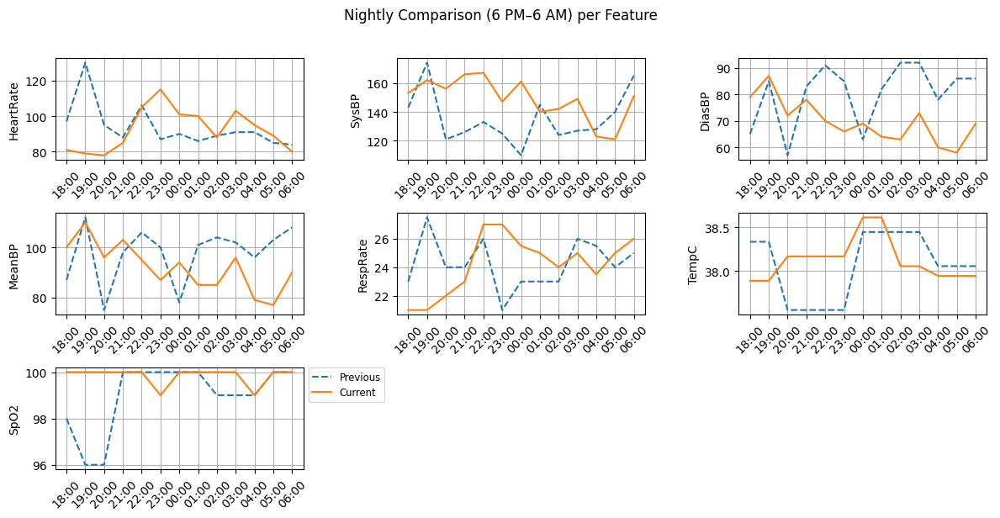

In [ ]:
import math
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def plot_two_nights_features_subplots(
    sample_prev: np.ndarray,
    sample_curr: np.ndarray,
    feature_names: list[str],
    start_hour: int = 18,
    ncols: int = 2,
    title_prefix: str = "Nighttime Features"
) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    在每个子图中对比前一夜和当夜同一特征的时序：
    - sample_prev、sample_curr：形状均为 (T, F) 的数组
    - feature_names：长度为 F 的特征名列表
    - start_hour：开始小时（如 18 表示 18:00）
    - ncols：子图每行列数
    - title_prefix：整体标题前缀

    返回两个 DataFrame (df_prev, df_curr)，方便后续检查。
    """
    # 校验输入
    T, F = sample_curr.shape
    assert sample_prev.shape == sample_curr.shape, "两个样本的形状必须相同 (T, F)"

    # 构造时间标签
    hour_labels = [f"{(start_hour + i) % 24:02d}:00" for i in range(T)]

    # 构造 DataFrame
    df_prev = pd.DataFrame(sample_prev, columns=feature_names, index=hour_labels)
    df_curr = pd.DataFrame(sample_curr, columns=feature_names, index=hour_labels)

    # 子图布局
    nrows = math.ceil(F / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(12, 2 * nrows), sharex=False)
    axes_flat = axes.flatten()

    for idx, feature in enumerate(feature_names):
        ax = axes_flat[idx]
        # 绘制前一夜（虚线）和当夜（实线）
        ax.plot(range(T), df_prev[feature], label="Previous", linestyle="--")
        ax.plot(range(T), df_curr[feature], label="Current",   linestyle="-")
        ax.set_ylabel(feature)
        ax.set_xticks(range(T))
        ax.set_xticklabels(hour_labels, rotation=45)
        ax.grid(True)

    ax.legend(
        ["Previous", "Current"],
        loc="upper left",
        fontsize="small",
        # bbox_to_anchor 的第一个参数 >1 表示在轴外右侧
        bbox_to_anchor=(1.02, 1),
        borderaxespad=0
    )

    for ax in axes_flat[F:]:
        ax.axis('off')

    fig.suptitle(f"{title_prefix} per Feature", y=1.02)
    plt.tight_layout()
    plt.show()

    return df_prev, df_curr

# usage sample
idx = 2
sample_prev = NightAndDelta_dataset_Continuous.iloc[idx]['PreviousNight']
sample_curr = NightAndDelta_dataset_Continuous.iloc[idx]['CurrentNight']
df_prev, df_curr = plot_two_nights_features_subplots(
    sample_prev, sample_curr, feature_names,
    start_hour=18, ncols=3,
    title_prefix="Nightly Comparison (6 PM–6 AM)"
)



# STAGE2: Transfer Learning

*  Transfer Learning Training model (freeze encoders), only trian on classification head



In [ ]:
model_name = 'GRUMAE_nontruma_Jul28_1500'

# Load pretrained encoders
pretrian_encoders, pretrain_autoencoder = load_models(os.path.join(MODEL_FOLDER, model_name), load_autoencoder=True)
# Save a snapshot of the initial weights
raw_init_w   = pretrian_encoders[0].get_weights()
delta_init_w = pretrian_encoders[1].get_weights()

Autoencoder loaded successfully from: /content/drive/MyDrive/Colab Notebooks/All_ICU_notebook/Model/GRUMAE_nontruma_Jul28_1500
Encoders loaded successfully from: /content/drive/MyDrive/Colab Notebooks/All_ICU_notebook/Model/GRUMAE_nontruma_Jul28_1500


In [ ]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np

def fit_minmax_scaler(train_X: np.ndarray, eps: float = 0.05) -> MinMaxScaler:
    """
    Fit a MinMaxScaler to training data only.

    Parameters
    ----------
    train_X : np.ndarray
        Training data of shape (N, T, F).
    eps : float
        Lower bound of the scaled range. Default is 0.05.

    Returns
    -------
    scaler : MinMaxScaler
        Fitted scaler object.
    """
    _, _, F = train_X.shape
    train_flat = train_X.reshape(-1, F)
    scaler = MinMaxScaler(feature_range=(eps, 1.0))
    scaler.fit(train_flat)
    return scaler

def normalize_with_scaler(X: np.ndarray, scaler: MinMaxScaler) -> np.ndarray:
    """
    Normalize input data using a fitted MinMaxScaler.

    Supports both (N, T, F) and (T, F) shaped arrays.

    Parameters
    ----------
    X : np.ndarray
        Input array with shape (N, T, F) or (T, F).
    scaler : MinMaxScaler
        Previously fitted scaler.

    Returns
    -------
    X_norm : np.ndarray
        Normalized array with same shape as input.
    """
    original_shape = X.shape
    if X.ndim == 3:
        N, T, F = X.shape
        flat = X.reshape(-1, F)
        flat_norm = scaler.transform(flat)
        return flat_norm.reshape(N, T, F)
    elif X.ndim == 2:
        T, F = X.shape
        flat_norm = scaler.transform(X)
        return flat_norm.reshape(T, F)
    else:
        raise ValueError("Input must have shape (N, T, F) or (T, F).")


def denormalize_with_scaler(X_norm: np.ndarray, scaler: MinMaxScaler) -> np.ndarray:
    """
    Inverse-transform normalized data using a fitted MinMaxScaler.

    Supports both (N, T, F) and (T, F) shaped arrays.

    Parameters
    ----------
    X_norm : np.ndarray
        Normalized array of shape (N, T, F) or (T, F).
    scaler : MinMaxScaler
        Previously fitted scaler.

    Returns
    -------
    X_raw : np.ndarray
        De-normalized array of same shape as input.
    """
    original_shape = X_norm.shape
    if X_norm.ndim == 3:
        N, T, F = X_norm.shape
        flat_norm = X_norm.reshape(-1, F)
        flat_raw = scaler.inverse_transform(flat_norm)
        return flat_raw.reshape(N, T, F)
    elif X_norm.ndim == 2:
        T, F = X_norm.shape
        flat_raw = scaler.inverse_transform(X_norm)
        return flat_raw.reshape(T, F)
    else:
        raise ValueError("Input must have shape (N, T, F) or (T, F).")


In [ ]:
import pandas as pd
from sklearn.utils import resample

def oversample_binary_df(df: pd.DataFrame, target_column: str, random_state: int = 66) -> pd.DataFrame:
    """
    Perform oversampling on the minority class to balance a binary classification dataset.

    Parameters
    ----------
    df : pd.DataFrame
        Input dataframe.
    target_column : str
        Name of the binary label column.
    random_state : int
        Random seed for reproducibility.

    Returns
    -------
    pd.DataFrame
        Balanced dataframe with equal number of samples from each class.
    """
    # Split majority and minority
    df_majority = df[df[target_column] == 0]
    df_minority = df[df[target_column] == 1]

    # Resample
    df_minority_oversampled = resample(
        df_minority,
        replace=True,
        n_samples=len(df_majority),
        random_state=random_state
    )

    # Combine and shuffle
    df_balanced = pd.concat([df_majority, df_minority_oversampled])
    df_balanced = df_balanced.sample(frac=1, random_state=random_state).reset_index(drop=True)

    return df_balanced


In [ ]:
import tensorflow as tf
from keras.callbacks import EarlyStopping
from keras import optimizers

def run_fold_training(
    df,
    metrics,
    encoders,
    pretrain_autoencoder,
    raw_init_w,
    dropout,
    reg_l2,
    epochs=300,
    mask_rate=0.3,
    patience_es=50,
    init_lr=5e-4,
    weight_decay=1e-2,
    batch_size=64,
):
    """
    Train and evaluate classification model on a specific fold.

    Parameters
    ----------
    pretrain_autoencoder : keras.Model
        Pretrained autoencoder model used for augmentation.
    raw_init_w : list
        Initial weights for the encoder.
    dropout : float
        Dropout rate in classifier MLP head.
    reg_l2 : float
        L2 regularization strength.
    init_lr : float
        Initial learning rate for AdamW.
    weight_decay : float
        Weight decay for AdamW.
    epochs : int
        Maximum number of epochs.
    patience_es : int
        Early stopping patience.
    mask_rate : float
        Probability of masking elements in input sequence.
    batch_size : int
        Batch size for training.

    Returns
    -------
    history : keras.callbacks.History
        Training history.
    metrics : dict
        Dictionary of evaluation metrics.
    """
    # Clear previous TF graph
    tf.keras.backend.clear_session()

    # ── Stage 0: Data Preprocess ──────────────────────────────
    train_df = df[df["Fold"] != fold].copy()
    val_df   = df[df["Fold"] == fold].copy()

    # Normalize
    scaler = fit_minmax_scaler(np.stack(train_df["CurrentNight"].to_numpy()))
    train_df.loc[:, 'Nor_X'] = train_df['CurrentNight'].apply(lambda x: normalize_with_scaler(x, scaler))
    val_df.loc[:, 'Nor_X'] = val_df['CurrentNight'].apply(lambda x: normalize_with_scaler(x, scaler))
    delta_scaler = fit_minmax_scaler(np.stack(train_df['Delta'].to_numpy()))
    train_df.loc[:, 'Nor_delta'] = train_df['Delta'].apply(lambda x: normalize_with_scaler(x, delta_scaler))
    val_df.loc[:, 'Nor_delta'] = val_df['Delta'].apply(lambda x: normalize_with_scaler(x, delta_scaler))

    X_test_nor, X_delta_test_nor = np.stack(val_df["Nor_X"].to_numpy()), np.stack(val_df['Nor_delta'])
    y_test  = val_df["Label"].to_numpy(dtype=np.int32)

    # Oversample
    train_balanced_df = oversample_binary_df(train_df, target_column='Label', random_state=42)
    val_balanced_df   = oversample_binary_df(val_df, target_column='Label', random_state=42)

    # Mask
    train_balanced_df.loc[:, 'Mask'] = train_balanced_df['CurrentNight'].apply(Gen_Mask, r=mask_rate)
    val_balanced_df.loc[:, 'Mask'] = val_balanced_df['CurrentNight'].apply(Gen_Mask, r=mask_rate)

    # Extract X
    X_train_nor_os, X_train_delta_nor_os = np.stack(train_balanced_df["Nor_X"].to_numpy()), np.stack(train_balanced_df['Nor_delta'])
    X_val_nor_os,   X_val_delta_nor_os   = np.stack(val_balanced_df["Nor_X"].to_numpy()), np.stack(val_balanced_df['Nor_delta'])
    X_mask_os = np.stack(train_balanced_df["Mask"].to_numpy())
    X_val_mask_os = np.stack(val_balanced_df["Mask"].to_numpy())

    # Mask Augmentation
    X_train_aug_os = pretrain_autoencoder.predict([X_train_nor_os*X_mask_os, X_train_delta_nor_os])
    X_val_aug_os   = pretrain_autoencoder.predict([X_val_nor_os*X_val_mask_os, X_val_delta_nor_os])

    # Labels
    Y_train_os = to_categorical(train_balanced_df["Label"].to_numpy(dtype=np.int32), num_classes=2)
    Y_val_os   = to_categorical(val_balanced_df["Label"].to_numpy(dtype=np.int32), num_classes=2)

    # ── Stage 1: Training ─────────────────────────────────────
    input_shape_li = X_train_nor_os.shape[1:]
    raw_enc   = tf.keras.models.clone_model(encoders[0])
    raw_enc.set_weights(raw_init_w)

    classification_model = classification_1encoder(
        input_shape_li,
        raw_enc,
        freeze_encoders=True,
        mlp_dropout_rate=dropout,
        regularizers_l2=reg_l2
    )
    # print(classification_model.summary())

    # Compile
    opt = optimizers.AdamW(learning_rate=init_lr, weight_decay=weight_decay)
    classification_model.compile(
        optimizer=opt,
        loss='categorical_crossentropy',
        metrics=[
            tf.keras.metrics.AUC(curve='ROC', multi_label=True, label_weights=[0,1], name='roc_auc'),
            tf.keras.metrics.Recall(class_id=1, name="sensitivity"),
            tf.keras.metrics.Recall(class_id=0, name="specificity"),
        ]
    )

    # Early stopping
    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=patience_es,
        verbose=1,
        restore_best_weights=True,
        min_delta=1e-5
    )

    history = classification_model.fit(
        X_train_aug_os, Y_train_os,
        validation_data=(X_val_nor_os, Y_val_os),
        epochs=epochs,
        batch_size=batch_size,
        shuffle=True,
        verbose=2,
        callbacks=[early_stopping]
    )

    # ── Stage 2: Evaluation ───────────────────────────────────
    plot_learning_curves(history, name=f'Fold{fold}', metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'])

    # X_test_aug = pretrain_autoencoder.predict([X_test_nor, X_delta_test_nor])
    y_val_pred_probs = classification_model.predict(X_test_nor)
    y_val_true = y_test

    evaluate_model(y_val_true, y_val_pred_probs, metrics)

    return history, metrics


In [ ]:
# from imblearn.over_sampling import RandomOverSampler
# from keras.callbacks import EarlyStopping
# from keras import optimizers
# # import tensorflow_addons as tfa
# # from keras.optimizers import AdamW

# cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
# df = NightAndDelta_dataset_Continuous[cols_needed].copy()

# metric_names = [
#     "tn", "fp", "fn", "tp",
#     "sensitivity", "specificity",
#     "precision", "f1_score",
#     "PR_auc", "ROC_auc"
# ]
# metrics = {name: [] for name in metric_names}
# history_record = {}

# for fold in sorted(df["Fold"].unique()):
#     print(f"\n=== Fold {fold} ===")
#     # Clear the previous TF graph to avoid memory leaks
#     tf.keras.backend.clear_session()
#     # ── Stage 0: Data Preprocess ─────────────────────────────────────────────────────
#     #   split by the pre-assigned Fold column
#     train_df = df[df["Fold"] != fold].copy()
#     val_df   = df[df["Fold"] == fold].copy()

#     #   Normalize
#     scaler = fit_minmax_scaler(np.stack(train_df["CurrentNight"].to_numpy()))
#     train_df.loc[:, 'Nor_X'] = train_df['CurrentNight'].apply(lambda x: normalize_with_scaler(x, scaler))
#     val_df.loc[:, 'Nor_X'] = val_df['CurrentNight'].apply(lambda x: normalize_with_scaler(x, scaler))
#     delta_scaler = fit_minmax_scaler(np.stack(train_df['Delta'].to_numpy()))
#     train_df.loc[:, 'Nor_delta'] = train_df['Delta'].apply(lambda x: normalize_with_scaler(x, delta_scaler))
#     val_df.loc[:, 'Nor_delta'] = val_df['Delta'].apply(lambda x: normalize_with_scaler(x, delta_scaler))
#     #   testset (without mask and oversampling)
#     X_test_nor, X_delta_test_nor = np.stack(val_df["Nor_X"].to_numpy()), np.stack(val_df['Nor_delta'])    # (N, T, F)
#     y_test  = val_df["Label"].to_numpy(dtype=np.int32)

#     #  Oversampling: apply minority class oversampling to training and validation folds separately
#     #  for learning curve analysis
#     train_balanced_df = oversample_binary_df(train_df, target_column='Label', random_state=42)
#     val_balanced_df = oversample_binary_df(val_df, target_column='Label', random_state=42)

#     #  generate Mask
#     train_balanced_df.loc[:, 'Mask'] = train_balanced_df['CurrentNight'].apply(Gen_Mask, r=MASK_RATE)
#     # val_balanced_df.loc[:, 'Mask'] = val_balanced_df['CurrentNight'].apply(Gen_Mask, r=MASK_RATE)

#     #   extract X mask
#     X_train_nor_os, X_train_delta_nor_os = np.stack(train_balanced_df["Nor_X"].to_numpy()), np.stack(train_balanced_df['Nor_delta'])  # (N, T, F)
#     X_val_nor_os,   X_val_delta_nor_os   = np.stack(val_balanced_df["Nor_X"].to_numpy()), np.stack(val_balanced_df['Nor_delta'])    # (N, T, F)
#     X_mask_os = np.stack(train_balanced_df["Mask"].to_numpy())
#     # X_val_mask_os = np.stack(val_balanced_df["Mask"].to_numpy())

#     #   Mask Augment
#     X_train_aug_os = pretrian_autoencoder.predict([X_train_nor_os*X_mask_os,
#                                           X_train_delta_nor_os])
#     X_val_aug_os = pretrian_autoencoder.predict([X_val_nor_os, #*X_val_mask_os,
#                                         X_val_delta_nor_os])
#     #   extract y
#     Y_train_os = to_categorical(train_balanced_df["Label"].to_numpy(dtype=np.int32), num_classes=2)
#     Y_val_os   = to_categorical(val_balanced_df["Label"].to_numpy(dtype=np.int32), num_classes=2)


#     # ───────────────── Training ───────────────────────────────────────────────
#     # Init Classifier
#     input_shape_li = X_train_nor_os.shape[1:]
#     # Clone the **model architecture** in memory – fast, no disk I/O
#     raw_enc   = tf.keras.models.clone_model(encoders[0])
#     # delta_enc = tf.keras.models.clone_model(encoders[1])
#     # Restore the saved initial weights.
#     raw_enc.set_weights(raw_init_w)
#     # delta_enc.set_weights(delta_init_w)
#     classification_model = classification_1encoder(input_shape_li,
#                                                    raw_enc,
#                                                    freeze_encoders=True,
#                                                    mlp_dropout_rate=Dropout,
#                                                    regularizers_l2=Reg_L2)
#     print(classification_model.summary())
#     # keras.utils.plot_model(classification_model, show_shapes=True, show_layer_names=True)

#     # Compile classification model with metrics
#     # opt = optimizers.Adam(learning_rate=LEARNING_RATE)
#     opt = optimizers.AdamW(learning_rate=INIT_LR, weight_decay=WEIGHT_DECAY)
#     classification_model.compile(optimizer=opt,
#                                  loss='categorical_crossentropy',
#                                  metrics=[
#                                     #  tf.keras.metrics.AUC(curve='PR', multi_label=True,label_weights=[0,1],name='pr_auc'),
#                                      tf.keras.metrics.AUC(curve='ROC', multi_label=True,label_weights=[0,1],name='roc_auc'),
#                                      tf.keras.metrics.Recall(class_id=1, name="sensitivity"),
#                                      tf.keras.metrics.Recall(class_id=0, name="specificity"),
#                                     #  tfa.metrics.F1Score(num_classes=2,
#                                     #                       average='macro',
#                                     #                       threshold=0.5,
#                                     #                       name='f1'),
#                                      ]
#                                  )
#     # Define the callback
#     early_stopping = EarlyStopping(
#         monitor='val_loss',  # Metric to monitor (e.g., validation loss)
#         patience=PATIENCE_ES,          # Number of epochs to wait before stopping if no improvement
#         verbose=1,           # Prints a message when training stops
#         restore_best_weights=True,  # Restores the weights from the best epoch
#         min_delta=1e-5
#     )
#     # lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
#     #     monitor='val_loss', factor=FACTOR, patience=PATIENCE, verbose=1,
#     #     min_lr=MIN_LR)
#     # Train classification model
#     history = classification_model.fit(X_train_aug_os, # single inputs
#                                        Y_train_os,
#                                        validation_data=(
#                                            X_val_aug_os, Y_val_os
#                                            ),
#                                        epochs=EPOCHS,
#                                        batch_size=BATCH_SIZE,
#                                        shuffle=True,
#                                        verbose=2,
#                                        callbacks=[early_stopping
#                                                   # ,lr_scheduler
#                                                   ]       # Pass the callback here
#                                        )
#     history_record[fold] = history

#     # ───────────────── Stage 2: Evaluation ────────────────────────────────────
#     # Plot learning curves for the reconstruction model
#     plot_learning_curves(history, name=f'Fold{fold}', metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'])
#     # Evaluate classification model
#     X_test_aug = pretrian_autoencoder.predict([X_test_nor, X_delta_test_nor])
#     y_val_pred_probs = classification_model.predict(X_test_nor)
#     y_val_true = y_test #(n,)
#     # Use the evaluation function to update metrics
#     evaluate_model(y_val_true, y_val_pred_probs, metrics)

#     break

## Mask 0.5

In [ ]:
MASK_RATE = 0.5

INIT_LR=5e-4             #	1e-3 ~ 3e-4
WEIGHT_DECAY=1e-2

BATCH_SIZE   = 64

### Dropout 0.0; Reg_L2=1e-2


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step
Epoch 1/300
170/170 - 10s - 61ms/step - loss: 2.1495 - roc_auc: 0.6231 - sensitivity: 0.5990 - specificity: 0.5833 - val_loss: 1.9533 - val_roc_auc: 0.5388 - val_sensitivity: 0.4553 - val_specificity: 0.6303
Epoch 2/300
170/170 - 4s - 22ms/step - loss: 1.5977 - roc_auc: 0.7365 - sensitivity: 0.6736 - specificity: 0.6636 - val_loss: 1.6333 - val_roc_auc: 0.5214 - val_sensitivity: 0.2795 - val_specificity: 0.7136
Epoch 3/300
170/170 - 4s - 22ms/step - loss: 1.2609 - roc_auc: 0.8013 - sensitivity: 0.7464 - specificity: 0.7126 - val_loss: 1.4470 - val_roc_auc: 0.5537 - val_sensitivity: 0.4583 - val_specificity: 0.6288
Epoch 4/300
170/170 - 4s - 22ms/step - loss: 1.0536 - roc_auc: 0.8433 - sensitivity: 0.7808 - specificity: 0.7411 - val_loss: 1.4497 - val_roc_auc: 0.5769 - val_sensitivity: 0.2856 - val_specificity: 0.7939
Epoch 5/300
170/170 - 4s - 23ms/step - loss: 0.9115 - roc_auc: 0.8761 - sensitivity: 0.8159 - specificity: 0.7736

,Metric,Value
0,True Negatives,932.000000
1,False Positives,388.000000
2,False Negatives,53.000000
3,True Positives,29.000000
4,Sensitivity,0.353659
5,Specificity,0.706061
6,Precision,0.069544
7,F1 Score,0.116232
8,PR AUC,0.071202
9,ROC AUC,0.573642


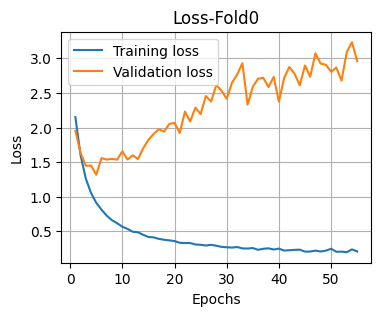

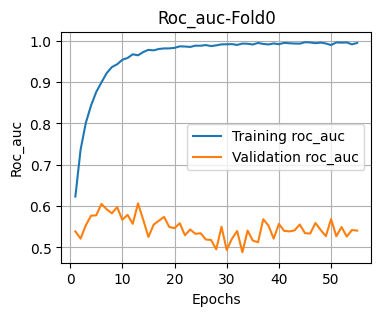

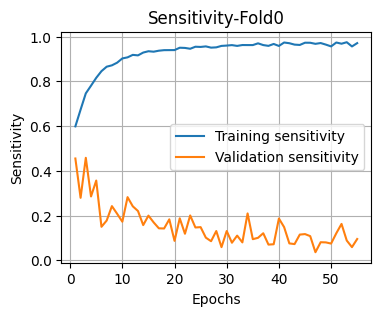

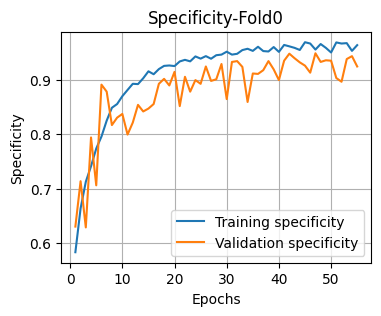

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=0.0,
        reg_l2=1e-2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=300,
        patience_es=50,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.5 Dropout 0 Reg_L2 0.01

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,932,388,53,29,0.353659,0.706061,0.069544,0.116232,0.071202,0.573642



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,932.0,388.0,53.0,29.0,0.353659,0.706061,0.069544,0.116232,0.071202,0.573642
mean,932.0,388.0,53.0,29.0,0.353700,0.706100,0.069500,0.116200,0.071200,0.573600
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.0; Reg_L2=1e-4


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step
Epoch 1/300
170/170 - 9s - 51ms/step - loss: 0.6934 - roc_auc: 0.6423 - sensitivity: 0.6348 - specificity: 0.5775 - val_loss: 0.7744 - val_roc_auc: 0.6237 - val_sensitivity: 0.2318 - val_specificity: 0.8659
Epoch 2/300
170/170 - 3s - 18ms/step - loss: 0.6002 - roc_auc: 0.7573 - sensitivity: 0.7041 - specificity: 0.6714 - val_loss: 0.7595 - val_roc_auc: 0.6185 - val_sensitivity: 0.3235 - val_specificity: 0.7712
Epoch 3/300
170/170 - 3s - 18ms/step - loss: 0.5467 - roc_auc: 0.8124 - sensitivity: 0.7647 - specificity: 0.7069 - val_loss: 0.8276 - val_roc_auc: 0.6158 - val_sensitivity: 0.3144 - val_specificity: 0.8265
Epoch 4/300
170/170 - 3s - 18ms/step - loss: 0.4854 - roc_auc: 0.8621 - sensitivity: 0.8084 - specificity: 0.7594 - val_loss: 0.8626 - val_roc_auc: 0.6224 - val_sensitivity: 0.3227 - val_specificity: 0.7788
Epoch 5/300
170/170 - 3s - 18ms/step - loss: 0.4421 - roc_auc: 0.8883 - sensitivity: 0.8353 - specificity: 0.7806 

,Metric,Value
0,True Negatives,1018.000000
1,False Positives,302.000000
2,False Negatives,56.000000
3,True Positives,26.000000
4,Sensitivity,0.317073
5,Specificity,0.771212
6,Precision,0.079268
7,F1 Score,0.126829
8,PR AUC,0.077783
9,ROC AUC,0.610532


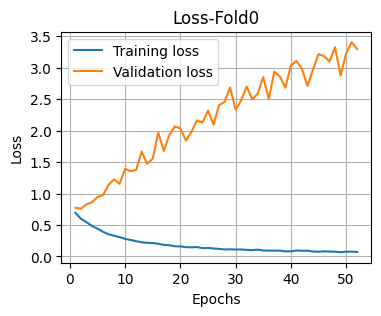

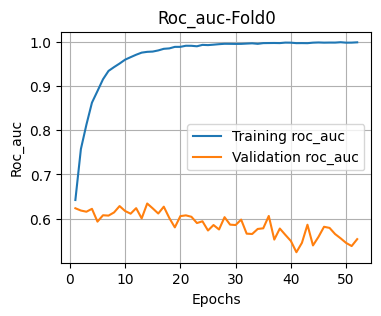

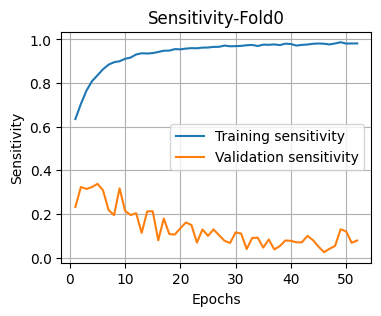

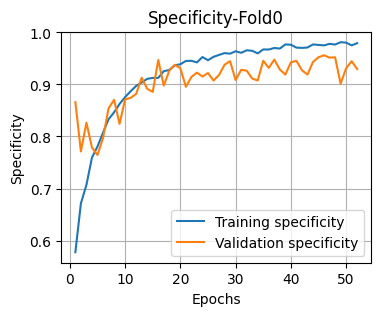

In [ ]:
Dropout=0.0
Reg_L2=1e-4

from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=300,
        patience_es=50,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.5 Dropout 0.0 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,1018,302,56,26,0.317073,0.771212,0.079268,0.126829,0.077783,0.610532



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,1018.0,302.0,56.0,26.0,0.317073,0.771212,0.079268,0.126829,0.077783,0.610532
mean,1018.0,302.0,56.0,26.0,0.317100,0.771200,0.079300,0.126800,0.077800,0.610500
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.5; Reg_L2=1e-2

In [ ]:
Dropout=0.5
Reg_L2=1e-2

EPOCHS       = 30
PATIENCE_ES  = 30


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step
Epoch 1/300
170/170 - 9s - 52ms/step - loss: 2.3925 - roc_auc: 0.5217 - sensitivity: 0.5167 - specificity: 0.5071 - val_loss: 1.9919 - val_roc_auc: 0.5652 - val_sensitivity: 0.2894 - val_specificity: 0.7735
Epoch 2/300
170/170 - 3s - 19ms/step - loss: 1.8356 - roc_auc: 0.5466 - sensitivity: 0.5243 - specificity: 0.5358 - val_loss: 1.6037 - val_roc_auc: 0.5394 - val_sensitivity: 0.5045 - val_specificity: 0.5174
Epoch 3/300
170/170 - 3s - 18ms/step - loss: 1.4625 - roc_auc: 0.5626 - sensitivity: 0.5544 - specificity: 0.5234 - val_loss: 1.3161 - val_roc_auc: 0.5619 - val_sensitivity: 0.3636 - val_specificity: 0.7545
Epoch 4/300
170/170 - 3s - 18ms/step - loss: 1.2100 - roc_auc: 0.5855 - sensitivity: 0.5614 - specificity: 0.5568 - val_loss: 1.1144 - val_roc_auc: 0.5747 - val_sensitivity: 0.5644 - val_specificity: 0.5780
Epoch 5/300
170/170 - 3s - 18ms/step - loss: 1.0405 - roc_auc: 0.5903 - sensitivity: 0.5873 - specificity: 0.5404 

,Metric,Value
0,True Negatives,716.000000
1,False Positives,604.000000
2,False Negatives,31.000000
3,True Positives,51.000000
4,Sensitivity,0.621951
5,Specificity,0.542424
6,Precision,0.077863
7,F1 Score,0.138399
8,PR AUC,0.070322
9,ROC AUC,0.581754


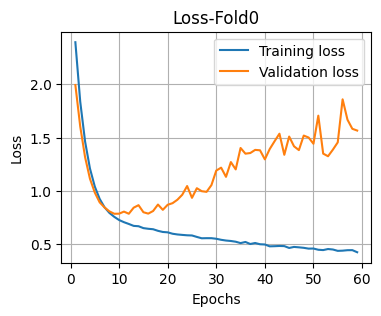

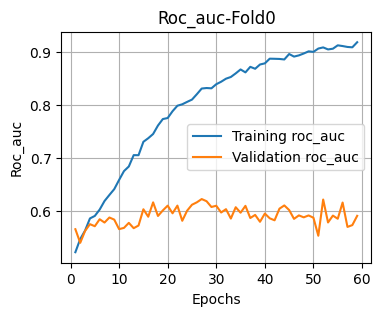

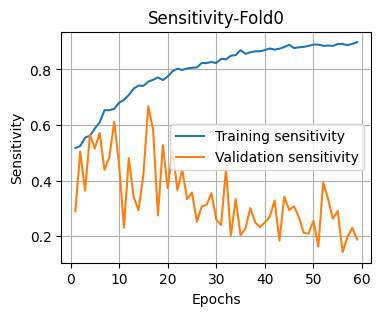

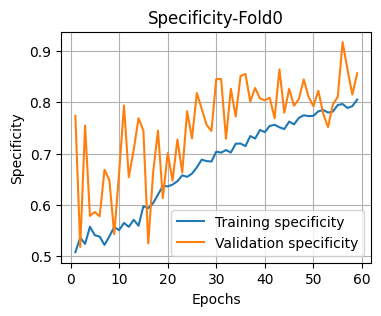

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.5 Dropout 0.5 Reg_L2 0.01

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,716,604,31,51,0.621951,0.542424,0.077863,0.138399,0.070322,0.581754



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,716.0,604.0,31.0,51.0,0.621951,0.542424,0.077863,0.138399,0.070322,0.581754
mean,716.0,604.0,31.0,51.0,0.622000,0.542400,0.077900,0.138400,0.070300,0.581800
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.5; Reg_L2=1e-4

In [ ]:
Dropout=0.5
Reg_L2=1e-4

EPOCHS       = 30
PATIENCE_ES  = 30


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step
Epoch 1/30
170/170 - 9s - 52ms/step - loss: 0.9943 - roc_auc: 0.5241 - sensitivity: 0.4990 - specificity: 0.5382 - val_loss: 0.7307 - val_roc_auc: 0.5574 - val_sensitivity: 0.4652 - val_specificity: 0.6182
Epoch 2/30
170/170 - 3s - 19ms/step - loss: 0.7732 - roc_auc: 0.5565 - sensitivity: 0.5350 - specificity: 0.5472 - val_loss: 0.7194 - val_roc_auc: 0.5588 - val_sensitivity: 0.3015 - val_specificity: 0.7583
Epoch 3/30
170/170 - 3s - 19ms/step - loss: 0.7320 - roc_auc: 0.5589 - sensitivity: 0.5422 - specificity: 0.5437 - val_loss: 0.7061 - val_roc_auc: 0.5700 - val_sensitivity: 0.4705 - val_specificity: 0.6182
Epoch 4/30
170/170 - 3s - 18ms/step - loss: 0.7128 - roc_auc: 0.5765 - sensitivity: 0.5613 - specificity: 0.5515 - val_loss: 0.7031 - val_roc_auc: 0.5774 - val_sensitivity: 0.5568 - val_specificity: 0.6000
Epoch 5/30
170/170 - 3s - 19ms/step - loss: 0.7026 - roc_auc: 0.5911 - sensitivity: 0.5785 - specificity: 0.5498 - val

,Metric,Value
0,True Negatives,792.000000
1,False Positives,528.000000
2,False Negatives,37.000000
3,True Positives,45.000000
4,Sensitivity,0.548780
5,Specificity,0.600000
6,Precision,0.078534
7,F1 Score,0.137405
8,PR AUC,0.071246
9,ROC AUC,0.572709


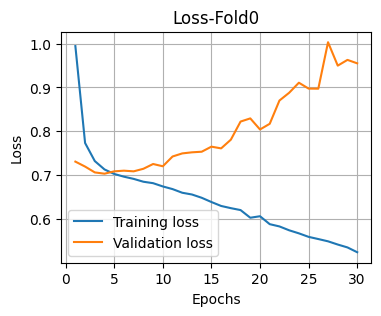

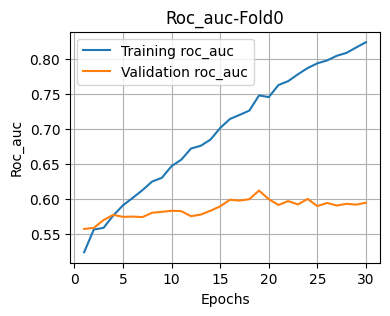

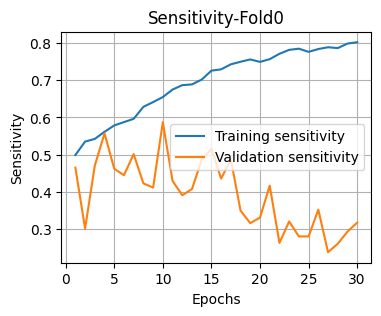

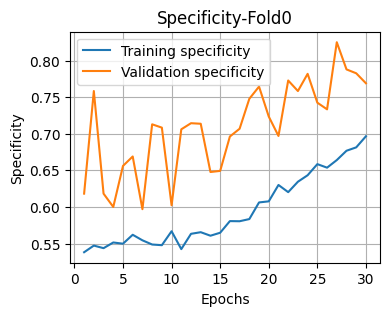

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.5 Dropout 0.5 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,792,528,37,45,0.54878,0.6,0.078534,0.137405,0.071246,0.572709



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,792.0,528.0,37.0,45.0,0.54878,0.6,0.078534,0.137405,0.071246,0.572709
mean,792.0,528.0,37.0,45.0,0.54880,0.6,0.078500,0.137400,0.071200,0.572700
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


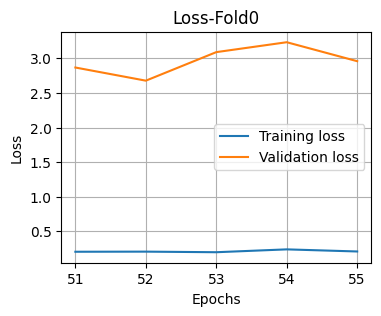

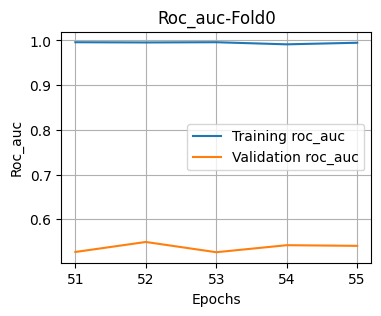

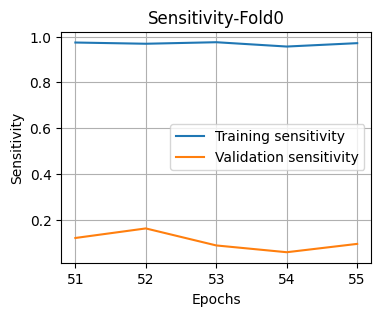

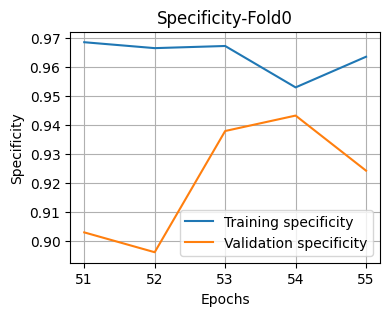

In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.7; Reg_L2=1e-2

In [ ]:
Dropout=0.7
Reg_L2=1e-2

EPOCHS       = 50
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step
Epoch 1/50
170/170 - 9s - 54ms/step - loss: 2.7085 - roc_auc: 0.5213 - sensitivity: 0.5245 - specificity: 0.5110 - val_loss: 2.1262 - val_roc_auc: 0.5702 - val_sensitivity: 0.4295 - val_specificity: 0.6227
Epoch 2/50
170/170 - 3s - 18ms/step - loss: 2.1477 - roc_auc: 0.5201 - sensitivity: 0.5088 - specificity: 0.5213 - val_loss: 1.8319 - val_roc_auc: 0.5862 - val_sensitivity: 0.4197 - val_specificity: 0.7106
Epoch 3/50
170/170 - 3s - 17ms/step - loss: 1.7627 - roc_auc: 0.5232 - sensitivity: 0.5165 - specificity: 0.5090 - val_loss: 1.5695 - val_roc_auc: 0.5901 - val_sensitivity: 0.3674 - val_specificity: 0.7417
Epoch 4/50
170/170 - 3s - 17ms/step - loss: 1.4882 - roc_auc: 0.5388 - sensitivity: 0.5217 - specificity: 0.5398 - val_loss: 1.3535 - val_roc_auc: 0.5833 - val_sensitivity: 0.5432 - val_specificity: 0.5758
Epoch 5/50
170/170 - 3s - 17ms/step - loss: 1.2842 - roc_auc: 0.5369 - sensitivity: 0.5252 - specificity: 0.5132 - val

,Metric,Value
0,True Negatives,915.000000
1,False Positives,405.000000
2,False Negatives,44.000000
3,True Positives,38.000000
4,Sensitivity,0.463415
5,Specificity,0.693182
6,Precision,0.085779
7,F1 Score,0.144762
8,PR AUC,0.075527
9,ROC AUC,0.609183


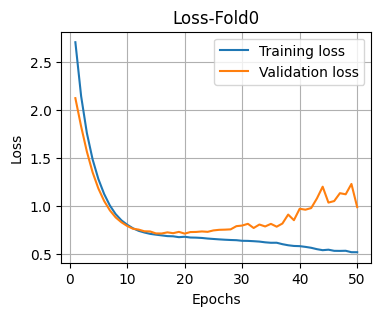

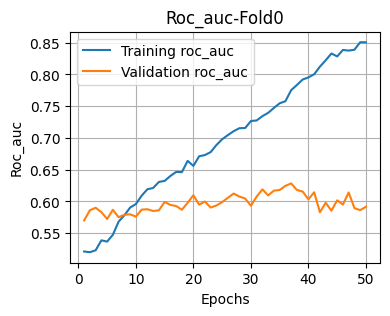

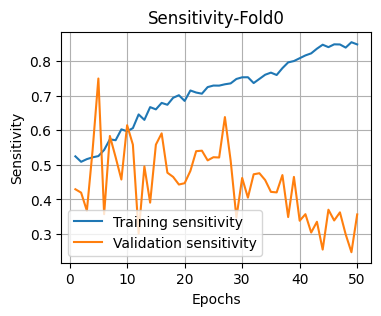

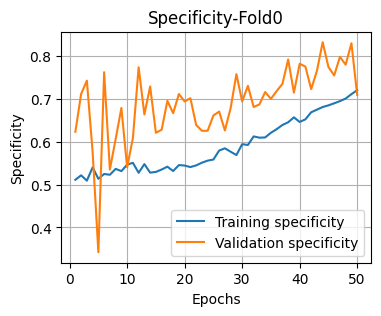

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.5 Dropout 0.7 Reg_L2 0.01

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,915,405,44,38,0.463415,0.693182,0.085779,0.144762,0.075527,0.609183



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,915.0,405.0,44.0,38.0,0.463415,0.693182,0.085779,0.144762,0.075527,0.609183
mean,915.0,405.0,44.0,38.0,0.463400,0.693200,0.085800,0.144800,0.075500,0.609200
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.7; Reg_L2=1e-4

In [ ]:
Dropout=0.7
Reg_L2=1e-4

EPOCHS       = 50
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step
Epoch 1/50
170/170 - 9s - 51ms/step - loss: 1.1527 - roc_auc: 0.5153 - sensitivity: 0.5152 - specificity: 0.5104 - val_loss: 0.7289 - val_roc_auc: 0.5529 - val_sensitivity: 0.6500 - val_specificity: 0.4295
Epoch 2/50
170/170 - 3s - 16ms/step - loss: 0.8578 - roc_auc: 0.5241 - sensitivity: 0.5267 - specificity: 0.5056 - val_loss: 0.7095 - val_roc_auc: 0.5468 - val_sensitivity: 0.5000 - val_specificity: 0.5659
Epoch 3/50
170/170 - 3s - 16ms/step - loss: 0.7573 - roc_auc: 0.5414 - sensitivity: 0.5191 - specificity: 0.5295 - val_loss: 0.7045 - val_roc_auc: 0.5545 - val_sensitivity: 0.6758 - val_specificity: 0.4023
Epoch 4/50
170/170 - 3s - 17ms/step - loss: 0.7351 - roc_auc: 0.5340 - sensitivity: 0.5363 - specificity: 0.5104 - val_loss: 0.7050 - val_roc_auc: 0.5619 - val_sensitivity: 0.6424 - val_specificity: 0.4523
Epoch 5/50
170/170 - 3s - 16ms/step - loss: 0.7183 - roc_auc: 0.5442 - sensitivity: 0.5310 - specificity: 0.5287 - val

,Metric,Value
0,True Negatives,531.000000
1,False Positives,789.000000
2,False Negatives,27.000000
3,True Positives,55.000000
4,Sensitivity,0.670732
5,Specificity,0.402273
6,Precision,0.065166
7,F1 Score,0.118790
8,PR AUC,0.072071
9,ROC AUC,0.550730


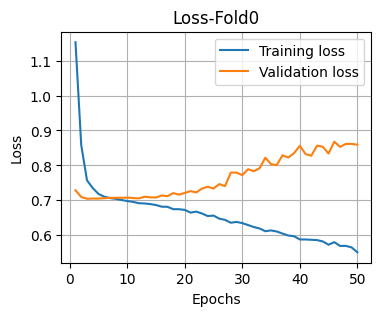

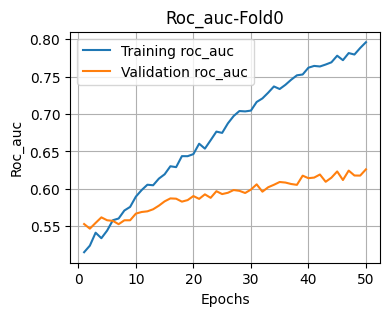

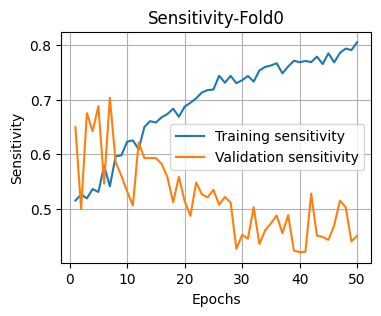

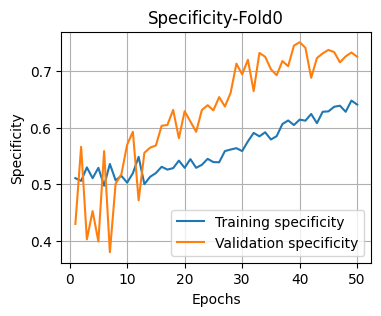

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.5 Dropout 0.7 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,531,789,27,55,0.670732,0.402273,0.065166,0.11879,0.072071,0.55073



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,531.0,789.0,27.0,55.0,0.670732,0.402273,0.065166,0.11879,0.072071,0.55073
mean,531.0,789.0,27.0,55.0,0.670700,0.402300,0.065200,0.11880,0.072100,0.55070
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.9; Reg_L2=1e-2

In [ ]:
Dropout=0.9
Reg_L2=1e-2

EPOCHS       = 100
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step
Epoch 1/100
170/170 - 10s - 59ms/step - loss: 3.5547 - roc_auc: 0.4963 - sensitivity: 0.5143 - specificity: 0.4768 - val_loss: 2.3265 - val_roc_auc: 0.5262 - val_sensitivity: 0.6803 - val_specificity: 0.3030
Epoch 2/100
170/170 - 4s - 21ms/step - loss: 2.7932 - roc_auc: 0.5027 - sensitivity: 0.5136 - specificity: 0.4872 - val_loss: 2.1352 - val_roc_auc: 0.5433 - val_sensitivity: 0.5227 - val_specificity: 0.5174
Epoch 3/100
170/170 - 4s - 21ms/step - loss: 2.2775 - roc_auc: 0.5081 - sensitivity: 0.5038 - specificity: 0.5125 - val_loss: 1.9687 - val_roc_auc: 0.5252 - val_sensitivity: 0.8667 - val_specificity: 0.1561
Epoch 4/100
170/170 - 3s - 20ms/step - loss: 1.9530 - roc_auc: 0.5135 - sensitivity: 0.5247 - specificity: 0.4984 - val_loss: 1.7882 - val_roc_auc: 0.5434 - val_sensitivity: 0.1508 - val_specificity: 0.8341
Epoch 5/100
170/170 - 3s - 20ms/step - loss: 1.7253 - roc_auc: 0.5111 - sensitivity: 0.4796 - specificity: 0.5358

,Metric,Value
0,True Negatives,840.000000
1,False Positives,480.000000
2,False Negatives,35.000000
3,True Positives,47.000000
4,Sensitivity,0.573171
5,Specificity,0.636364
6,Precision,0.089184
7,F1 Score,0.154351
8,PR AUC,0.078176
9,ROC AUC,0.603086


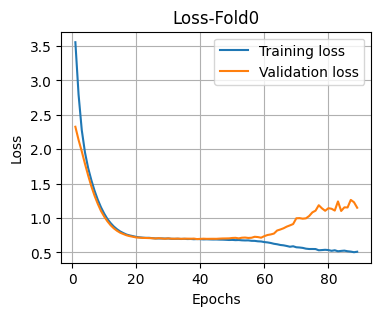

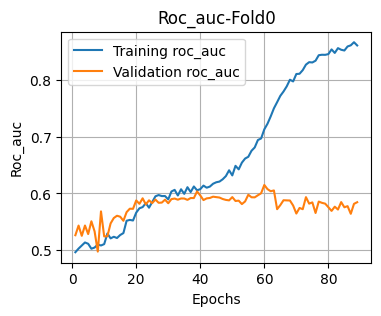

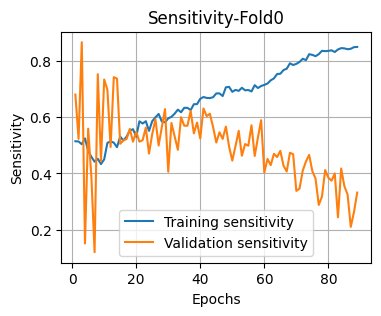

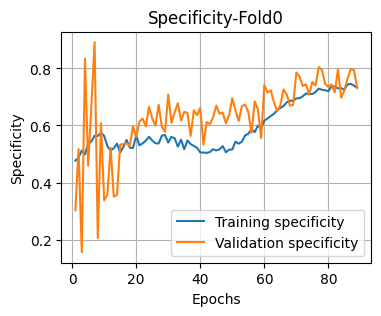

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.5 Dropout 0.9 Reg_L2 0.01

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,840,480,35,47,0.573171,0.636364,0.089184,0.154351,0.078176,0.603086



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,840.0,480.0,35.0,47.0,0.573171,0.636364,0.089184,0.154351,0.078176,0.603086
mean,840.0,480.0,35.0,47.0,0.573200,0.636400,0.089200,0.154400,0.078200,0.603100
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.9; Reg_L2=1e-4

In [ ]:
Dropout=0.9
Reg_L2=1e-4

EPOCHS       = 100
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step
Epoch 1/100
170/170 - 10s - 58ms/step - loss: 2.2188 - roc_auc: 0.5035 - sensitivity: 0.4997 - specificity: 0.5058 - val_loss: 0.7554 - val_roc_auc: 0.5196 - val_sensitivity: 0.4659 - val_specificity: 0.5765
Epoch 2/100
170/170 - 4s - 21ms/step - loss: 1.4778 - roc_auc: 0.4998 - sensitivity: 0.4982 - specificity: 0.5008 - val_loss: 0.7225 - val_roc_auc: 0.5329 - val_sensitivity: 0.2545 - val_specificity: 0.7265
Epoch 3/100
170/170 - 4s - 21ms/step - loss: 1.0501 - roc_auc: 0.4971 - sensitivity: 0.5021 - specificity: 0.4890 - val_loss: 0.7098 - val_roc_auc: 0.5572 - val_sensitivity: 0.1788 - val_specificity: 0.8508
Epoch 4/100
170/170 - 4s - 21ms/step - loss: 0.8280 - roc_auc: 0.5084 - sensitivity: 0.4957 - specificity: 0.5055 - val_loss: 0.7092 - val_roc_auc: 0.5485 - val_sensitivity: 0.1917 - val_specificity: 0.8212
Epoch 5/100
170/170 - 4s - 21ms/step - loss: 0.7504 - roc_auc: 0.5041 - sensitivity: 0.5062 - specificity: 0.4971

,Metric,Value
0,True Negatives,809.000000
1,False Positives,511.000000
2,False Negatives,34.000000
3,True Positives,48.000000
4,Sensitivity,0.585366
5,Specificity,0.612879
6,Precision,0.085868
7,F1 Score,0.149766
8,PR AUC,0.070565
9,ROC AUC,0.583467


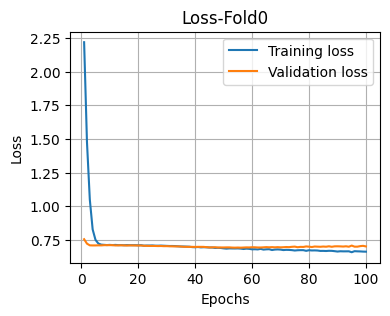

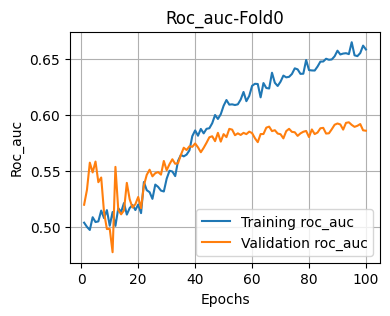

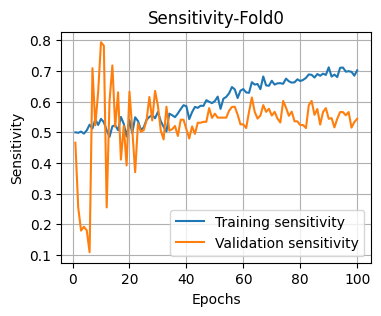

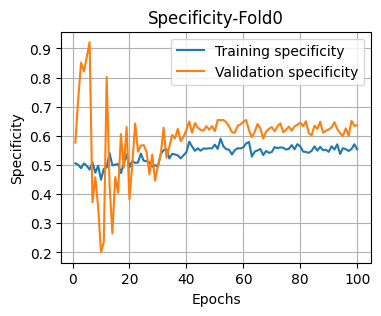

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.5 Dropout 0.9 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,809,511,34,48,0.585366,0.612879,0.085868,0.149766,0.070565,0.583467



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,809.0,511.0,34.0,48.0,0.585366,0.612879,0.085868,0.149766,0.070565,0.583467
mean,809.0,511.0,34.0,48.0,0.585400,0.612900,0.085900,0.149800,0.070600,0.583500
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


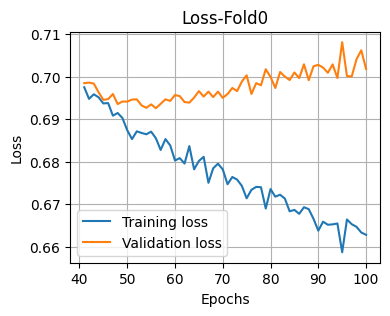

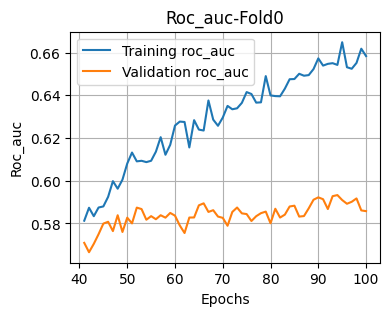

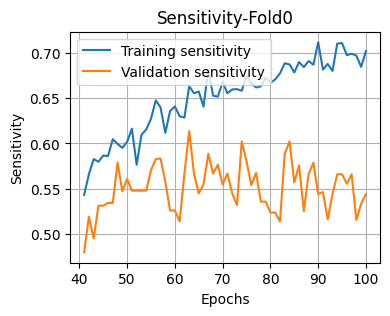

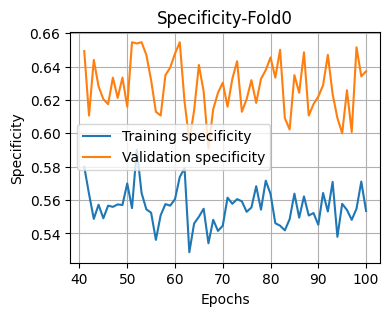

In [ ]:
history = history_record[0]
plot_learning_curves(history, name=f'Fold{fold}',
                     metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
                     init_index=40)


## Mask 0.3

In [ ]:
MASK_RATE = 0.3

INIT_LR=5e-4             #	1e-3 ~ 3e-4
WEIGHT_DECAY=1e-2

BATCH_SIZE   = 64

### Dropout 0.0; Reg_L2=1e-2


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step
Epoch 1/300
170/170 - 10s - 57ms/step - loss: 2.1348 - roc_auc: 0.6472 - sensitivity: 0.6213 - specificity: 0.6073 - val_loss: 2.0095 - val_roc_auc: 0.5289 - val_sensitivity: 0.2333 - val_specificity: 0.7758
Epoch 2/300
170/170 - 4s - 21ms/step - loss: 1.6061 - roc_auc: 0.7556 - sensitivity: 0.7043 - specificity: 0.6690 - val_loss: 1.6800 - val_roc_auc: 0.5323 - val_sensitivity: 0.3568 - val_specificity: 0.7447
Epoch 3/300
170/170 - 3s - 21ms/step - loss: 1.2884 - roc_auc: 0.8125 - sensitivity: 0.7596 - specificity: 0.7161 - val_loss: 1.5501 - val_roc_auc: 0.5038 - val_sensitivity: 0.3409 - val_specificity: 0.6674
Epoch 4/300
170/170 - 3s - 21ms/step - loss: 1.0870 - roc_auc: 0.8475 - sensitivity: 0.7928 - specificity: 0.7427 - val_loss: 1.5255 - val_roc_auc: 0.5508 - val_sensitivity: 0.1992 - val_specificity: 0.8144
Epoch 5/300
170/170 - 4s - 21ms/step - loss: 0.9465 - roc_auc: 0.8774 - sensitivity: 0.8108 - specificity: 0.7768

,Metric,Value
0,True Negatives,980.000000
1,False Positives,340.000000
2,False Negatives,63.000000
3,True Positives,19.000000
4,Sensitivity,0.231707
5,Specificity,0.742424
6,Precision,0.052925
7,F1 Score,0.086168
8,PR AUC,0.057844
9,ROC AUC,0.502005


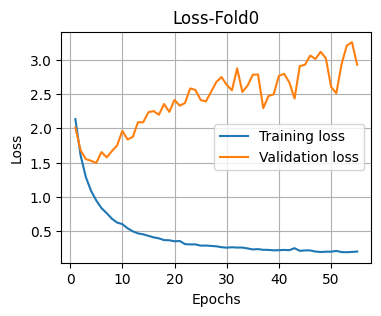

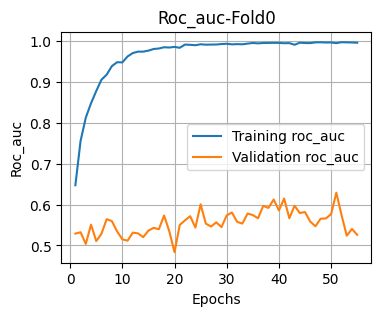

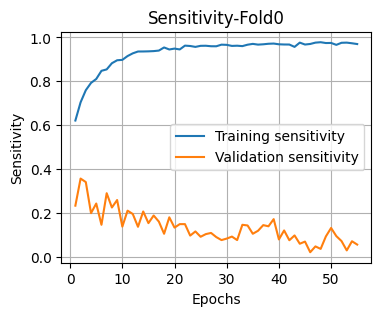

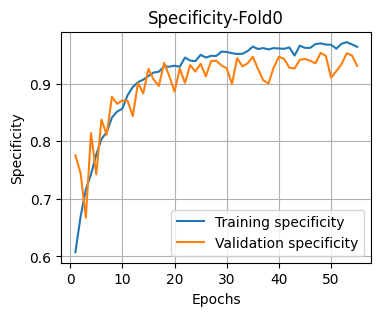

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=0.0,
        reg_l2=1e-2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=300,
        patience_es=50,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.3 Dropout 0.9 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,980,340,63,19,0.231707,0.742424,0.052925,0.086168,0.057844,0.502005



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,980.0,340.0,63.0,19.0,0.231707,0.742424,0.052925,0.086168,0.057844,0.502005
mean,980.0,340.0,63.0,19.0,0.231700,0.742400,0.052900,0.086200,0.057800,0.502000
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.0; Reg_L2=1e-4


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step
Epoch 1/300
170/170 - 9s - 54ms/step - loss: 0.6809 - roc_auc: 0.6545 - sensitivity: 0.6359 - specificity: 0.5916 - val_loss: 0.7694 - val_roc_auc: 0.5911 - val_sensitivity: 0.2288 - val_specificity: 0.7955
Epoch 2/300
170/170 - 3s - 20ms/step - loss: 0.5928 - roc_auc: 0.7655 - sensitivity: 0.7350 - specificity: 0.6609 - val_loss: 0.8329 - val_roc_auc: 0.5766 - val_sensitivity: 0.1811 - val_specificity: 0.8061
Epoch 3/300
170/170 - 3s - 21ms/step - loss: 0.5218 - roc_auc: 0.8314 - sensitivity: 0.7934 - specificity: 0.7198 - val_loss: 0.9058 - val_roc_auc: 0.5968 - val_sensitivity: 0.2159 - val_specificity: 0.8303
Epoch 4/300
170/170 - 3s - 20ms/step - loss: 0.4608 - roc_auc: 0.8758 - sensitivity: 0.8292 - specificity: 0.7588 - val_loss: 1.0570 - val_roc_auc: 0.5608 - val_sensitivity: 0.2205 - val_specificity: 0.8545
Epoch 5/300
170/170 - 3s - 19ms/step - loss: 0.4077 - roc_auc: 0.9075 - sensitivity: 0.8577 - specificity: 0.8021 

,Metric,Value
0,True Negatives,1050.000000
1,False Positives,270.000000
2,False Negatives,64.000000
3,True Positives,18.000000
4,Sensitivity,0.219512
5,Specificity,0.795455
6,Precision,0.062500
7,F1 Score,0.097297
8,PR AUC,0.073530
9,ROC AUC,0.586105


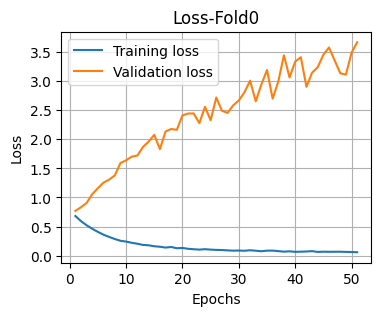

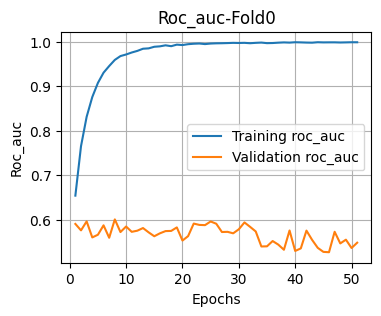

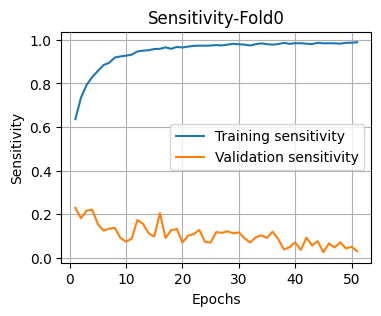

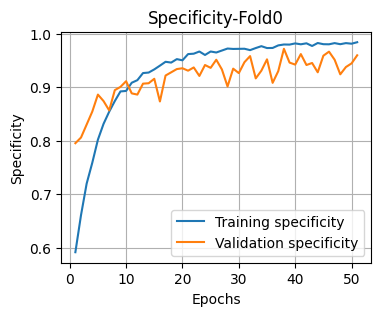

In [ ]:
Dropout=0.0
Reg_L2=1e-4

from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=300,
        patience_es=50,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.3 Dropout 0.0 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,1050,270,64,18,0.219512,0.795455,0.0625,0.097297,0.07353,0.586105



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,1050.0,270.0,64.0,18.0,0.219512,0.795455,0.0625,0.097297,0.07353,0.586105
mean,1050.0,270.0,64.0,18.0,0.219500,0.795500,0.0625,0.097300,0.07350,0.586100
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.5; Reg_L2=1e-2

In [ ]:
Dropout=0.5
Reg_L2=1e-2

EPOCHS       = 30
PATIENCE_ES  = 30


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step
Epoch 1/30
170/170 - 9s - 54ms/step - loss: 2.4495 - roc_auc: 0.5398 - sensitivity: 0.5278 - specificity: 0.5322 - val_loss: 2.0087 - val_roc_auc: 0.6098 - val_sensitivity: 0.3924 - val_specificity: 0.7561
Epoch 2/30
170/170 - 3s - 19ms/step - loss: 1.8832 - roc_auc: 0.5560 - sensitivity: 0.5341 - specificity: 0.5437 - val_loss: 1.6472 - val_roc_auc: 0.6031 - val_sensitivity: 0.3841 - val_specificity: 0.7333
Epoch 3/30
170/170 - 3s - 19ms/step - loss: 1.5207 - roc_auc: 0.5735 - sensitivity: 0.5639 - specificity: 0.5402 - val_loss: 1.3698 - val_roc_auc: 0.5902 - val_sensitivity: 0.3242 - val_specificity: 0.7553
Epoch 4/30
170/170 - 3s - 20ms/step - loss: 1.2698 - roc_auc: 0.5830 - sensitivity: 0.5825 - specificity: 0.5332 - val_loss: 1.1637 - val_roc_auc: 0.5969 - val_sensitivity: 0.4333 - val_specificity: 0.7439
Epoch 5/30
170/170 - 3s - 19ms/step - loss: 1.0893 - roc_auc: 0.5982 - sensitivity: 0.6008 - specificity: 0.5404 - val

,Metric,Value
0,True Negatives,862.000000
1,False Positives,458.000000
2,False Negatives,41.000000
3,True Positives,41.000000
4,Sensitivity,0.500000
5,Specificity,0.653030
6,Precision,0.082164
7,F1 Score,0.141136
8,PR AUC,0.072801
9,ROC AUC,0.607012


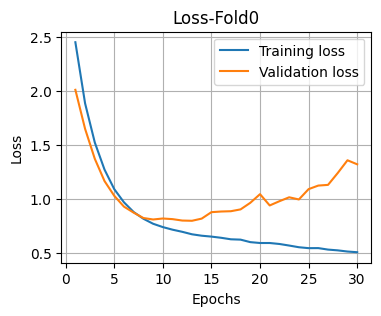

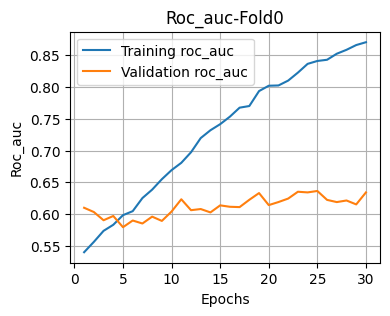

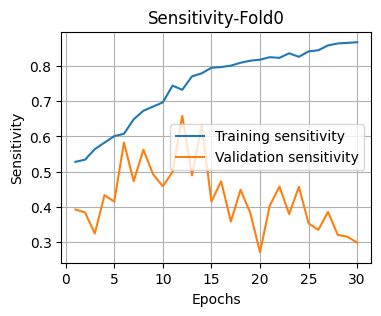

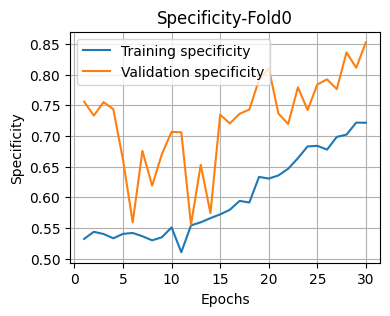

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.3 Dropout 0.5 Reg_L2 0.01

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,862,458,41,41,0.5,0.65303,0.082164,0.141136,0.072801,0.607012



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,862.0,458.0,41.0,41.0,0.5,0.65303,0.082164,0.141136,0.072801,0.607012
mean,862.0,458.0,41.0,41.0,0.5,0.65300,0.082200,0.141100,0.072800,0.607000
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.5; Reg_L2=1e-4

In [ ]:
Dropout=0.5
Reg_L2=1e-4

EPOCHS       = 30
PATIENCE_ES  = 30


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step
Epoch 1/30
170/170 - 9s - 56ms/step - loss: 0.9628 - roc_auc: 0.5399 - sensitivity: 0.5091 - specificity: 0.5468 - val_loss: 0.7377 - val_roc_auc: 0.5381 - val_sensitivity: 0.3235 - val_specificity: 0.7500
Epoch 2/30
170/170 - 4s - 21ms/step - loss: 0.7794 - roc_auc: 0.5481 - sensitivity: 0.5213 - specificity: 0.5500 - val_loss: 0.7197 - val_roc_auc: 0.5605 - val_sensitivity: 0.3000 - val_specificity: 0.8038
Epoch 3/30
170/170 - 3s - 20ms/step - loss: 0.7300 - roc_auc: 0.5707 - sensitivity: 0.5197 - specificity: 0.5845 - val_loss: 0.7140 - val_roc_auc: 0.5544 - val_sensitivity: 0.3311 - val_specificity: 0.7394
Epoch 4/30
170/170 - 3s - 20ms/step - loss: 0.7116 - roc_auc: 0.5838 - sensitivity: 0.5474 - specificity: 0.5751 - val_loss: 0.7167 - val_roc_auc: 0.5596 - val_sensitivity: 0.2356 - val_specificity: 0.8045
Epoch 5/30
170/170 - 3s - 20ms/step - loss: 0.7027 - roc_auc: 0.5945 - sensitivity: 0.5668 - specificity: 0.5629 - val

,Metric,Value
0,True Negatives,835.000000
1,False Positives,485.000000
2,False Negatives,40.000000
3,True Positives,42.000000
4,Sensitivity,0.512195
5,Specificity,0.632576
6,Precision,0.079696
7,F1 Score,0.137931
8,PR AUC,0.068380
9,ROC AUC,0.578298


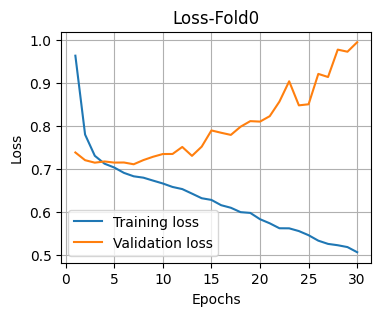

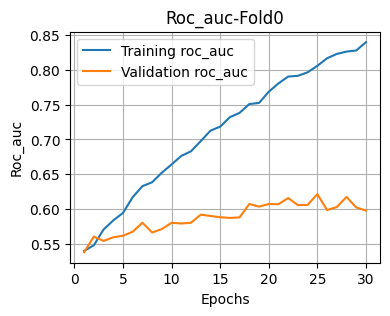

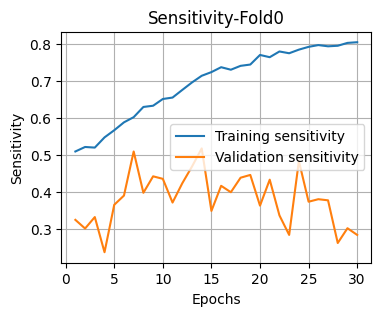

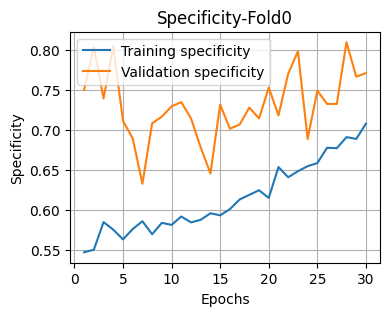

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.3 Dropout 0.5 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,835,485,40,42,0.512195,0.632576,0.079696,0.137931,0.06838,0.578298



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,835.0,485.0,40.0,42.0,0.512195,0.632576,0.079696,0.137931,0.06838,0.578298
mean,835.0,485.0,40.0,42.0,0.512200,0.632600,0.079700,0.137900,0.06840,0.578300
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.7; Reg_L2=1e-2

In [ ]:
Dropout=0.7
Reg_L2=1e-2

EPOCHS       = 50
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step
Epoch 1/50
170/170 - 9s - 55ms/step - loss: 2.6458 - roc_auc: 0.5139 - sensitivity: 0.4903 - specificity: 0.5201 - val_loss: 2.1367 - val_roc_auc: 0.5799 - val_sensitivity: 0.2606 - val_specificity: 0.7917
Epoch 2/50
170/170 - 3s - 20ms/step - loss: 2.0787 - roc_auc: 0.5301 - sensitivity: 0.5132 - specificity: 0.5239 - val_loss: 1.8152 - val_roc_auc: 0.5741 - val_sensitivity: 0.3583 - val_specificity: 0.7576
Epoch 3/50
170/170 - 4s - 21ms/step - loss: 1.7141 - roc_auc: 0.5408 - sensitivity: 0.5332 - specificity: 0.5212 - val_loss: 1.5411 - val_roc_auc: 0.5695 - val_sensitivity: 0.4008 - val_specificity: 0.7182
Epoch 4/50
170/170 - 4s - 21ms/step - loss: 1.4468 - roc_auc: 0.5409 - sensitivity: 0.5206 - specificity: 0.5378 - val_loss: 1.3167 - val_roc_auc: 0.5829 - val_sensitivity: 0.5053 - val_specificity: 0.6409
Epoch 5/50
170/170 - 3s - 19ms/step - loss: 1.2365 - roc_auc: 0.5530 - sensitivity: 0.5254 - specificity: 0.5517 - val

,Metric,Value
0,True Negatives,824.000000
1,False Positives,496.000000
2,False Negatives,39.000000
3,True Positives,43.000000
4,Sensitivity,0.524390
5,Specificity,0.624242
6,Precision,0.079777
7,F1 Score,0.138486
8,PR AUC,0.074096
9,ROC AUC,0.600887


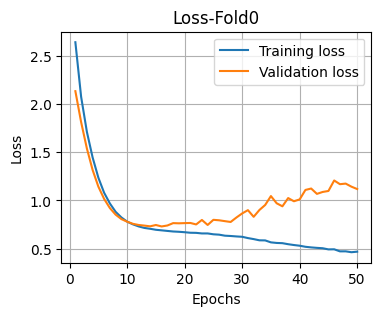

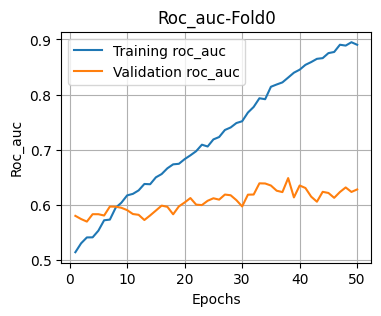

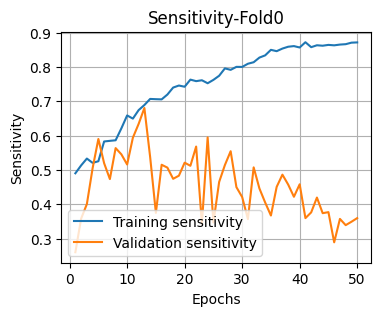

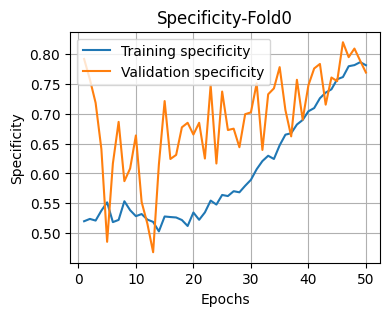

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.3 Dropout 0.7 Reg_L2 0.01

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,824,496,39,43,0.52439,0.624242,0.079777,0.138486,0.074096,0.600887



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,824.0,496.0,39.0,43.0,0.52439,0.624242,0.079777,0.138486,0.074096,0.600887
mean,824.0,496.0,39.0,43.0,0.52440,0.624200,0.079800,0.138500,0.074100,0.600900
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.7; Reg_L2=1e-4

In [ ]:
Dropout=0.7
Reg_L2=1e-4

EPOCHS       = 50
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step
Epoch 1/50
170/170 - 10s - 57ms/step - loss: 1.1005 - roc_auc: 0.5071 - sensitivity: 0.5040 - specificity: 0.5014 - val_loss: 0.7025 - val_roc_auc: 0.5939 - val_sensitivity: 0.5000 - val_specificity: 0.6379
Epoch 2/50
170/170 - 3s - 20ms/step - loss: 0.8238 - roc_auc: 0.5356 - sensitivity: 0.5223 - specificity: 0.5308 - val_loss: 0.6998 - val_roc_auc: 0.5847 - val_sensitivity: 0.4530 - val_specificity: 0.6432
Epoch 3/50
170/170 - 3s - 20ms/step - loss: 0.7533 - roc_auc: 0.5393 - sensitivity: 0.5147 - specificity: 0.5478 - val_loss: 0.7007 - val_roc_auc: 0.5842 - val_sensitivity: 0.4295 - val_specificity: 0.7038
Epoch 4/50
170/170 - 3s - 20ms/step - loss: 0.7257 - roc_auc: 0.5504 - sensitivity: 0.5341 - specificity: 0.5378 - val_loss: 0.7019 - val_roc_auc: 0.5770 - val_sensitivity: 0.4871 - val_specificity: 0.6333
Epoch 5/50
170/170 - 3s - 20ms/step - loss: 0.7158 - roc_auc: 0.5450 - sensitivity: 0.5389 - specificity: 0.5182 - va

,Metric,Value
0,True Negatives,849.000000
1,False Positives,471.000000
2,False Negatives,46.000000
3,True Positives,36.000000
4,Sensitivity,0.439024
5,Specificity,0.643182
6,Precision,0.071006
7,F1 Score,0.122241
8,PR AUC,0.079191
9,ROC AUC,0.574224


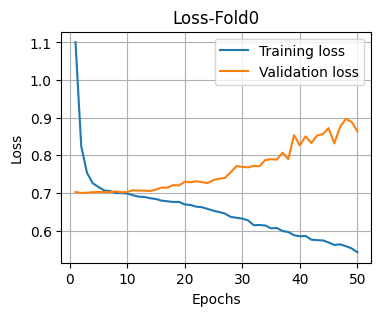

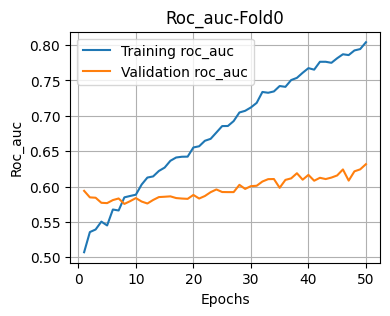

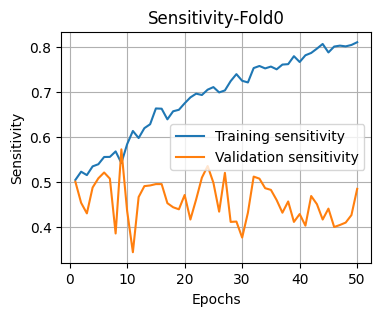

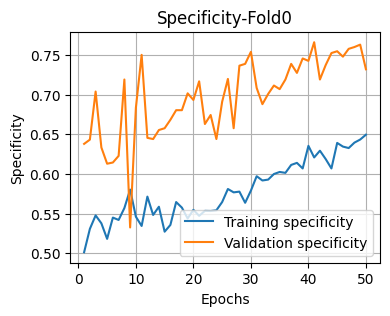

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.3 Dropout 0.7 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,849,471,46,36,0.439024,0.643182,0.071006,0.122241,0.079191,0.574224



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,849.0,471.0,46.0,36.0,0.439024,0.643182,0.071006,0.122241,0.079191,0.574224
mean,849.0,471.0,46.0,36.0,0.439000,0.643200,0.071000,0.122200,0.079200,0.574200
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.9; Reg_L2=1e-2

In [ ]:
Dropout=0.9
Reg_L2=1e-2

EPOCHS       = 100
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step
Epoch 1/100
170/170 - 10s - 57ms/step - loss: 3.3888 - roc_auc: 0.5000 - sensitivity: 0.5204 - specificity: 0.4846 - val_loss: 2.2785 - val_roc_auc: 0.5799 - val_sensitivity: 0.5174 - val_specificity: 0.6038
Epoch 2/100
170/170 - 3s - 21ms/step - loss: 2.6155 - roc_auc: 0.5036 - sensitivity: 0.5151 - specificity: 0.4894 - val_loss: 2.0785 - val_roc_auc: 0.5934 - val_sensitivity: 0.7341 - val_specificity: 0.3295
Epoch 3/100
170/170 - 4s - 21ms/step - loss: 2.1397 - roc_auc: 0.4997 - sensitivity: 0.5084 - specificity: 0.4844 - val_loss: 1.8891 - val_roc_auc: 0.5835 - val_sensitivity: 0.9167 - val_specificity: 0.1326
Epoch 4/100
170/170 - 3s - 20ms/step - loss: 1.8331 - roc_auc: 0.5073 - sensitivity: 0.5016 - specificity: 0.5125 - val_loss: 1.6960 - val_roc_auc: 0.5701 - val_sensitivity: 0.8091 - val_specificity: 0.2697
Epoch 5/100
170/170 - 4s - 21ms/step - loss: 1.6176 - roc_auc: 0.5190 - sensitivity: 0.5080 - specificity: 0.5149

,Metric,Value
0,True Negatives,879.000000
1,False Positives,441.000000
2,False Negatives,37.000000
3,True Positives,45.000000
4,Sensitivity,0.548780
5,Specificity,0.665909
6,Precision,0.092593
7,F1 Score,0.158451
8,PR AUC,0.076148
9,ROC AUC,0.599464


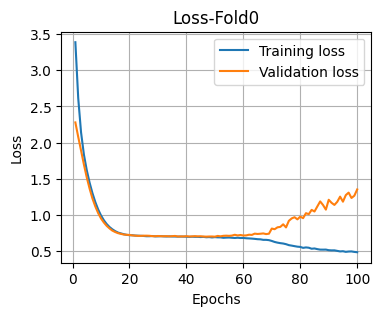

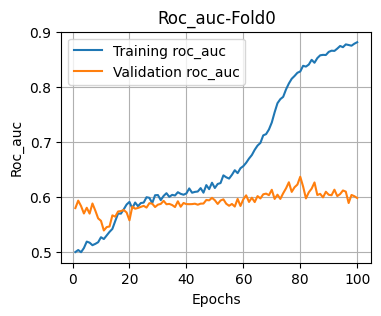

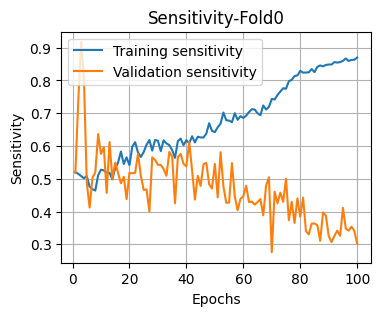

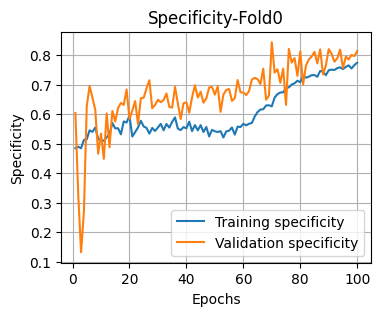

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.3 Dropout 0.9 Reg_L2 0.01

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,879,441,37,45,0.54878,0.665909,0.092593,0.158451,0.076148,0.599464



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,879.0,441.0,37.0,45.0,0.54878,0.665909,0.092593,0.158451,0.076148,0.599464
mean,879.0,441.0,37.0,45.0,0.54880,0.665900,0.092600,0.158500,0.076100,0.599500
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.9; Reg_L2=1e-4

In [ ]:
Dropout=0.9
Reg_L2=1e-4

EPOCHS       = 100
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step
Epoch 1/100
170/170 - 9s - 55ms/step - loss: 1.8824 - roc_auc: 0.5113 - sensitivity: 0.5315 - specificity: 0.4816 - val_loss: 0.7255 - val_roc_auc: 0.5783 - val_sensitivity: 0.7742 - val_specificity: 0.2712
Epoch 2/100
170/170 - 3s - 20ms/step - loss: 1.2849 - roc_auc: 0.4961 - sensitivity: 0.4981 - specificity: 0.4910 - val_loss: 0.7004 - val_roc_auc: 0.5856 - val_sensitivity: 0.4955 - val_specificity: 0.6689
Epoch 3/100
170/170 - 3s - 20ms/step - loss: 0.9150 - roc_auc: 0.5077 - sensitivity: 0.5010 - specificity: 0.5090 - val_loss: 0.7038 - val_roc_auc: 0.5944 - val_sensitivity: 0.4538 - val_specificity: 0.6871
Epoch 4/100
170/170 - 3s - 19ms/step - loss: 0.7906 - roc_auc: 0.5010 - sensitivity: 0.4820 - specificity: 0.5180 - val_loss: 0.7070 - val_roc_auc: 0.5782 - val_sensitivity: 0.4197 - val_specificity: 0.6682
Epoch 5/100
170/170 - 3s - 20ms/step - loss: 0.7377 - roc_auc: 0.5025 - sensitivity: 0.4448 - specificity: 0.5544 

,Metric,Value
0,True Negatives,789.000000
1,False Positives,531.000000
2,False Negatives,35.000000
3,True Positives,47.000000
4,Sensitivity,0.573171
5,Specificity,0.597727
6,Precision,0.081315
7,F1 Score,0.142424
8,PR AUC,0.080220
9,ROC AUC,0.594143


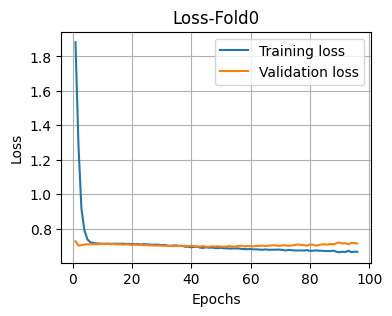

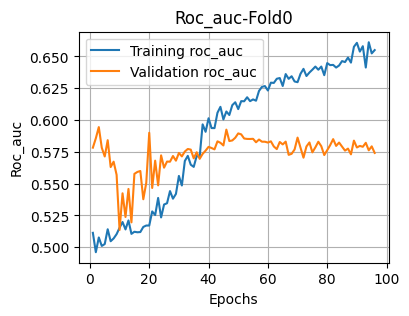

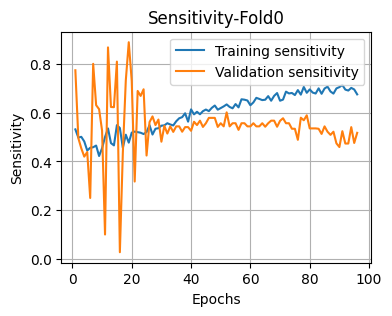

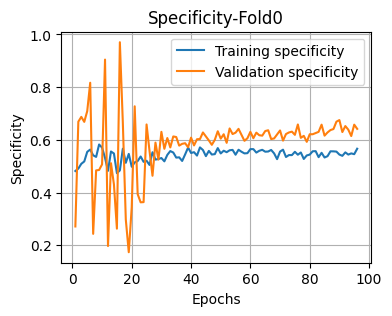

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.3 Dropout 0.9 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,789,531,35,47,0.573171,0.597727,0.081315,0.142424,0.08022,0.594143



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,789.0,531.0,35.0,47.0,0.573171,0.597727,0.081315,0.142424,0.08022,0.594143
mean,789.0,531.0,35.0,47.0,0.573200,0.597700,0.081300,0.142400,0.08020,0.594100
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


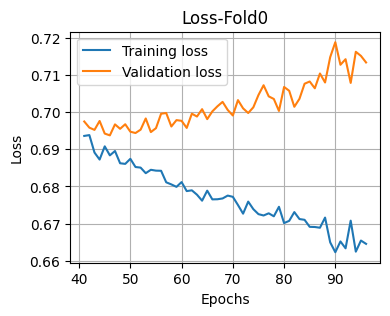

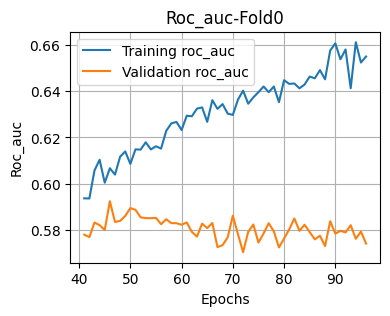

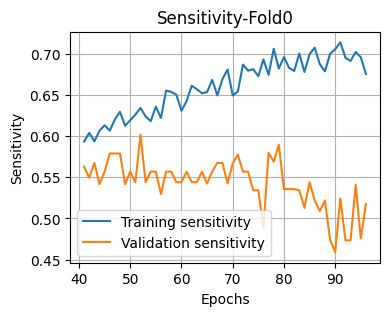

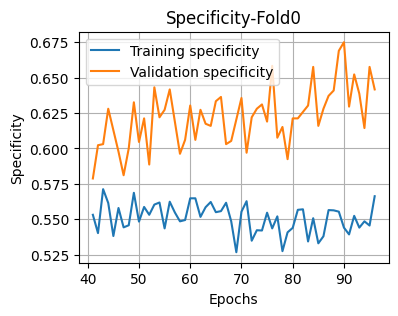

In [ ]:
history = history_record[0]
plot_learning_curves(history, name=f'Fold{fold}',
                     metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
                     init_index=40)


## Mask 0.7

In [ ]:
MASK_RATE = 0.7

INIT_LR=5e-4             #	1e-3 ~ 3e-4
WEIGHT_DECAY=1e-2

BATCH_SIZE   = 64

### Dropout 0.0; Reg_L2=1e-2


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step
Epoch 1/300
170/170 - 9s - 51ms/step - loss: 2.1076 - roc_auc: 0.6383 - sensitivity: 0.6272 - specificity: 0.5794 - val_loss: 1.9748 - val_roc_auc: 0.5237 - val_sensitivity: 0.3386 - val_specificity: 0.7280
Epoch 2/300
170/170 - 3s - 18ms/step - loss: 1.5828 - roc_auc: 0.7400 - sensitivity: 0.7050 - specificity: 0.6393 - val_loss: 1.6839 - val_roc_auc: 0.5485 - val_sensitivity: 0.1356 - val_specificity: 0.8273
Epoch 3/300
170/170 - 3s - 18ms/step - loss: 1.2533 - roc_auc: 0.8058 - sensitivity: 0.7647 - specificity: 0.6919 - val_loss: 1.5747 - val_roc_auc: 0.5418 - val_sensitivity: 0.2735 - val_specificity: 0.7985
Epoch 4/300
170/170 - 3s - 18ms/step - loss: 1.0534 - roc_auc: 0.8416 - sensitivity: 0.7925 - specificity: 0.7272 - val_loss: 1.5401 - val_roc_auc: 0.5718 - val_sensitivity: 0.0848 - val_specificity: 0.8894
Epoch 5/300
170/170 - 3s - 18ms/step - loss: 0.9130 - roc_auc: 0.8737 - sensitivity: 0.8169 - specificity: 0.7642 

,Metric,Value
0,True Negatives,1035.000000
1,False Positives,285.000000
2,False Negatives,54.000000
3,True Positives,28.000000
4,Sensitivity,0.341463
5,Specificity,0.784091
6,Precision,0.089457
7,F1 Score,0.141772
8,PR AUC,0.077355
9,ROC AUC,0.595067


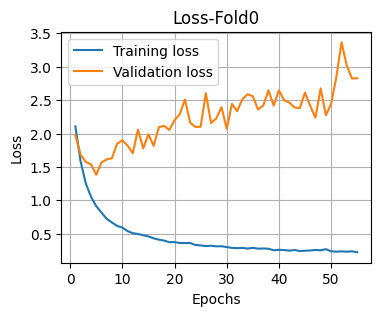

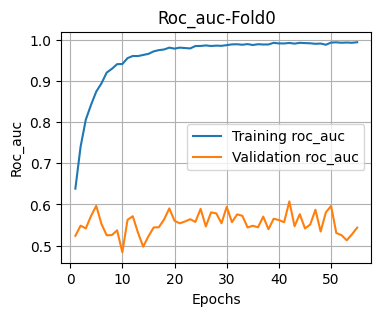

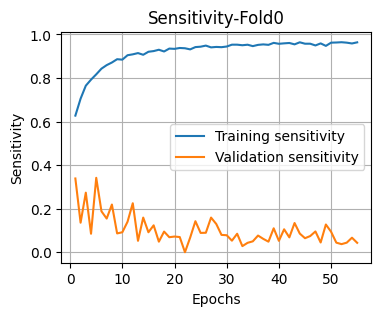

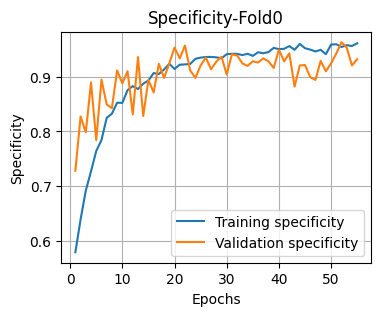

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=0.0,
        reg_l2=1e-2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=300,
        patience_es=50,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.7 Dropout 0.9 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,1035,285,54,28,0.341463,0.784091,0.089457,0.141772,0.077355,0.595067



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,1035.0,285.0,54.0,28.0,0.341463,0.784091,0.089457,0.141772,0.077355,0.595067
mean,1035.0,285.0,54.0,28.0,0.341500,0.784100,0.089500,0.141800,0.077400,0.595100
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.0; Reg_L2=1e-4


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step
Epoch 1/300
170/170 - 9s - 56ms/step - loss: 0.7104 - roc_auc: 0.6222 - sensitivity: 0.6110 - specificity: 0.5744 - val_loss: 0.7811 - val_roc_auc: 0.5270 - val_sensitivity: 0.2780 - val_specificity: 0.7265
Epoch 2/300
170/170 - 3s - 20ms/step - loss: 0.6166 - roc_auc: 0.7364 - sensitivity: 0.7017 - specificity: 0.6335 - val_loss: 0.8285 - val_roc_auc: 0.5313 - val_sensitivity: 0.2720 - val_specificity: 0.7364
Epoch 3/300
170/170 - 3s - 20ms/step - loss: 0.5593 - roc_auc: 0.7995 - sensitivity: 0.7496 - specificity: 0.6912 - val_loss: 0.9475 - val_roc_auc: 0.4931 - val_sensitivity: 0.1894 - val_specificity: 0.8159
Epoch 4/300
170/170 - 3s - 19ms/step - loss: 0.5050 - roc_auc: 0.8445 - sensitivity: 0.7886 - specificity: 0.7407 - val_loss: 0.9838 - val_roc_auc: 0.5310 - val_sensitivity: 0.2197 - val_specificity: 0.8394
Epoch 5/300
170/170 - 3s - 19ms/step - loss: 0.4624 - roc_auc: 0.8740 - sensitivity: 0.8130 - specificity: 0.7671 

,Metric,Value
0,True Negatives,959.000000
1,False Positives,361.000000
2,False Negatives,58.000000
3,True Positives,24.000000
4,Sensitivity,0.292683
5,Specificity,0.726515
6,Precision,0.062338
7,F1 Score,0.102784
8,PR AUC,0.064047
9,ROC AUC,0.533056


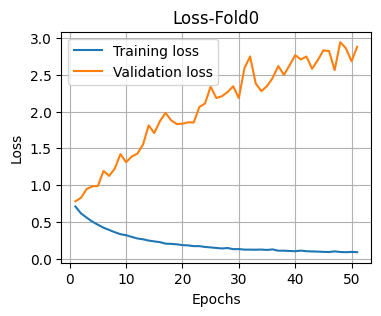

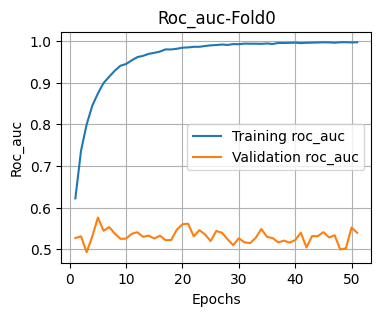

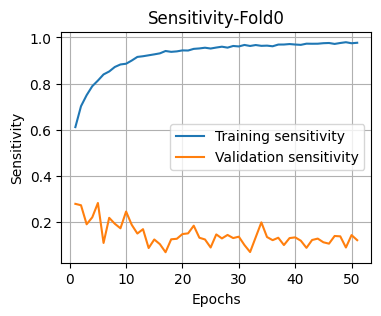

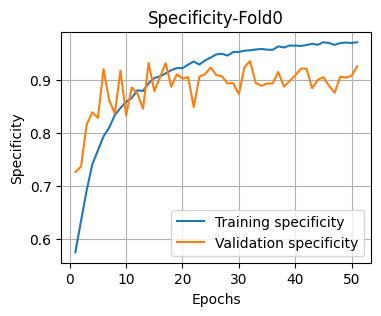

In [ ]:
Dropout=0.0
Reg_L2=1e-4

from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=300,
        patience_es=50,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.7 Dropout 0.0 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,959,361,58,24,0.292683,0.726515,0.062338,0.102784,0.064047,0.533056



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,959.0,361.0,58.0,24.0,0.292683,0.726515,0.062338,0.102784,0.064047,0.533056
mean,959.0,361.0,58.0,24.0,0.292700,0.726500,0.062300,0.102800,0.064000,0.533100
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.5; Reg_L2=1e-2

In [ ]:
Dropout=0.5
Reg_L2=1e-2

EPOCHS       = 30
PATIENCE_ES  = 30


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step
Epoch 1/30
170/170 - 9s - 54ms/step - loss: 2.4272 - roc_auc: 0.5322 - sensitivity: 0.5210 - specificity: 0.5313 - val_loss: 2.0348 - val_roc_auc: 0.5750 - val_sensitivity: 0.3977 - val_specificity: 0.6886
Epoch 2/30
170/170 - 3s - 19ms/step - loss: 1.8805 - roc_auc: 0.5535 - sensitivity: 0.5252 - specificity: 0.5365 - val_loss: 1.6639 - val_roc_auc: 0.5803 - val_sensitivity: 0.4227 - val_specificity: 0.7008
Epoch 3/30
170/170 - 3s - 19ms/step - loss: 1.5255 - roc_auc: 0.5697 - sensitivity: 0.5690 - specificity: 0.5356 - val_loss: 1.3811 - val_roc_auc: 0.5815 - val_sensitivity: 0.4909 - val_specificity: 0.6644
Epoch 4/30
170/170 - 3s - 20ms/step - loss: 1.2652 - roc_auc: 0.5905 - sensitivity: 0.5757 - specificity: 0.5470 - val_loss: 1.1749 - val_roc_auc: 0.5833 - val_sensitivity: 0.2902 - val_specificity: 0.7879
Epoch 5/30
170/170 - 3s - 20ms/step - loss: 1.0906 - roc_auc: 0.5881 - sensitivity: 0.5724 - specificity: 0.5520 - val

,Metric,Value
0,True Negatives,886.000000
1,False Positives,434.000000
2,False Negatives,43.000000
3,True Positives,39.000000
4,Sensitivity,0.475610
5,Specificity,0.671212
6,Precision,0.082452
7,F1 Score,0.140541
8,PR AUC,0.070944
9,ROC AUC,0.596443


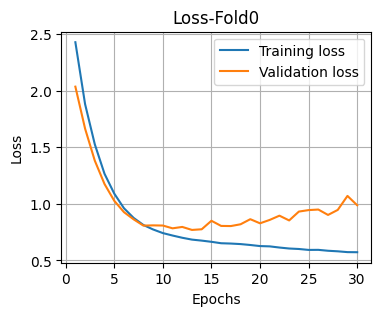

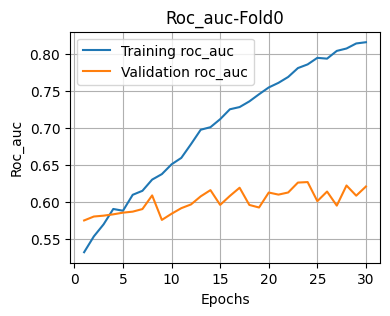

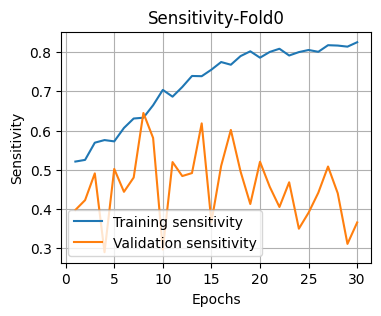

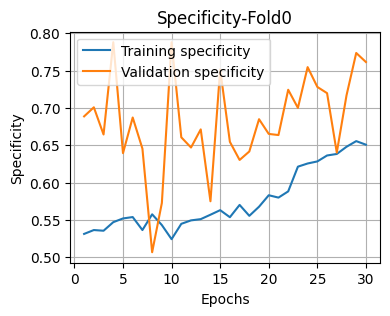

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.7 Dropout 0.5 Reg_L2 0.01

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,886,434,43,39,0.47561,0.671212,0.082452,0.140541,0.070944,0.596443



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,886.0,434.0,43.0,39.0,0.47561,0.671212,0.082452,0.140541,0.070944,0.596443
mean,886.0,434.0,43.0,39.0,0.47560,0.671200,0.082500,0.140500,0.070900,0.596400
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.5; Reg_L2=1e-4

In [ ]:
Dropout=0.5
Reg_L2=1e-4

EPOCHS       = 30
PATIENCE_ES  = 30


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step
Epoch 1/30
170/170 - 9s - 55ms/step - loss: 0.9613 - roc_auc: 0.5329 - sensitivity: 0.5356 - specificity: 0.5140 - val_loss: 0.7338 - val_roc_auc: 0.5533 - val_sensitivity: 0.6038 - val_specificity: 0.4894
Epoch 2/30
170/170 - 3s - 20ms/step - loss: 0.7691 - roc_auc: 0.5571 - sensitivity: 0.5559 - specificity: 0.5311 - val_loss: 0.7140 - val_roc_auc: 0.5528 - val_sensitivity: 0.6765 - val_specificity: 0.4629
Epoch 3/30
170/170 - 4s - 21ms/step - loss: 0.7277 - roc_auc: 0.5669 - sensitivity: 0.5711 - specificity: 0.5249 - val_loss: 0.7070 - val_roc_auc: 0.5712 - val_sensitivity: 0.6742 - val_specificity: 0.4591
Epoch 4/30
170/170 - 3s - 20ms/step - loss: 0.7083 - roc_auc: 0.5872 - sensitivity: 0.5966 - specificity: 0.5287 - val_loss: 0.7069 - val_roc_auc: 0.5805 - val_sensitivity: 0.6182 - val_specificity: 0.5674
Epoch 5/30
170/170 - 3s - 19ms/step - loss: 0.7004 - roc_auc: 0.5991 - sensitivity: 0.6093 - specificity: 0.5433 - val

,Metric,Value
0,True Negatives,724.000000
1,False Positives,596.000000
2,False Negatives,31.000000
3,True Positives,51.000000
4,Sensitivity,0.621951
5,Specificity,0.548485
6,Precision,0.078825
7,F1 Score,0.139918
8,PR AUC,0.072993
9,ROC AUC,0.592877


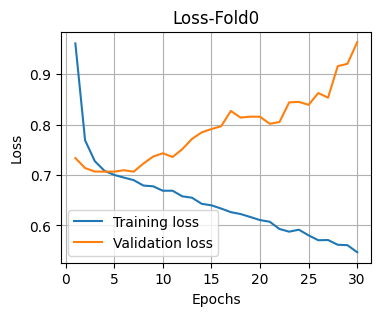

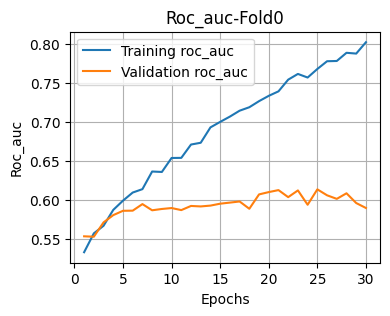

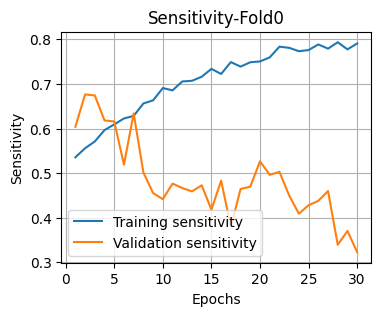

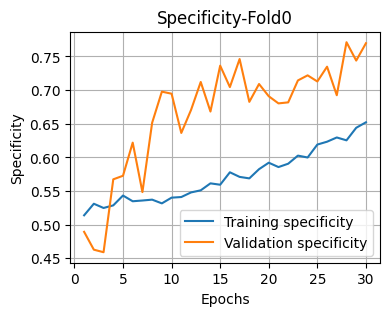

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.7 Dropout 0.5 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,724,596,31,51,0.621951,0.548485,0.078825,0.139918,0.072993,0.592877



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,724.0,596.0,31.0,51.0,0.621951,0.548485,0.078825,0.139918,0.072993,0.592877
mean,724.0,596.0,31.0,51.0,0.622000,0.548500,0.078800,0.139900,0.073000,0.592900
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.7; Reg_L2=1e-2

In [ ]:
Dropout=0.7
Reg_L2=1e-2

EPOCHS       = 50
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step
Epoch 1/50
170/170 - 9s - 55ms/step - loss: 2.8212 - roc_auc: 0.5153 - sensitivity: 0.5043 - specificity: 0.5160 - val_loss: 2.2028 - val_roc_auc: 0.5548 - val_sensitivity: 0.4114 - val_specificity: 0.6553
Epoch 2/50
170/170 - 3s - 20ms/step - loss: 2.2584 - roc_auc: 0.5196 - sensitivity: 0.4962 - specificity: 0.5326 - val_loss: 1.9278 - val_roc_auc: 0.5386 - val_sensitivity: 0.2538 - val_specificity: 0.7629
Epoch 3/50
170/170 - 3s - 20ms/step - loss: 1.8647 - roc_auc: 0.5330 - sensitivity: 0.5056 - specificity: 0.5352 - val_loss: 1.6761 - val_roc_auc: 0.5318 - val_sensitivity: 0.2902 - val_specificity: 0.7439
Epoch 4/50
170/170 - 3s - 20ms/step - loss: 1.5975 - roc_auc: 0.5266 - sensitivity: 0.4971 - specificity: 0.5330 - val_loss: 1.4567 - val_roc_auc: 0.5348 - val_sensitivity: 0.4606 - val_specificity: 0.5962
Epoch 5/50
170/170 - 3s - 20ms/step - loss: 1.3822 - roc_auc: 0.5295 - sensitivity: 0.5027 - specificity: 0.5332 - val

,Metric,Value
0,True Negatives,712.000000
1,False Positives,608.000000
2,False Negatives,31.000000
3,True Positives,51.000000
4,Sensitivity,0.621951
5,Specificity,0.539394
6,Precision,0.077390
7,F1 Score,0.137652
8,PR AUC,0.072967
9,ROC AUC,0.592064


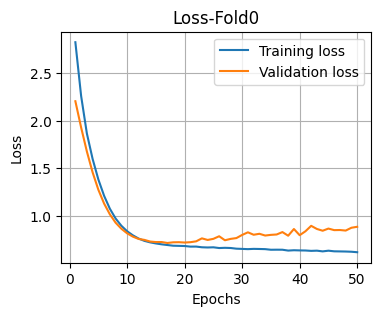

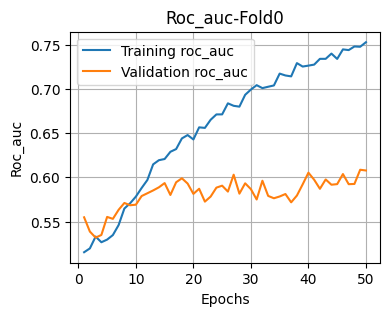

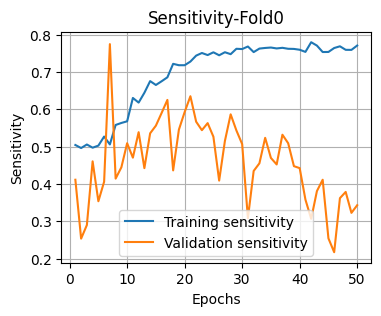

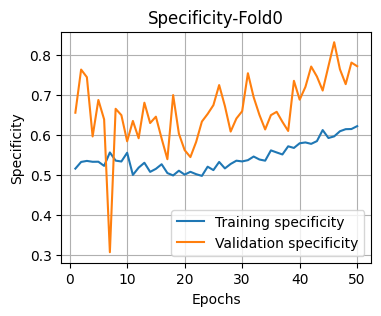

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.7 Dropout 0.7 Reg_L2 0.01

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,712,608,31,51,0.621951,0.539394,0.07739,0.137652,0.072967,0.592064



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,712.0,608.0,31.0,51.0,0.621951,0.539394,0.07739,0.137652,0.072967,0.592064
mean,712.0,608.0,31.0,51.0,0.622000,0.539400,0.07740,0.137700,0.073000,0.592100
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.7; Reg_L2=1e-4

In [ ]:
Dropout=0.7
Reg_L2=1e-4

EPOCHS       = 50
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step
Epoch 1/50
170/170 - 10s - 59ms/step - loss: 1.2290 - roc_auc: 0.5300 - sensitivity: 0.5265 - specificity: 0.5249 - val_loss: 0.7564 - val_roc_auc: 0.5438 - val_sensitivity: 0.4992 - val_specificity: 0.5273
Epoch 2/50
170/170 - 3s - 20ms/step - loss: 0.8851 - roc_auc: 0.5289 - sensitivity: 0.5249 - specificity: 0.5167 - val_loss: 0.7140 - val_roc_auc: 0.5426 - val_sensitivity: 0.5750 - val_specificity: 0.4659
Epoch 3/50
170/170 - 3s - 20ms/step - loss: 0.7749 - roc_auc: 0.5327 - sensitivity: 0.5147 - specificity: 0.5252 - val_loss: 0.7081 - val_roc_auc: 0.5430 - val_sensitivity: 0.5750 - val_specificity: 0.4485
Epoch 4/50
170/170 - 4s - 21ms/step - loss: 0.7399 - roc_auc: 0.5328 - sensitivity: 0.5243 - specificity: 0.5173 - val_loss: 0.7066 - val_roc_auc: 0.5446 - val_sensitivity: 0.6023 - val_specificity: 0.4545
Epoch 5/50
170/170 - 3s - 20ms/step - loss: 0.7254 - roc_auc: 0.5399 - sensitivity: 0.5389 - specificity: 0.5112 - va

,Metric,Value
0,True Negatives,753.000000
1,False Positives,567.000000
2,False Negatives,39.000000
3,True Positives,43.000000
4,Sensitivity,0.524390
5,Specificity,0.570455
6,Precision,0.070492
7,F1 Score,0.124277
8,PR AUC,0.069253
9,ROC AUC,0.580146


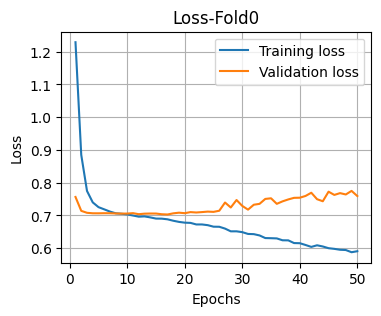

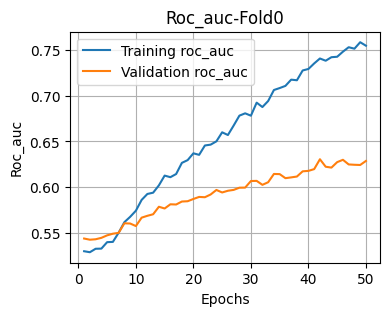

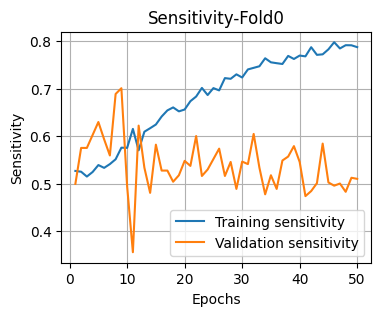

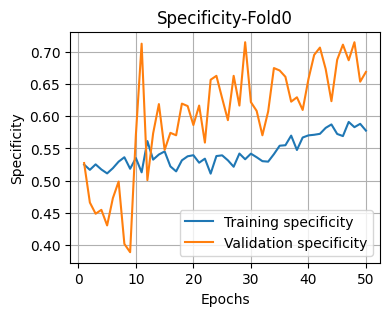

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.7 Dropout 0.7 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,753,567,39,43,0.52439,0.570455,0.070492,0.124277,0.069253,0.580146



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,753.0,567.0,39.0,43.0,0.52439,0.570455,0.070492,0.124277,0.069253,0.580146
mean,753.0,567.0,39.0,43.0,0.52440,0.570500,0.070500,0.124300,0.069300,0.580100
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.9; Reg_L2=1e-2

In [ ]:
Dropout=0.9
Reg_L2=1e-2

EPOCHS       = 100
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step
Epoch 1/100
170/170 - 10s - 57ms/step - loss: 3.8441 - roc_auc: 0.5088 - sensitivity: 0.4914 - specificity: 0.5169 - val_loss: 2.3536 - val_roc_auc: 0.5203 - val_sensitivity: 0.5379 - val_specificity: 0.4902
Epoch 2/100
170/170 - 3s - 20ms/step - loss: 3.0810 - roc_auc: 0.5052 - sensitivity: 0.4958 - specificity: 0.5101 - val_loss: 2.1817 - val_roc_auc: 0.5368 - val_sensitivity: 0.3424 - val_specificity: 0.6311
Epoch 3/100
170/170 - 3s - 21ms/step - loss: 2.4968 - roc_auc: 0.5108 - sensitivity: 0.5030 - specificity: 0.5066 - val_loss: 2.0367 - val_roc_auc: 0.5237 - val_sensitivity: 0.2379 - val_specificity: 0.7508
Epoch 4/100
170/170 - 3s - 19ms/step - loss: 2.1196 - roc_auc: 0.5065 - sensitivity: 0.5093 - specificity: 0.5003 - val_loss: 1.8796 - val_roc_auc: 0.5354 - val_sensitivity: 0.2629 - val_specificity: 0.7538
Epoch 5/100
170/170 - 3s - 20ms/step - loss: 1.8586 - roc_auc: 0.5106 - sensitivity: 0.5176 - specificity: 0.5012

,Metric,Value
0,True Negatives,766.000000
1,False Positives,554.000000
2,False Negatives,31.000000
3,True Positives,51.000000
4,Sensitivity,0.621951
5,Specificity,0.580303
6,Precision,0.084298
7,F1 Score,0.148472
8,PR AUC,0.081899
9,ROC AUC,0.609211


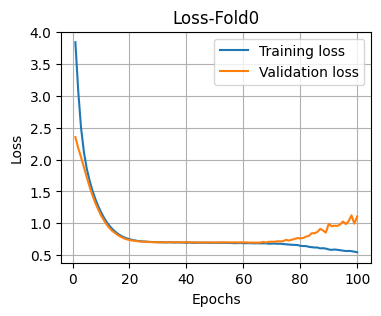

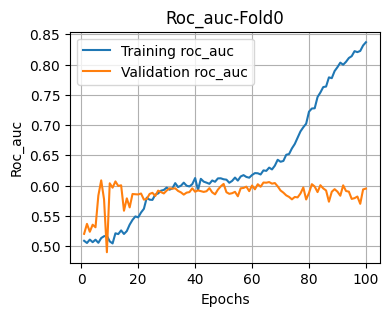

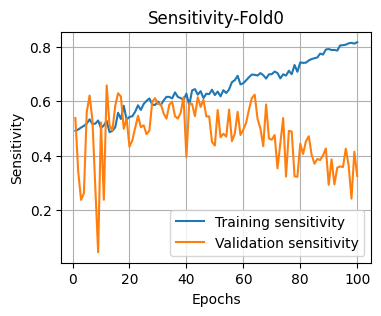

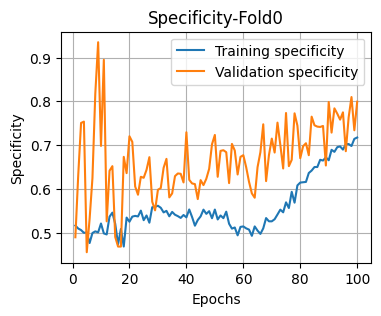

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.7 Dropout 0.9 Reg_L2 0.01

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,766,554,31,51,0.621951,0.580303,0.084298,0.148472,0.081899,0.609211



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,766.0,554.0,31.0,51.0,0.621951,0.580303,0.084298,0.148472,0.081899,0.609211
mean,766.0,554.0,31.0,51.0,0.622000,0.580300,0.084300,0.148500,0.081900,0.609200
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.9; Reg_L2=1e-4

In [ ]:
Dropout=0.9
Reg_L2=1e-4

EPOCHS       = 100
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step
Epoch 1/100
170/170 - 9s - 56ms/step - loss: 2.1732 - roc_auc: 0.5104 - sensitivity: 0.5278 - specificity: 0.4761 - val_loss: 0.9020 - val_roc_auc: 0.4281 - val_sensitivity: 0.7826 - val_specificity: 0.1333
Epoch 2/100
170/170 - 3s - 20ms/step - loss: 1.4830 - roc_auc: 0.5021 - sensitivity: 0.5400 - specificity: 0.4683 - val_loss: 0.7613 - val_roc_auc: 0.4480 - val_sensitivity: 0.9220 - val_specificity: 0.0561
Epoch 3/100
170/170 - 3s - 20ms/step - loss: 1.0593 - roc_auc: 0.5069 - sensitivity: 0.5289 - specificity: 0.4748 - val_loss: 0.7262 - val_roc_auc: 0.4695 - val_sensitivity: 0.9212 - val_specificity: 0.0417
Epoch 4/100
170/170 - 3s - 20ms/step - loss: 0.8570 - roc_auc: 0.5065 - sensitivity: 0.5173 - specificity: 0.4957 - val_loss: 0.7162 - val_roc_auc: 0.4799 - val_sensitivity: 0.9871 - val_specificity: 0.0136
Epoch 5/100
170/170 - 4s - 21ms/step - loss: 0.7683 - roc_auc: 0.5013 - sensitivity: 0.4700 - specificity: 0.5326 

,Metric,Value
0,True Negatives,784.000000
1,False Positives,536.000000
2,False Negatives,36.000000
3,True Positives,46.000000
4,Sensitivity,0.560976
5,Specificity,0.593939
6,Precision,0.079038
7,F1 Score,0.138554
8,PR AUC,0.072437
9,ROC AUC,0.582899


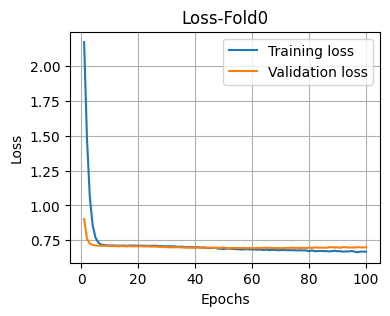

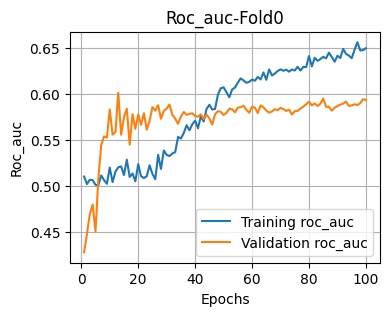

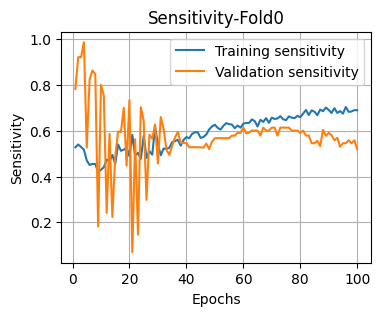

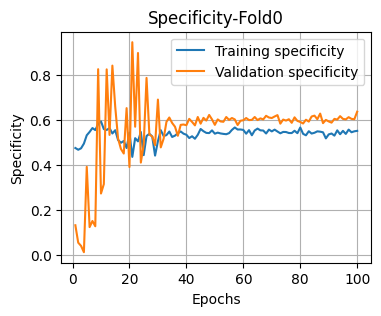

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.7 Dropout 0.9 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,784,536,36,46,0.560976,0.593939,0.079038,0.138554,0.072437,0.582899



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,784.0,536.0,36.0,46.0,0.560976,0.593939,0.079038,0.138554,0.072437,0.582899
mean,784.0,536.0,36.0,46.0,0.561000,0.593900,0.079000,0.138600,0.072400,0.582900
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


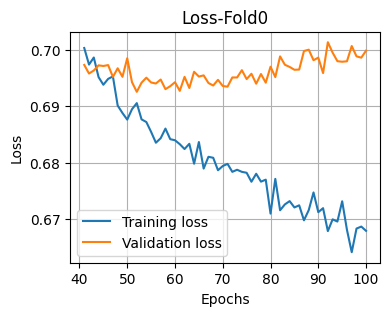

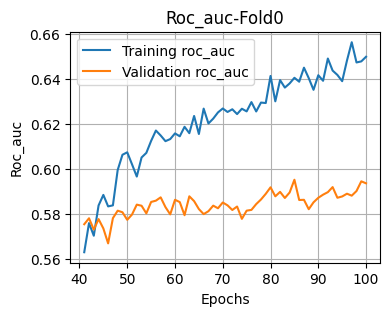

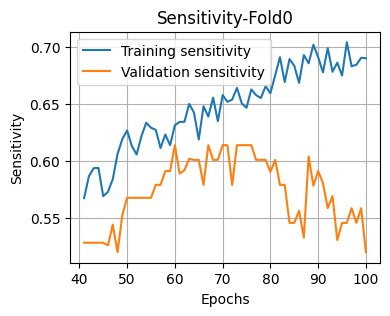

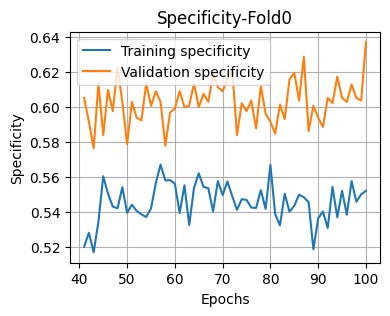

In [ ]:
history = history_record[0]
plot_learning_curves(history, name=f'Fold{fold}',
                     metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
                     init_index=40)


## Mask 0.8

In [ ]:
MASK_RATE = 0.8

INIT_LR=5e-4             #	1e-3 ~ 3e-4
WEIGHT_DECAY=1e-2

BATCH_SIZE   = 64

### Dropout 0.0; Reg_L2=1e-2


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step
Epoch 1/300
170/170 - 10s - 58ms/step - loss: 2.1134 - roc_auc: 0.6305 - sensitivity: 0.6333 - specificity: 0.5760 - val_loss: 1.9298 - val_roc_auc: 0.5109 - val_sensitivity: 0.2795 - val_specificity: 0.7379
Epoch 2/300
170/170 - 3s - 20ms/step - loss: 1.5526 - roc_auc: 0.7304 - sensitivity: 0.6832 - specificity: 0.6483 - val_loss: 1.6020 - val_roc_auc: 0.5521 - val_sensitivity: 0.1917 - val_specificity: 0.8485
Epoch 3/300
170/170 - 3s - 19ms/step - loss: 1.2379 - roc_auc: 0.7780 - sensitivity: 0.7195 - specificity: 0.6858 - val_loss: 1.4226 - val_roc_auc: 0.5896 - val_sensitivity: 0.1939 - val_specificity: 0.8614
Epoch 4/300
170/170 - 4s - 21ms/step - loss: 1.0419 - roc_auc: 0.8185 - sensitivity: 0.7594 - specificity: 0.7141 - val_loss: 1.2733 - val_roc_auc: 0.5966 - val_sensitivity: 0.3652 - val_specificity: 0.7402
Epoch 5/300
170/170 - 4s - 21ms/step - loss: 0.9100 - roc_auc: 0.8516 - sensitivity: 0.8015 - specificity: 0.7313

,Metric,Value
0,True Negatives,977.000000
1,False Positives,343.000000
2,False Negatives,52.000000
3,True Positives,30.000000
4,Sensitivity,0.365854
5,Specificity,0.740152
6,Precision,0.080429
7,F1 Score,0.131868
8,PR AUC,0.087435
9,ROC AUC,0.596221


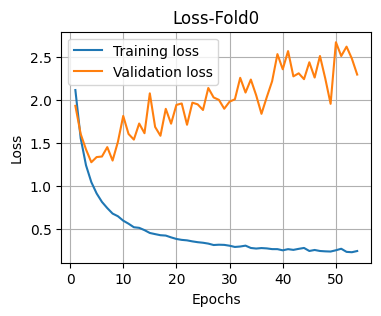

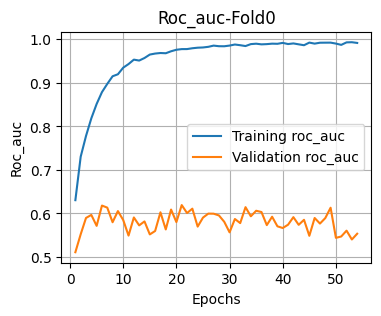

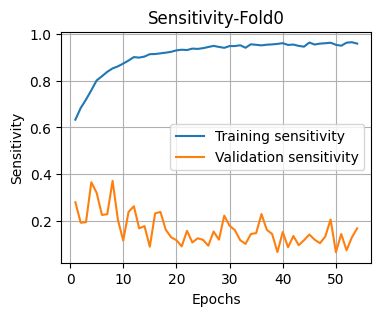

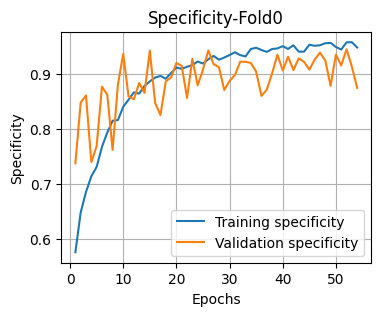

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=0.0,
        reg_l2=1e-2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=300,
        patience_es=50,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.8 Dropout 0.9 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,977,343,52,30,0.365854,0.740152,0.080429,0.131868,0.087435,0.596221



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,977.0,343.0,52.0,30.0,0.365854,0.740152,0.080429,0.131868,0.087435,0.596221
mean,977.0,343.0,52.0,30.0,0.365900,0.740200,0.080400,0.131900,0.087400,0.596200
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.0; Reg_L2=1e-4


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step
Epoch 1/300
170/170 - 9s - 55ms/step - loss: 0.6963 - roc_auc: 0.6361 - sensitivity: 0.6056 - specificity: 0.5897 - val_loss: 0.7566 - val_roc_auc: 0.5249 - val_sensitivity: 0.4303 - val_specificity: 0.6205
Epoch 2/300
170/170 - 3s - 20ms/step - loss: 0.6106 - roc_auc: 0.7450 - sensitivity: 0.6958 - specificity: 0.6605 - val_loss: 0.7857 - val_roc_auc: 0.5610 - val_sensitivity: 0.3235 - val_specificity: 0.7326
Epoch 3/300
170/170 - 3s - 20ms/step - loss: 0.5587 - roc_auc: 0.8011 - sensitivity: 0.7573 - specificity: 0.7017 - val_loss: 0.8489 - val_roc_auc: 0.6082 - val_sensitivity: 0.2379 - val_specificity: 0.8432
Epoch 4/300
170/170 - 3s - 21ms/step - loss: 0.5052 - roc_auc: 0.8455 - sensitivity: 0.7923 - specificity: 0.7411 - val_loss: 0.8451 - val_roc_auc: 0.6105 - val_sensitivity: 0.3068 - val_specificity: 0.7856
Epoch 5/300
170/170 - 3s - 20ms/step - loss: 0.4670 - roc_auc: 0.8711 - sensitivity: 0.8120 - specificity: 0.7622 

,Metric,Value
0,True Negatives,819.000000
1,False Positives,501.000000
2,False Negatives,45.000000
3,True Positives,37.000000
4,Sensitivity,0.451220
5,Specificity,0.620455
6,Precision,0.068773
7,F1 Score,0.119355
8,PR AUC,0.061373
9,ROC AUC,0.533832


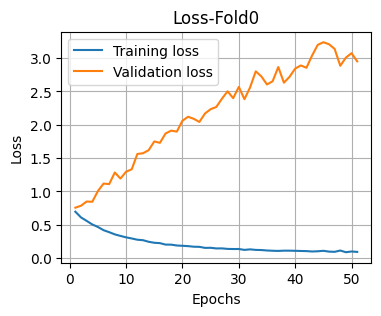

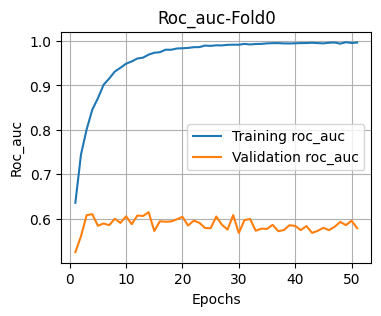

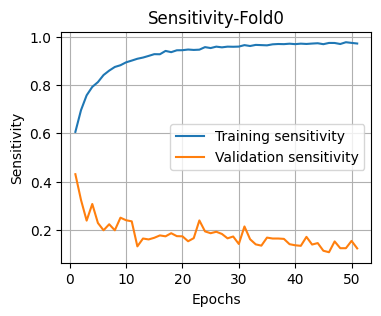

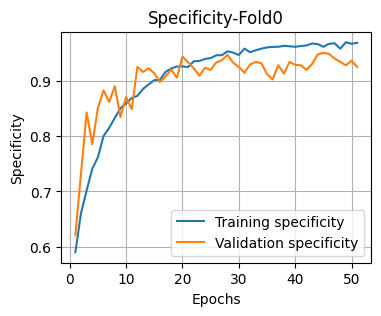

In [ ]:
Dropout=0.0
Reg_L2=1e-4

from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=300,
        patience_es=50,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.8 Dropout 0.0 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,819,501,45,37,0.45122,0.620455,0.068773,0.119355,0.061373,0.533832



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,819.0,501.0,45.0,37.0,0.45122,0.620455,0.068773,0.119355,0.061373,0.533832
mean,819.0,501.0,45.0,37.0,0.45120,0.620500,0.068800,0.119400,0.061400,0.533800
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.5; Reg_L2=1e-2

In [ ]:
Dropout=0.5
Reg_L2=1e-2

EPOCHS       = 30
PATIENCE_ES  = 30


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step
Epoch 1/30
170/170 - 9s - 54ms/step - loss: 2.4905 - roc_auc: 0.5107 - sensitivity: 0.5154 - specificity: 0.5067 - val_loss: 2.0348 - val_roc_auc: 0.5959 - val_sensitivity: 0.3705 - val_specificity: 0.7212
Epoch 2/30
170/170 - 3s - 19ms/step - loss: 1.9188 - roc_auc: 0.5498 - sensitivity: 0.5232 - specificity: 0.5443 - val_loss: 1.6844 - val_roc_auc: 0.5962 - val_sensitivity: 0.6265 - val_specificity: 0.5265
Epoch 3/30
170/170 - 3s - 19ms/step - loss: 1.5670 - roc_auc: 0.5656 - sensitivity: 0.5424 - specificity: 0.5417 - val_loss: 1.4092 - val_roc_auc: 0.5908 - val_sensitivity: 0.6076 - val_specificity: 0.5030
Epoch 4/30
170/170 - 3s - 20ms/step - loss: 1.3141 - roc_auc: 0.5704 - sensitivity: 0.5548 - specificity: 0.5448 - val_loss: 1.2002 - val_roc_auc: 0.6017 - val_sensitivity: 0.6129 - val_specificity: 0.5447
Epoch 5/30
170/170 - 3s - 20ms/step - loss: 1.1290 - roc_auc: 0.5789 - sensitivity: 0.5572 - specificity: 0.5526 - val

,Metric,Value
0,True Negatives,696.000000
1,False Positives,624.000000
2,False Negatives,31.000000
3,True Positives,51.000000
4,Sensitivity,0.621951
5,Specificity,0.527273
6,Precision,0.075556
7,F1 Score,0.134742
8,PR AUC,0.076683
9,ROC AUC,0.608518


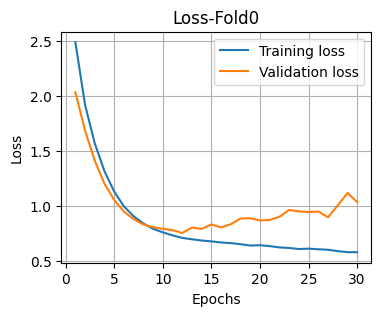

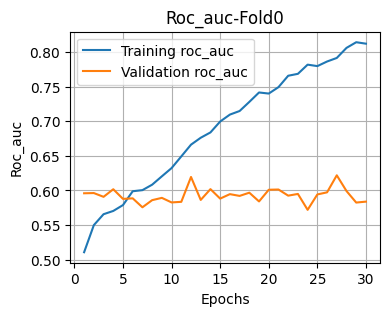

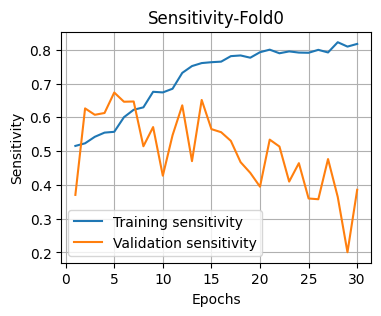

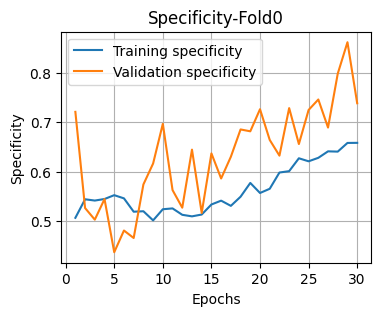

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.8 Dropout 0.5 Reg_L2 0.01

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,696,624,31,51,0.621951,0.527273,0.075556,0.134742,0.076683,0.608518



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,696.0,624.0,31.0,51.0,0.621951,0.527273,0.075556,0.134742,0.076683,0.608518
mean,696.0,624.0,31.0,51.0,0.622000,0.527300,0.075600,0.134700,0.076700,0.608500
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.5; Reg_L2=1e-4

In [ ]:
Dropout=0.5
Reg_L2=1e-4

EPOCHS       = 30
PATIENCE_ES  = 30


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step
Epoch 1/30
170/170 - 9s - 52ms/step - loss: 1.0269 - roc_auc: 0.5354 - sensitivity: 0.5116 - specificity: 0.5396 - val_loss: 0.7416 - val_roc_auc: 0.5930 - val_sensitivity: 0.1402 - val_specificity: 0.8788
Epoch 2/30
170/170 - 3s - 18ms/step - loss: 0.7979 - roc_auc: 0.5454 - sensitivity: 0.5175 - specificity: 0.5378 - val_loss: 0.7027 - val_roc_auc: 0.6149 - val_sensitivity: 0.4364 - val_specificity: 0.7364
Epoch 3/30
170/170 - 3s - 18ms/step - loss: 0.7399 - roc_auc: 0.5613 - sensitivity: 0.5411 - specificity: 0.5396 - val_loss: 0.7026 - val_roc_auc: 0.6057 - val_sensitivity: 0.5144 - val_specificity: 0.6924
Epoch 4/30
170/170 - 3s - 18ms/step - loss: 0.7230 - roc_auc: 0.5637 - sensitivity: 0.5552 - specificity: 0.5391 - val_loss: 0.7053 - val_roc_auc: 0.6050 - val_sensitivity: 0.3341 - val_specificity: 0.7924
Epoch 5/30
170/170 - 3s - 17ms/step - loss: 0.7056 - roc_auc: 0.5876 - sensitivity: 0.5700 - specificity: 0.5583 - val

,Metric,Value
0,True Negatives,914.000000
1,False Positives,406.000000
2,False Negatives,41.000000
3,True Positives,41.000000
4,Sensitivity,0.500000
5,Specificity,0.692424
6,Precision,0.091723
7,F1 Score,0.155009
8,PR AUC,0.074227
9,ROC AUC,0.598457


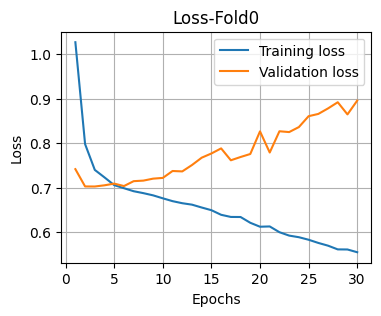

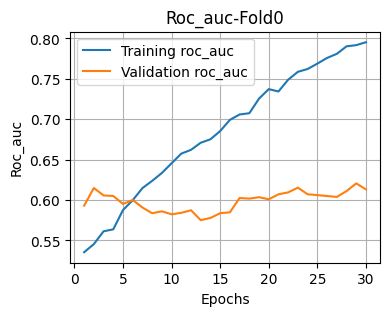

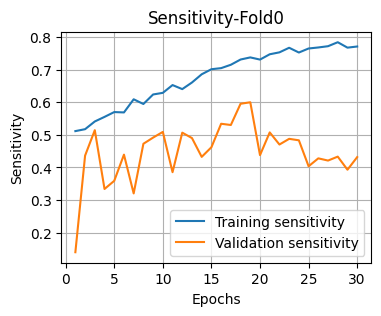

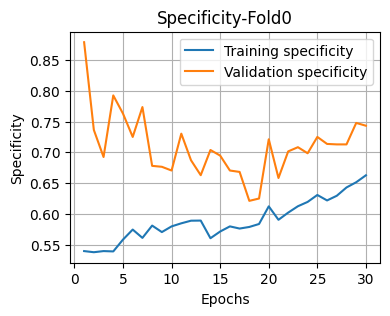

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.8 Dropout 0.5 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,914,406,41,41,0.5,0.692424,0.091723,0.155009,0.074227,0.598457



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,914.0,406.0,41.0,41.0,0.5,0.692424,0.091723,0.155009,0.074227,0.598457
mean,914.0,406.0,41.0,41.0,0.5,0.692400,0.091700,0.155000,0.074200,0.598500
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.7; Reg_L2=1e-2

In [ ]:
Dropout=0.7
Reg_L2=1e-2

EPOCHS       = 50
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step
Epoch 1/50
170/170 - 10s - 57ms/step - loss: 2.6276 - roc_auc: 0.5161 - sensitivity: 0.5213 - specificity: 0.5012 - val_loss: 2.0932 - val_roc_auc: 0.5557 - val_sensitivity: 0.6720 - val_specificity: 0.4250
Epoch 2/50
170/170 - 4s - 21ms/step - loss: 2.0403 - roc_auc: 0.5259 - sensitivity: 0.5221 - specificity: 0.5099 - val_loss: 1.7727 - val_roc_auc: 0.5445 - val_sensitivity: 0.2568 - val_specificity: 0.7621
Epoch 3/50
170/170 - 4s - 21ms/step - loss: 1.6657 - roc_auc: 0.5374 - sensitivity: 0.5321 - specificity: 0.5225 - val_loss: 1.4948 - val_roc_auc: 0.5549 - val_sensitivity: 0.3220 - val_specificity: 0.7598
Epoch 4/50
170/170 - 3s - 19ms/step - loss: 1.4007 - roc_auc: 0.5378 - sensitivity: 0.5284 - specificity: 0.5186 - val_loss: 1.2772 - val_roc_auc: 0.5638 - val_sensitivity: 0.2765 - val_specificity: 0.7826
Epoch 5/50
170/170 - 3s - 20ms/step - loss: 1.1997 - roc_auc: 0.5520 - sensitivity: 0.5310 - specificity: 0.5383 - va

,Metric,Value
0,True Negatives,839.000000
1,False Positives,481.000000
2,False Negatives,39.000000
3,True Positives,43.000000
4,Sensitivity,0.524390
5,Specificity,0.635606
6,Precision,0.082061
7,F1 Score,0.141914
8,PR AUC,0.074040
9,ROC AUC,0.605294


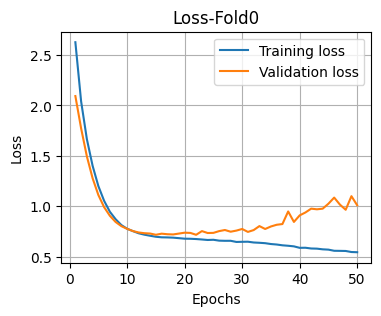

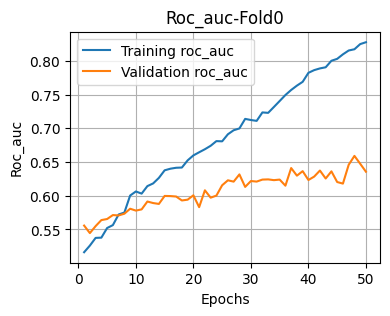

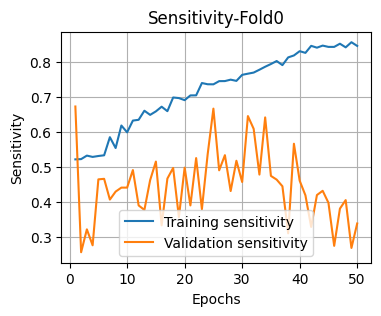

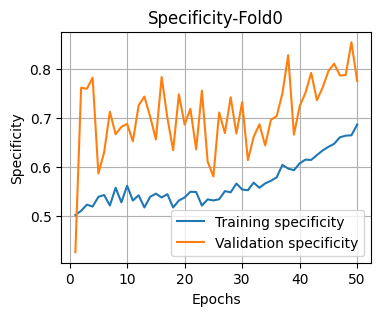

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.8 Dropout 0.7 Reg_L2 0.01

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,839,481,39,43,0.52439,0.635606,0.082061,0.141914,0.07404,0.605294



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,839.0,481.0,39.0,43.0,0.52439,0.635606,0.082061,0.141914,0.07404,0.605294
mean,839.0,481.0,39.0,43.0,0.52440,0.635600,0.082100,0.141900,0.07400,0.605300
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.7; Reg_L2=1e-4

In [ ]:
Dropout=0.7
Reg_L2=1e-4

EPOCHS       = 50
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step
Epoch 1/50
170/170 - 10s - 57ms/step - loss: 1.2904 - roc_auc: 0.5198 - sensitivity: 0.5162 - specificity: 0.5114 - val_loss: 0.7271 - val_roc_auc: 0.5423 - val_sensitivity: 0.4788 - val_specificity: 0.5689
Epoch 2/50
170/170 - 3s - 19ms/step - loss: 0.9097 - roc_auc: 0.5249 - sensitivity: 0.5391 - specificity: 0.4990 - val_loss: 0.7034 - val_roc_auc: 0.5552 - val_sensitivity: 0.5689 - val_specificity: 0.4712
Epoch 3/50
170/170 - 3s - 21ms/step - loss: 0.7968 - roc_auc: 0.5195 - sensitivity: 0.5369 - specificity: 0.4901 - val_loss: 0.7046 - val_roc_auc: 0.5481 - val_sensitivity: 0.4515 - val_specificity: 0.6076
Epoch 4/50
170/170 - 3s - 21ms/step - loss: 0.7434 - roc_auc: 0.5385 - sensitivity: 0.5343 - specificity: 0.5269 - val_loss: 0.7051 - val_roc_auc: 0.5412 - val_sensitivity: 0.5606 - val_specificity: 0.4871
Epoch 5/50
170/170 - 3s - 20ms/step - loss: 0.7275 - roc_auc: 0.5405 - sensitivity: 0.5432 - specificity: 0.5134 - va

,Metric,Value
0,True Negatives,731.000000
1,False Positives,589.000000
2,False Negatives,35.000000
3,True Positives,47.000000
4,Sensitivity,0.573171
5,Specificity,0.553788
6,Precision,0.073899
7,F1 Score,0.130919
8,PR AUC,0.072626
9,ROC AUC,0.592369


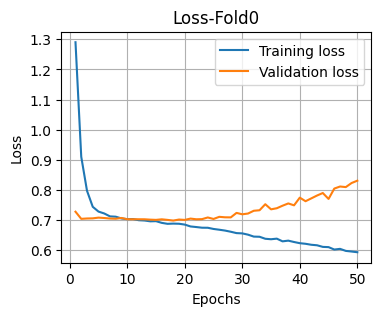

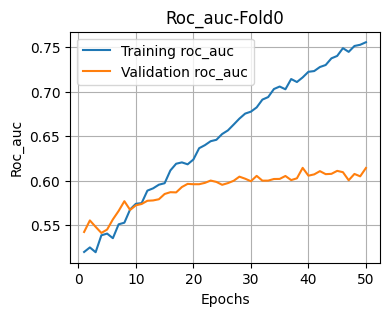

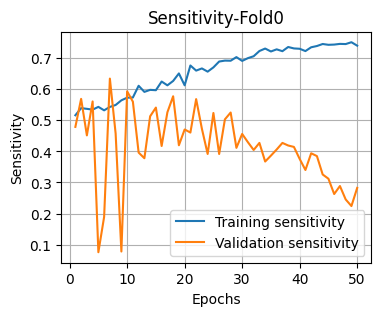

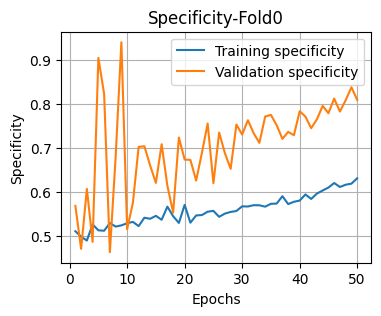

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.8 Dropout 0.7 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,731,589,35,47,0.573171,0.553788,0.073899,0.130919,0.072626,0.592369



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,731.0,589.0,35.0,47.0,0.573171,0.553788,0.073899,0.130919,0.072626,0.592369
mean,731.0,589.0,35.0,47.0,0.573200,0.553800,0.073900,0.130900,0.072600,0.592400
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.9; Reg_L2=1e-2

In [ ]:
Dropout=0.9
Reg_L2=1e-2

EPOCHS       = 100
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step
Epoch 1/100
170/170 - 10s - 57ms/step - loss: 3.5155 - roc_auc: 0.5020 - sensitivity: 0.5176 - specificity: 0.4938 - val_loss: 2.3144 - val_roc_auc: 0.5740 - val_sensitivity: 0.7295 - val_specificity: 0.3939
Epoch 2/100
170/170 - 4s - 21ms/step - loss: 2.7360 - roc_auc: 0.5012 - sensitivity: 0.5250 - specificity: 0.4864 - val_loss: 2.1018 - val_roc_auc: 0.5774 - val_sensitivity: 0.5455 - val_specificity: 0.5674
Epoch 3/100
170/170 - 3s - 20ms/step - loss: 2.2449 - roc_auc: 0.5052 - sensitivity: 0.5138 - specificity: 0.4958 - val_loss: 1.9269 - val_roc_auc: 0.5896 - val_sensitivity: 0.6629 - val_specificity: 0.4629
Epoch 4/100
170/170 - 3s - 20ms/step - loss: 1.9207 - roc_auc: 0.5145 - sensitivity: 0.4957 - specificity: 0.5165 - val_loss: 1.7566 - val_roc_auc: 0.5666 - val_sensitivity: 0.6576 - val_specificity: 0.4197
Epoch 5/100
170/170 - 3s - 20ms/step - loss: 1.6983 - roc_auc: 0.5045 - sensitivity: 0.4970 - specificity: 0.5021

,Metric,Value
0,True Negatives,872.000000
1,False Positives,448.000000
2,False Negatives,35.000000
3,True Positives,47.000000
4,Sensitivity,0.573171
5,Specificity,0.660606
6,Precision,0.094949
7,F1 Score,0.162912
8,PR AUC,0.079861
9,ROC AUC,0.609350


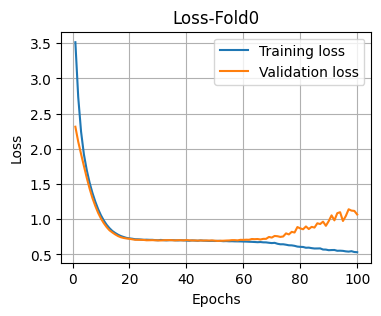

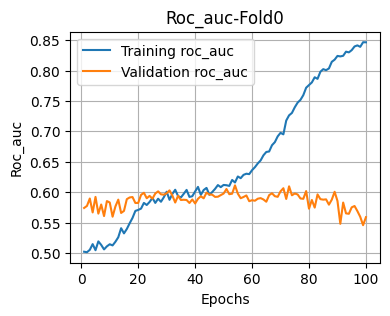

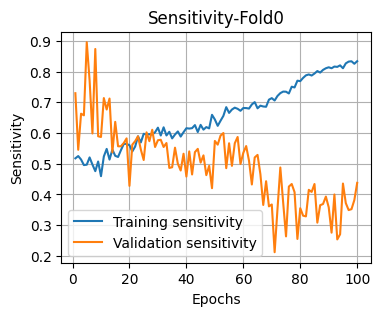

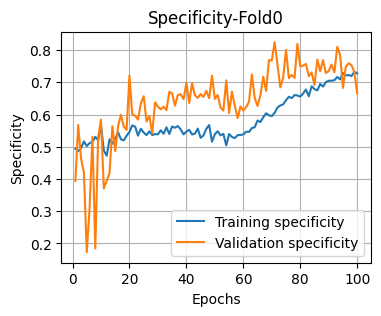

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.8 Dropout 0.9 Reg_L2 0.01

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,872,448,35,47,0.573171,0.660606,0.094949,0.162912,0.079861,0.60935



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,872.0,448.0,35.0,47.0,0.573171,0.660606,0.094949,0.162912,0.079861,0.60935
mean,872.0,448.0,35.0,47.0,0.573200,0.660600,0.094900,0.162900,0.079900,0.60930
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.9; Reg_L2=1e-4

In [ ]:
Dropout=0.9
Reg_L2=1e-4

EPOCHS       = 100
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step
Epoch 1/100
170/170 - 9s - 55ms/step - loss: 1.8618 - roc_auc: 0.5011 - sensitivity: 0.4995 - specificity: 0.4955 - val_loss: 0.7045 - val_roc_auc: 0.6124 - val_sensitivity: 0.6795 - val_specificity: 0.5136
Epoch 2/100
170/170 - 3s - 20ms/step - loss: 1.2234 - roc_auc: 0.5031 - sensitivity: 0.5079 - specificity: 0.4916 - val_loss: 0.6946 - val_roc_auc: 0.6310 - val_sensitivity: 0.7682 - val_specificity: 0.4462
Epoch 3/100
170/170 - 3s - 20ms/step - loss: 0.9212 - roc_auc: 0.5053 - sensitivity: 0.4984 - specificity: 0.5060 - val_loss: 0.7002 - val_roc_auc: 0.6350 - val_sensitivity: 0.7205 - val_specificity: 0.4894
Epoch 4/100
170/170 - 3s - 20ms/step - loss: 0.7900 - roc_auc: 0.5054 - sensitivity: 0.5082 - specificity: 0.4971 - val_loss: 0.7061 - val_roc_auc: 0.6083 - val_sensitivity: 0.7530 - val_specificity: 0.3992
Epoch 5/100
170/170 - 3s - 19ms/step - loss: 0.7393 - roc_auc: 0.5092 - sensitivity: 0.5103 - specificity: 0.5075 

,Metric,Value
0,True Negatives,862.000000
1,False Positives,458.000000
2,False Negatives,39.000000
3,True Positives,43.000000
4,Sensitivity,0.524390
5,Specificity,0.653030
6,Precision,0.085828
7,F1 Score,0.147513
8,PR AUC,0.071991
9,ROC AUC,0.591547


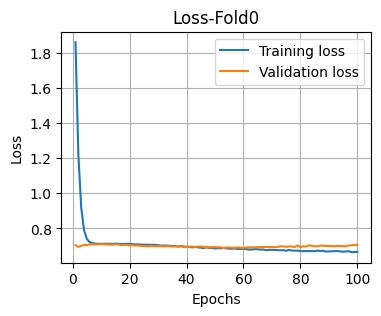

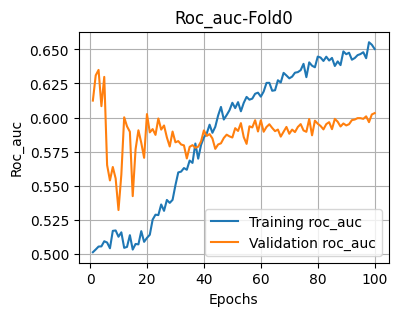

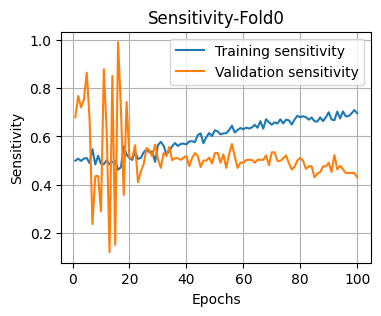

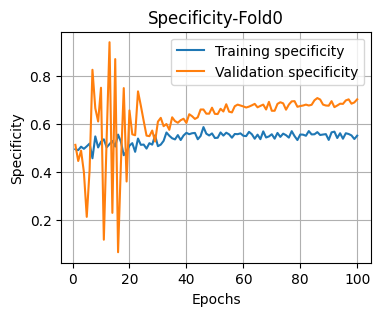

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.8 Dropout 0.9 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,862,458,39,43,0.52439,0.65303,0.085828,0.147513,0.071991,0.591547



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,862.0,458.0,39.0,43.0,0.52439,0.65303,0.085828,0.147513,0.071991,0.591547
mean,862.0,458.0,39.0,43.0,0.52440,0.65300,0.085800,0.147500,0.072000,0.591500
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


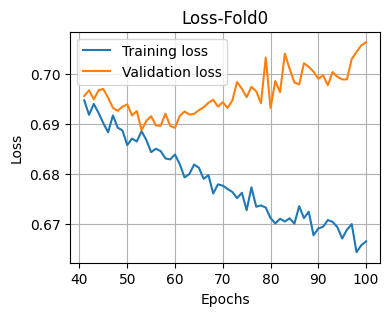

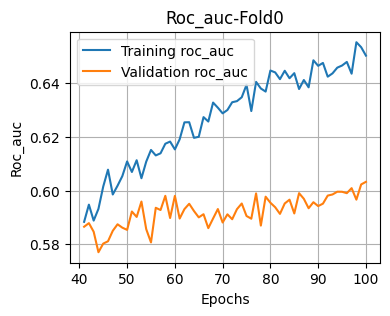

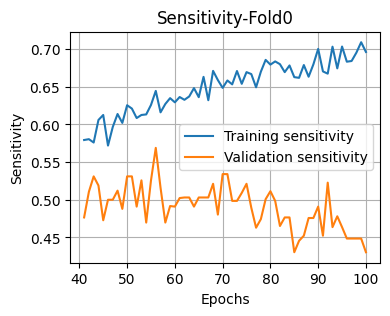

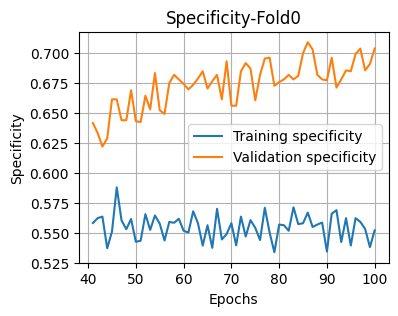

In [ ]:
history = history_record[0]
plot_learning_curves(history, name=f'Fold{fold}',
                     metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
                     init_index=40)


## Mask 0.9

In [ ]:
MASK_RATE = 0.9

INIT_LR=5e-4             #	1e-3 ~ 3e-4
WEIGHT_DECAY=1e-2

BATCH_SIZE   = 64

### Dropout 0.0; Reg_L2=1e-2


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step
Epoch 1/100
170/170 - 9s - 53ms/step - loss: 2.1293 - roc_auc: 0.6368 - sensitivity: 0.6224 - specificity: 0.5858 - val_loss: 1.9519 - val_roc_auc: 0.5164 - val_sensitivity: 0.3591 - val_specificity: 0.6477
Epoch 2/100
170/170 - 3s - 20ms/step - loss: 1.5808 - roc_auc: 0.7322 - sensitivity: 0.6967 - specificity: 0.6442 - val_loss: 1.6005 - val_roc_auc: 0.5678 - val_sensitivity: 0.3523 - val_specificity: 0.7348
Epoch 3/100
170/170 - 3s - 19ms/step - loss: 1.2475 - roc_auc: 0.7884 - sensitivity: 0.7439 - specificity: 0.6855 - val_loss: 1.3927 - val_roc_auc: 0.5885 - val_sensitivity: 0.3439 - val_specificity: 0.7417
Epoch 4/100
170/170 - 3s - 20ms/step - loss: 1.0433 - roc_auc: 0.8273 - sensitivity: 0.7777 - specificity: 0.7206 - val_loss: 1.4300 - val_roc_auc: 0.6125 - val_sensitivity: 0.2076 - val_specificity: 0.8614
Epoch 5/100
170/170 - 3s - 20ms/step - loss: 0.8964 - roc_auc: 0.8678 - sensitivity: 0.8170 - specificity: 0.7553 

,Metric,Value
0,True Negatives,979.000000
1,False Positives,341.000000
2,False Negatives,55.000000
3,True Positives,27.000000
4,Sensitivity,0.329268
5,Specificity,0.741667
6,Precision,0.073370
7,F1 Score,0.120000
8,PR AUC,0.066704
9,ROC AUC,0.576183


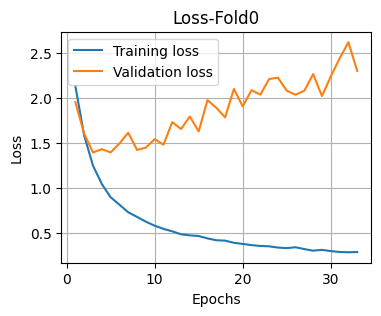

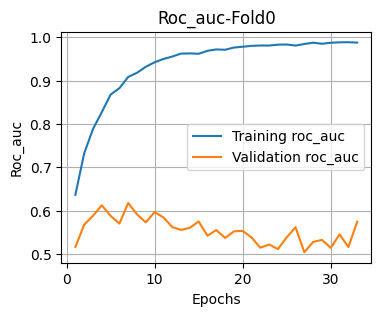

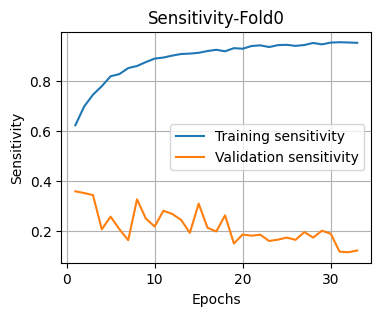

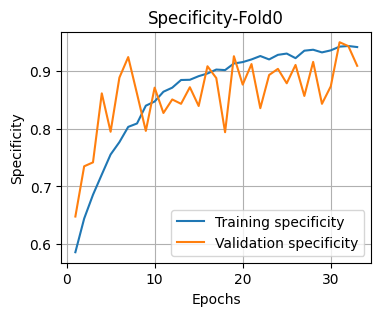

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=0.0,
        reg_l2=1e-2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=100,
        patience_es=30,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.9 Dropout 0.9 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,979,341,55,27,0.329268,0.741667,0.07337,0.12,0.066704,0.576183



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,979.0,341.0,55.0,27.0,0.329268,0.741667,0.07337,0.12,0.066704,0.576183
mean,979.0,341.0,55.0,27.0,0.329300,0.741700,0.07340,0.12,0.066700,0.576200
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.0; Reg_L2=1e-4


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step
Epoch 1/100
170/170 - 9s - 56ms/step - loss: 0.6895 - roc_auc: 0.6373 - sensitivity: 0.6291 - specificity: 0.5712 - val_loss: 0.7847 - val_roc_auc: 0.5431 - val_sensitivity: 0.2894 - val_specificity: 0.7439
Epoch 2/100
170/170 - 3s - 19ms/step - loss: 0.6101 - roc_auc: 0.7457 - sensitivity: 0.7065 - specificity: 0.6468 - val_loss: 0.8458 - val_roc_auc: 0.5499 - val_sensitivity: 0.3485 - val_specificity: 0.7068
Epoch 3/100
170/170 - 3s - 18ms/step - loss: 0.5575 - roc_auc: 0.8000 - sensitivity: 0.7586 - specificity: 0.6818 - val_loss: 0.9800 - val_roc_auc: 0.5656 - val_sensitivity: 0.2159 - val_specificity: 0.8235
Epoch 4/100
170/170 - 3s - 19ms/step - loss: 0.5013 - roc_auc: 0.8484 - sensitivity: 0.7960 - specificity: 0.7387 - val_loss: 1.0000 - val_roc_auc: 0.5711 - val_sensitivity: 0.2106 - val_specificity: 0.8356
Epoch 5/100
170/170 - 3s - 19ms/step - loss: 0.4558 - roc_auc: 0.8787 - sensitivity: 0.8198 - specificity: 0.7729 

,Metric,Value
0,True Negatives,982.000000
1,False Positives,338.000000
2,False Negatives,59.000000
3,True Positives,23.000000
4,Sensitivity,0.280488
5,Specificity,0.743939
6,Precision,0.063712
7,F1 Score,0.103837
8,PR AUC,0.062562
9,ROC AUC,0.543570


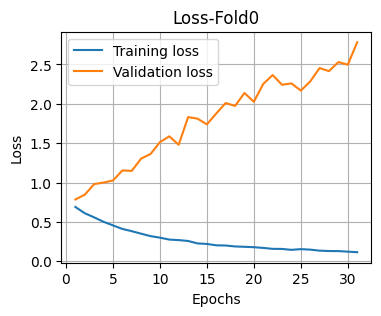

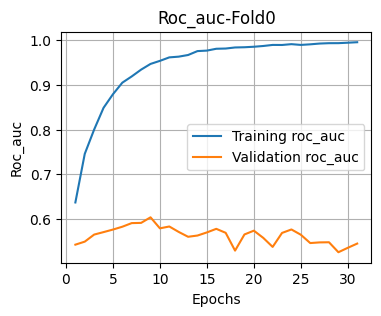

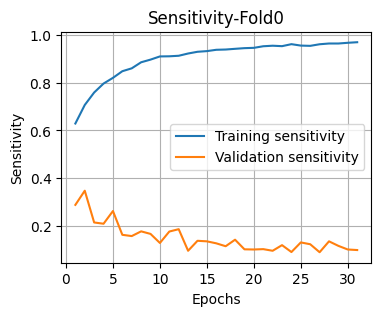

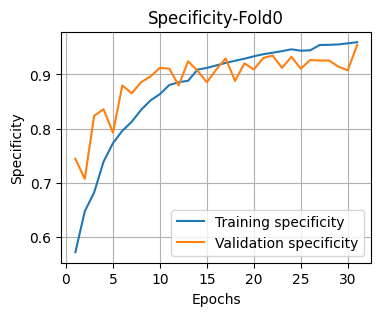

In [ ]:
Dropout=0.0
Reg_L2=1e-4

from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=100,
        patience_es=30,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.9 Dropout 0.0 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,982,338,59,23,0.280488,0.743939,0.063712,0.103837,0.062562,0.54357



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,982.0,338.0,59.0,23.0,0.280488,0.743939,0.063712,0.103837,0.062562,0.54357
mean,982.0,338.0,59.0,23.0,0.280500,0.743900,0.063700,0.103800,0.062600,0.54360
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.5; Reg_L2=1e-2

In [ ]:
Dropout=0.5
Reg_L2=1e-2

EPOCHS       = 30
PATIENCE_ES  = 30


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step
Epoch 1/30
170/170 - 9s - 55ms/step - loss: 2.4598 - roc_auc: 0.5276 - sensitivity: 0.5184 - specificity: 0.5202 - val_loss: 2.0485 - val_roc_auc: 0.5566 - val_sensitivity: 0.3076 - val_specificity: 0.7568
Epoch 2/30
170/170 - 3s - 19ms/step - loss: 1.9019 - roc_auc: 0.5563 - sensitivity: 0.5372 - specificity: 0.5398 - val_loss: 1.6691 - val_roc_auc: 0.5988 - val_sensitivity: 0.4553 - val_specificity: 0.7121
Epoch 3/30
170/170 - 3s - 20ms/step - loss: 1.5372 - roc_auc: 0.5788 - sensitivity: 0.5542 - specificity: 0.5542 - val_loss: 1.3790 - val_roc_auc: 0.6156 - val_sensitivity: 0.6394 - val_specificity: 0.5114
Epoch 4/30
170/170 - 3s - 19ms/step - loss: 1.2850 - roc_auc: 0.5801 - sensitivity: 0.5666 - specificity: 0.5419 - val_loss: 1.1770 - val_roc_auc: 0.5900 - val_sensitivity: 0.6045 - val_specificity: 0.4939
Epoch 5/30
170/170 - 3s - 20ms/step - loss: 1.1010 - roc_auc: 0.5934 - sensitivity: 0.5903 - specificity: 0.5391 - val

,Metric,Value
0,True Negatives,788.000000
1,False Positives,532.000000
2,False Negatives,36.000000
3,True Positives,46.000000
4,Sensitivity,0.560976
5,Specificity,0.596970
6,Precision,0.079585
7,F1 Score,0.139394
8,PR AUC,0.084389
9,ROC AUC,0.596887


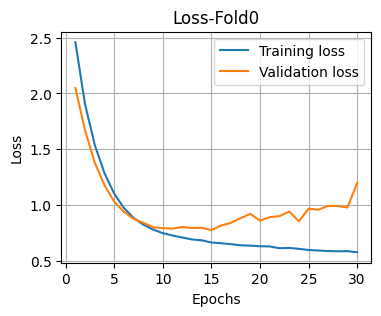

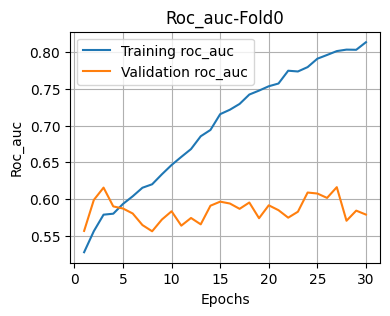

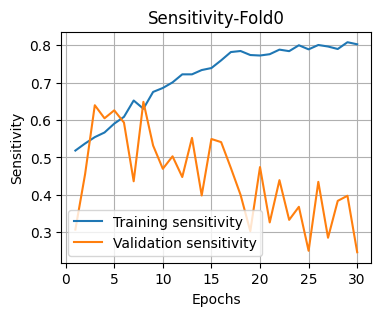

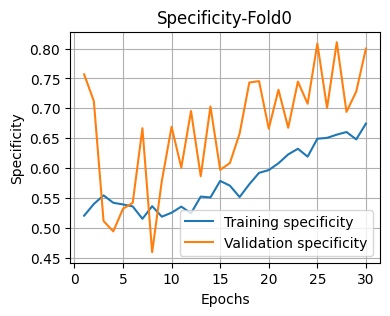

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.9 Dropout 0.5 Reg_L2 0.01

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,788,532,36,46,0.560976,0.59697,0.079585,0.139394,0.084389,0.596887



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,788.0,532.0,36.0,46.0,0.560976,0.59697,0.079585,0.139394,0.084389,0.596887
mean,788.0,532.0,36.0,46.0,0.561000,0.59700,0.079600,0.139400,0.084400,0.596900
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.5; Reg_L2=1e-4

In [ ]:
Dropout=0.5
Reg_L2=1e-4

EPOCHS       = 30
PATIENCE_ES  = 30


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step
Epoch 1/30
170/170 - 9s - 54ms/step - loss: 0.9526 - roc_auc: 0.5334 - sensitivity: 0.5398 - specificity: 0.5091 - val_loss: 0.7184 - val_roc_auc: 0.5953 - val_sensitivity: 0.6636 - val_specificity: 0.4386
Epoch 2/30
170/170 - 3s - 19ms/step - loss: 0.7643 - roc_auc: 0.5591 - sensitivity: 0.5574 - specificity: 0.5245 - val_loss: 0.7015 - val_roc_auc: 0.5999 - val_sensitivity: 0.5409 - val_specificity: 0.6106
Epoch 3/30
170/170 - 3s - 19ms/step - loss: 0.7259 - roc_auc: 0.5631 - sensitivity: 0.5681 - specificity: 0.5260 - val_loss: 0.6962 - val_roc_auc: 0.6032 - val_sensitivity: 0.6432 - val_specificity: 0.5432
Epoch 4/30
170/170 - 3s - 19ms/step - loss: 0.7072 - roc_auc: 0.5829 - sensitivity: 0.5825 - specificity: 0.5347 - val_loss: 0.6998 - val_roc_auc: 0.6067 - val_sensitivity: 0.4189 - val_specificity: 0.7023
Epoch 5/30
170/170 - 3s - 20ms/step - loss: 0.7031 - roc_auc: 0.5841 - sensitivity: 0.5755 - specificity: 0.5311 - val

,Metric,Value
0,True Negatives,717.000000
1,False Positives,603.000000
2,False Negatives,29.000000
3,True Positives,53.000000
4,Sensitivity,0.646341
5,Specificity,0.543182
6,Precision,0.080793
7,F1 Score,0.143631
8,PR AUC,0.079847
9,ROC AUC,0.605091


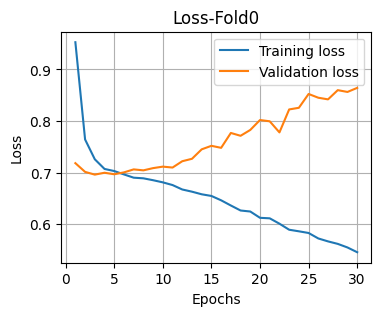

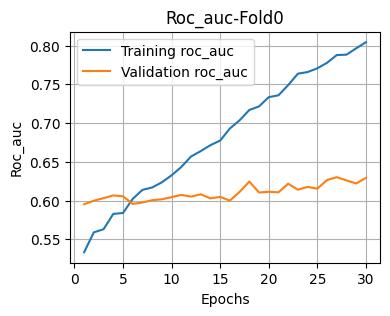

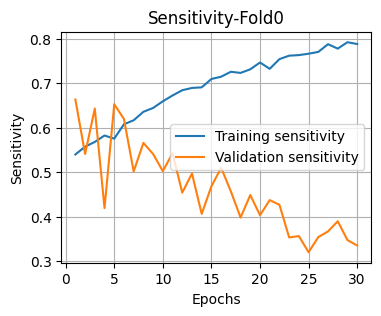

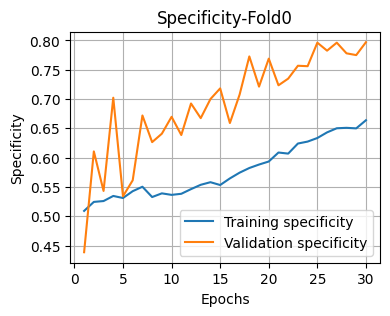

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.9 Dropout 0.5 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,717,603,29,53,0.646341,0.543182,0.080793,0.143631,0.079847,0.605091



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,717.0,603.0,29.0,53.0,0.646341,0.543182,0.080793,0.143631,0.079847,0.605091
mean,717.0,603.0,29.0,53.0,0.646300,0.543200,0.080800,0.143600,0.079800,0.605100
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.7; Reg_L2=1e-2

In [ ]:
Dropout=0.7
Reg_L2=1e-2

EPOCHS       = 50
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step
Epoch 1/50
170/170 - 9s - 53ms/step - loss: 2.6524 - roc_auc: 0.5125 - sensitivity: 0.4997 - specificity: 0.5204 - val_loss: 2.1271 - val_roc_auc: 0.5086 - val_sensitivity: 0.4636 - val_specificity: 0.5318
Epoch 2/50
170/170 - 3s - 18ms/step - loss: 2.0771 - roc_auc: 0.5179 - sensitivity: 0.5079 - specificity: 0.5119 - val_loss: 1.7946 - val_roc_auc: 0.5356 - val_sensitivity: 0.5144 - val_specificity: 0.5144
Epoch 3/50
170/170 - 3s - 18ms/step - loss: 1.7083 - roc_auc: 0.5181 - sensitivity: 0.5202 - specificity: 0.4958 - val_loss: 1.5204 - val_roc_auc: 0.5559 - val_sensitivity: 0.4500 - val_specificity: 0.6265
Epoch 4/50
170/170 - 3s - 19ms/step - loss: 1.4316 - roc_auc: 0.5245 - sensitivity: 0.5249 - specificity: 0.4999 - val_loss: 1.3031 - val_roc_auc: 0.5412 - val_sensitivity: 0.6538 - val_specificity: 0.4038
Epoch 5/50
170/170 - 3s - 18ms/step - loss: 1.2255 - roc_auc: 0.5347 - sensitivity: 0.5219 - specificity: 0.5273 - val

,Metric,Value
0,True Negatives,714.000000
1,False Positives,606.000000
2,False Negatives,29.000000
3,True Positives,53.000000
4,Sensitivity,0.646341
5,Specificity,0.540909
6,Precision,0.080425
7,F1 Score,0.143050
8,PR AUC,0.079385
9,ROC AUC,0.623235


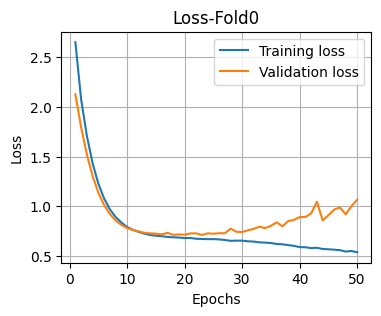

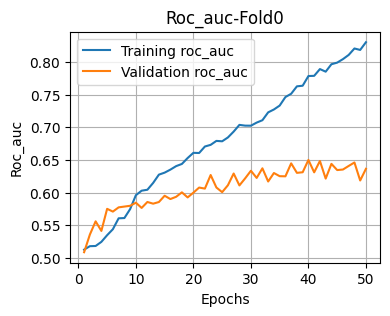

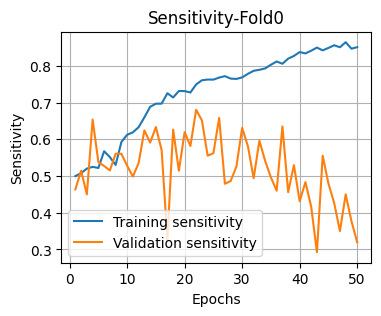

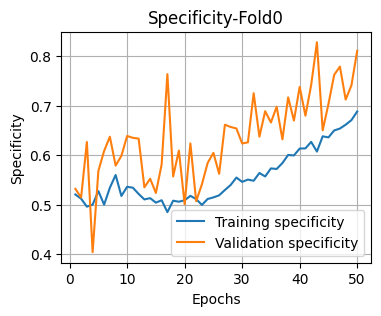

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.9 Dropout 0.7 Reg_L2 0.01

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,714,606,29,53,0.646341,0.540909,0.080425,0.14305,0.079385,0.623235



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,714.0,606.0,29.0,53.0,0.646341,0.540909,0.080425,0.14305,0.079385,0.623235
mean,714.0,606.0,29.0,53.0,0.646300,0.540900,0.080400,0.14300,0.079400,0.623200
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.7; Reg_L2=1e-4

In [ ]:
Dropout=0.7
Reg_L2=1e-4

EPOCHS       = 50
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step
Epoch 1/50
170/170 - 9s - 55ms/step - loss: 1.1976 - roc_auc: 0.5262 - sensitivity: 0.5091 - specificity: 0.5234 - val_loss: 0.7354 - val_roc_auc: 0.5530 - val_sensitivity: 0.4583 - val_specificity: 0.6303
Epoch 2/50
170/170 - 3s - 20ms/step - loss: 0.8862 - roc_auc: 0.5294 - sensitivity: 0.5164 - specificity: 0.5298 - val_loss: 0.7109 - val_roc_auc: 0.5683 - val_sensitivity: 0.2705 - val_specificity: 0.7932
Epoch 3/50
170/170 - 3s - 19ms/step - loss: 0.7811 - roc_auc: 0.5237 - sensitivity: 0.5019 - specificity: 0.5347 - val_loss: 0.7073 - val_roc_auc: 0.5684 - val_sensitivity: 0.2114 - val_specificity: 0.8402
Epoch 4/50
170/170 - 3s - 20ms/step - loss: 0.7418 - roc_auc: 0.5240 - sensitivity: 0.4966 - specificity: 0.5337 - val_loss: 0.7040 - val_roc_auc: 0.5754 - val_sensitivity: 0.6576 - val_specificity: 0.4886
Epoch 5/50
170/170 - 3s - 19ms/step - loss: 0.7192 - roc_auc: 0.5459 - sensitivity: 0.5387 - specificity: 0.5256 - val

,Metric,Value
0,True Negatives,753.000000
1,False Positives,567.000000
2,False Negatives,35.000000
3,True Positives,47.000000
4,Sensitivity,0.573171
5,Specificity,0.570455
6,Precision,0.076547
7,F1 Score,0.135057
8,PR AUC,0.076262
9,ROC AUC,0.592683


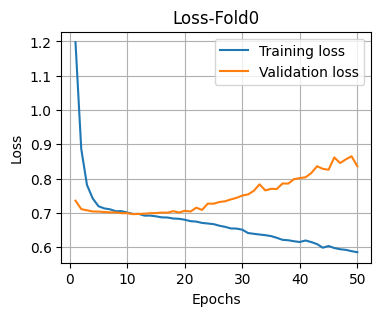

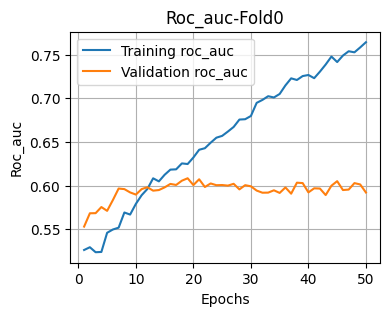

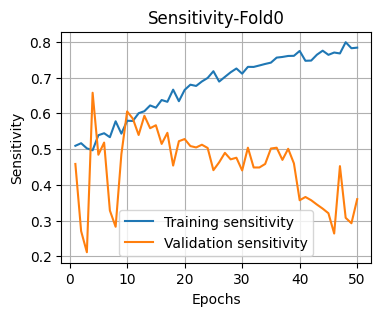

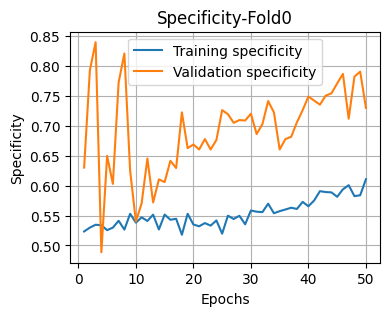

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.9 Dropout 0.7 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,753,567,35,47,0.573171,0.570455,0.076547,0.135057,0.076262,0.592683



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,753.0,567.0,35.0,47.0,0.573171,0.570455,0.076547,0.135057,0.076262,0.592683
mean,753.0,567.0,35.0,47.0,0.573200,0.570500,0.076500,0.135100,0.076300,0.592700
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.9; Reg_L2=1e-2

In [ ]:
Dropout=0.9
Reg_L2=1e-2

EPOCHS       = 100
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step
Epoch 1/100
170/170 - 9s - 56ms/step - loss: 3.6881 - roc_auc: 0.5066 - sensitivity: 0.5199 - specificity: 0.4960 - val_loss: 2.3158 - val_roc_auc: 0.5867 - val_sensitivity: 0.5530 - val_specificity: 0.5598
Epoch 2/100
170/170 - 3s - 20ms/step - loss: 2.8325 - roc_auc: 0.5198 - sensitivity: 0.5012 - specificity: 0.5262 - val_loss: 2.1297 - val_roc_auc: 0.5802 - val_sensitivity: 0.4000 - val_specificity: 0.6917
Epoch 3/100
170/170 - 3s - 20ms/step - loss: 2.3416 - roc_auc: 0.5058 - sensitivity: 0.4866 - specificity: 0.5197 - val_loss: 1.9717 - val_roc_auc: 0.5604 - val_sensitivity: 0.2970 - val_specificity: 0.7545
Epoch 4/100
170/170 - 3s - 20ms/step - loss: 1.9823 - roc_auc: 0.5198 - sensitivity: 0.4927 - specificity: 0.5387 - val_loss: 1.8066 - val_roc_auc: 0.5390 - val_sensitivity: 0.4750 - val_specificity: 0.5742
Epoch 5/100
170/170 - 3s - 19ms/step - loss: 1.7603 - roc_auc: 0.5054 - sensitivity: 0.4984 - specificity: 0.5156 

,Metric,Value
0,True Negatives,813.000000
1,False Positives,507.000000
2,False Negatives,32.000000
3,True Positives,50.000000
4,Sensitivity,0.609756
5,Specificity,0.615909
6,Precision,0.089767
7,F1 Score,0.156495
8,PR AUC,0.074754
9,ROC AUC,0.601266


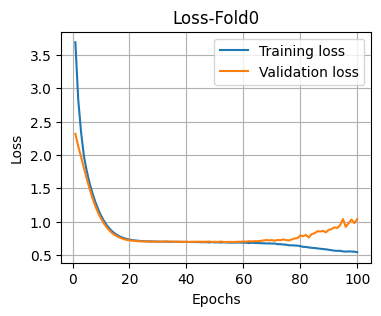

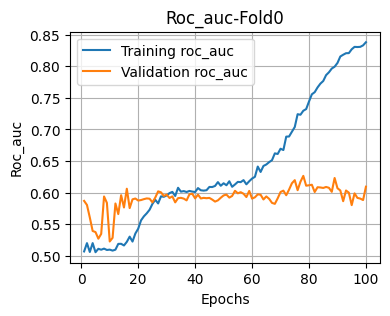

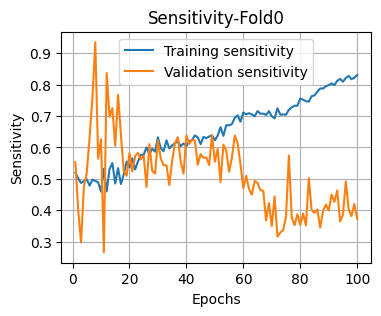

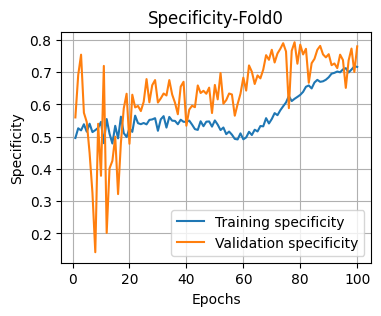

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.9 Dropout 0.9 Reg_L2 0.01

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,813,507,32,50,0.609756,0.615909,0.089767,0.156495,0.074754,0.601266



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,813.0,507.0,32.0,50.0,0.609756,0.615909,0.089767,0.156495,0.074754,0.601266
mean,813.0,507.0,32.0,50.0,0.609800,0.615900,0.089800,0.156500,0.074800,0.601300
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# history = history_record[0]
# plot_learning_curves(history, name=f'Fold{fold}',
#                      metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
#                      init_index=50)


### Dropout 0.9; Reg_L2=1e-4

In [ ]:
Dropout=0.9
Reg_L2=1e-4

EPOCHS       = 100
PATIENCE_ES  = 50


=== Fold 0 ===
339/339 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step
Epoch 1/100
170/170 - 9s - 56ms/step - loss: 2.0857 - roc_auc: 0.5132 - sensitivity: 0.5047 - specificity: 0.5189 - val_loss: 0.7659 - val_roc_auc: 0.5420 - val_sensitivity: 0.6280 - val_specificity: 0.4061
Epoch 2/100
170/170 - 4s - 21ms/step - loss: 1.4121 - roc_auc: 0.4963 - sensitivity: 0.5079 - specificity: 0.4835 - val_loss: 0.7109 - val_roc_auc: 0.5652 - val_sensitivity: 0.6811 - val_specificity: 0.3750
Epoch 3/100
170/170 - 4s - 21ms/step - loss: 0.9899 - roc_auc: 0.4947 - sensitivity: 0.5117 - specificity: 0.4779 - val_loss: 0.7036 - val_roc_auc: 0.5711 - val_sensitivity: 0.5629 - val_specificity: 0.5182
Epoch 4/100
170/170 - 3s - 20ms/step - loss: 0.8114 - roc_auc: 0.4976 - sensitivity: 0.4929 - specificity: 0.5030 - val_loss: 0.7077 - val_roc_auc: 0.5732 - val_sensitivity: 0.8068 - val_specificity: 0.2886
Epoch 5/100
170/170 - 4s - 21ms/step - loss: 0.7407 - roc_auc: 0.5024 - sensitivity: 0.5162 - specificity: 0.4970 

,Metric,Value
0,True Negatives,765.000000
1,False Positives,555.000000
2,False Negatives,32.000000
3,True Positives,50.000000
4,Sensitivity,0.609756
5,Specificity,0.579545
6,Precision,0.082645
7,F1 Score,0.145560
8,PR AUC,0.072870
9,ROC AUC,0.592147


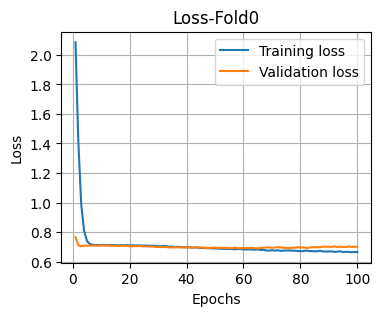

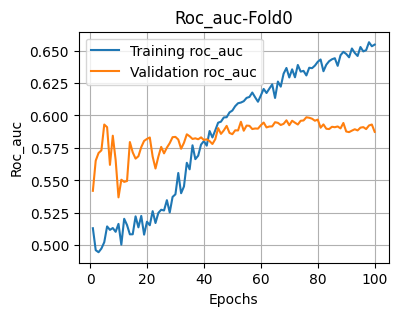

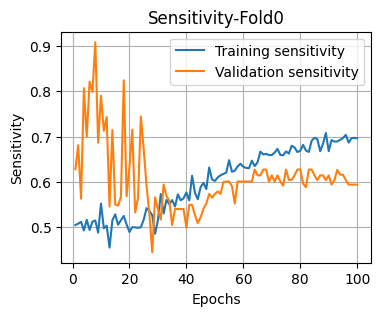

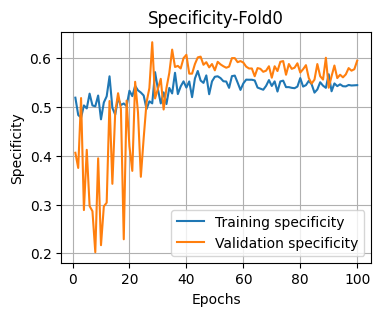

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from keras.callbacks import EarlyStopping
from keras import optimizers
# import tensorflow_addons as tfa
# from keras.optimizers import AdamW

cols_needed = ['CurrentNight', 'Delta', "Label", "Fold"]
df = NightAndDelta_dataset_Continuous[cols_needed].copy()

metric_names = [
    "tn", "fp", "fn", "tp",
    "sensitivity", "specificity",
    "precision", "f1_score",
    "PR_auc", "ROC_auc"
]
metrics = {name: [] for name in metric_names}
history_record = {}

for fold in sorted(df["Fold"].unique()):
    print(f"\n=== Fold {fold} ===")

    history, metrics = run_fold_training(
        df,
        metrics,
        encoders=encoders,
        pretrain_autoencoder=pretrain_autoencoder,
        raw_init_w=raw_init_w,
        dropout=Dropout,
        reg_l2=Reg_L2,
        init_lr=INIT_LR,
        weight_decay=WEIGHT_DECAY,
        epochs=EPOCHS,
        patience_es=PATIENCE_ES,
        mask_rate=MASK_RATE,
        batch_size=BATCH_SIZE
    )

    history_record[fold] = history

    break


In [ ]:
print("MASK_RATE", MASK_RATE, "Dropout", Dropout, 'Reg_L2', Reg_L2)
# ------------------------------------------------------------------
# Display all folds + an aggregate summary
# ------------------------------------------------------------------
metrics_df = pd.DataFrame(metrics)
print("\nPer-fold metrics:")
display(metrics_df)

print("\nMean ± std across folds:")
summary_df = metrics_df.agg(["mean", "std"]).round(4)
display(pd.concat([metrics_df,summary_df]))

MASK_RATE 0.9 Dropout 0.9 Reg_L2 0.0001

Per-fold metrics:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,765,555,32,50,0.609756,0.579545,0.082645,0.14556,0.07287,0.592147



Mean ± std across folds:


,tn,fp,fn,tp,sensitivity,specificity,precision,f1_score,PR_auc,ROC_auc
0,765.0,555.0,32.0,50.0,0.609756,0.579545,0.082645,0.14556,0.07287,0.592147
mean,765.0,555.0,32.0,50.0,0.609800,0.579500,0.082600,0.14560,0.07290,0.592100
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


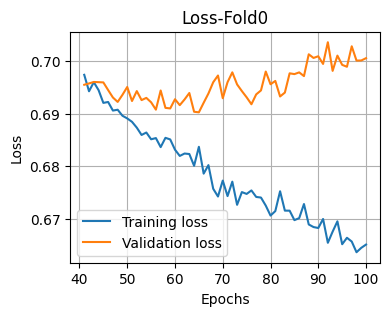

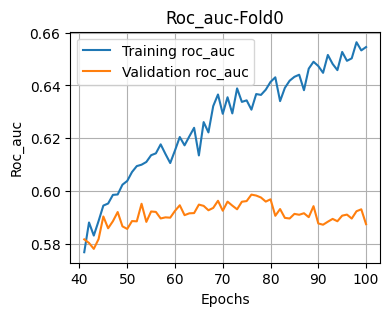

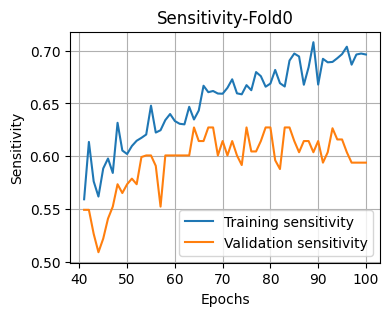

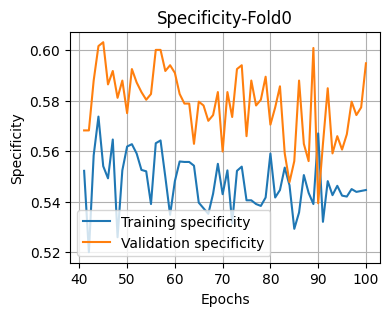

In [ ]:
history = history_record[0]
plot_learning_curves(history, name=f'Fold{fold}',
                     metric_name_li=['loss', 'roc_auc', 'sensitivity', 'specificity'],
                     init_index=40)
